In [ ]:
import pandas as pd


# import the data
trainDataset_w_aug = pd.read_csv('Datasets/VanilaDataset/trainDataset_w_aug.csv')
testDataset_w_aug = pd.read_csv('Datasets/VanilaDataset/testDataset_w_aug.csv')

trainDataset = trainDataset_w_aug
testDataset = testDataset_w_aug

# Test Rocket


In [21]:
# Create a temporary DataFrame with level 0 indexes and the 'Pattern' column
temp_df = trainDataset.reset_index(level=0)  # Resetting level 1 index to create a flat DataFrame
# drop all the columns except the 'Pattern' column and the Level_0 column
temp_df = temp_df[['Instance','Pattern']]

# drop all the duplicate rows in the temp_df dataframe
temp_df = temp_df.drop_duplicates()

# get the number of each unique value in the 'Pattern' column
pattern_counts = temp_df['Pattern'].value_counts()
print(pattern_counts)

Pattern
4    532
1    421
0    370
3    285
5    260
2    232
6    163
7     52
Name: count, dtype: int64


In [22]:
# split the trainDataset_aug_encoded dataframe into X_train and y_train and the testDataset_encoded dataframe into X_test and y_test
X_train = trainDataset.drop(columns='Pattern')
y_train = trainDataset['Pattern']

X_test = testDataset.drop(columns='Pattern')
y_test = testDataset['Pattern']

# drop level 1 indexes from y_train and y_test
y_train = y_train.droplevel(1)
y_test = y_test.droplevel(1)
# now group the y_train and y_test by their indexes
y_train = y_train.groupby(y_train.index).first()
y_test = y_test.groupby(y_test.index).first()

# Display the shapes of the training and testing sets
print(f"X_train Shape: {X_train.shape}, y_train Shape: {y_train.shape}")
print(f"X_test Shape: {X_test.shape}, y_test Shape: {y_test.shape}")

X_train Shape: (59983, 5), y_train Shape: (2315,)
X_test Shape: (14952, 5), y_test Shape: (578,)


In [23]:
#  save test and train data to csv
X_train.to_csv('Datasets/VanilaDataset/X-Y Splitted Data/X_train.csv')
y_train.to_csv('Datasets/VanilaDataset/X-Y Splitted Data/y_train.csv')
X_test.to_csv('Datasets/VanilaDataset/X-Y Splitted Data/X_test.csv')
y_test.to_csv('Datasets/VanilaDataset/X-Y Splitted Data/y_test.csv')



In [24]:
from sktime.datatypes import check_is_mtype

check_is_mtype(X_train, mtype="pd-multiindex", return_metadata=True)

(True,
 None,
 {'is_univariate': False,
  'is_empty': False,
  'has_nans': False,
  'n_features': 5,
  'feature_names': ['Open', 'High', 'Low', 'Close', 'Volume'],
  'dtypekind_dfip': [<DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>],
  'feature_kind': [<DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>],
  'n_instances': 2315,
  'is_one_series': False,
  'is_equal_length': False,
  'is_equally_spaced': True,
  'n_panels': 1,
  'is_one_panel': True,
  'mtype': 'pd-multiindex',
  'scitype': 'Panel'})

In [25]:
X_train

Open      High       Low     Close    Volume
Instance Time                                                  
0        0     0.242925  0.491745  0.204010  0.459316  0.223707
         1     0.503538  0.574882  0.310731  0.375590  1.000000
         2     0.385614  0.620872  0.364387  0.579010  0.217456
         3     0.580188  0.667453  0.407429  0.534788  0.144364
         4     0.473467  0.715802  0.408019  0.411557  0.195286
...                 ...       ...       ...       ...       ...
2314     3     0.408296  0.868066  0.192404  0.627186  0.216108
         4     0.488256  0.520739  0.265367  0.488755  0.032961
         5     0.630685  0.910544  0.549725  0.633183  0.220893
         6     0.524238  0.600700  0.325338  0.432784  0.477140
         7     0.303848  0.377811  0.080460  0.341829  0.548511

[59983 rows x 5 columns]

Accuracy: 0.79


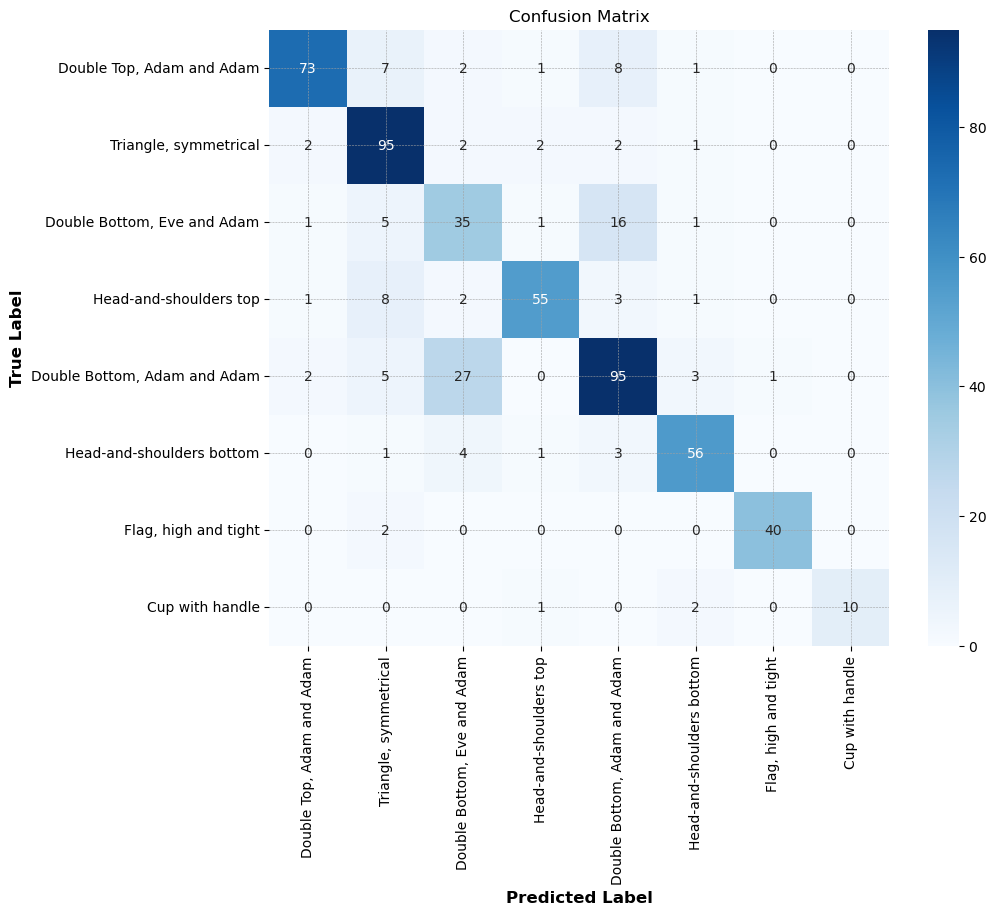

In [26]:
from sktime.classification.kernel_based import RocketClassifier
from sktime.transformations.panel.padder import PaddingTransformer
from sktime.datasets import load_unit_test
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

my_padded_multi_rocket = PaddingTransformer() * RocketClassifier(rocket_transform='multirocket')
my_padded_multi_rocket.fit(X_train, y_train)
y_pred_multi = my_padded_multi_rocket.predict(X_test) 

# calculate the accuracy of the model
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred_multi)
print(f"Accuracy: {accuracy:.2f}")

# Create the confusion matrix
cm3 = confusion_matrix(y_test, y_pred_multi)

# Create a DataFrame from the confusion matrix
cm_df3 = pd.DataFrame(cm3, index=pattern_encoding.keys(), columns=pattern_encoding.keys())

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cm_df3, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


# Hivecote 2.0 test


In [ ]:
bjjbjbj

In [27]:
import os
import time
import joblib
from sktime.classification.kernel_based import RocketClassifier
from sktime.classification.shapelet_based import ShapeletLearningClassifierTslearn
from sktime.classification.shapelet_based import ShapeletTransformClassifier
from sktime.classification.interval_based import TimeSeriesForestClassifier
from sktime.classification.dictionary_based import BOSSEnsemble
from sktime.classification.deep_learning import InceptionTimeClassifier
from sktime.classification.hybrid import HIVECOTEV2
from sktime.classification.interval_based import DrCIF
from sktime.transformations.panel.padder import PaddingTransformer
from sklearn.metrics import accuracy_score, confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define the classifiers to test (with correct MiniRocket and MultiRocket setup)
classifiers = {
    "ROCKET": RocketClassifier(rocket_transform='rocket'),
    "MiniROCKET": RocketClassifier(rocket_transform='minirocket'),
    "MultiROCKET": RocketClassifier(rocket_transform='multirocket'),  # MultiRocket definition
    # "InceptionTime": InceptionTimeClassifier(),
    # 'ShapeletLearningTslearn': ShapeletLearningClassifierTslearn(),
    "HIVE-COTE": HIVECOTEV2(),
    "DrCIF": DrCIF()
}

# Initialize a dictionary to store results
results = {}

# Create folder for saving trained models
model_save_dir = 'test_models'
os.makedirs(model_save_dir, exist_ok=True)

# Iterate over classifiers
for name, clf in classifiers.items():
    print(f"Training and testing classifier: {name}")
    
    # Initialize a Padding Transformer
    padder = PaddingTransformer()

    # Apply padding and fit the classifier
    pipeline = padder * clf
    
    # Fit the classifier and save the trained model
    start_time_train = time.time()
    pipeline.fit(X_train, y_train)
    end_time_train = time.time()
    train_duration = end_time_train - start_time_train
    print(f"{name} Training Time: {train_duration:.2f} seconds")
    
    # Save the trained model
    joblib.dump(pipeline, os.path.join(model_save_dir, f"{name}_model.pkl"))
    
    # Measure prediction time
    start_time_predict = time.time()
    y_pred = pipeline.predict(X_test)
    end_time_predict = time.time()
    predict_duration = end_time_predict - start_time_predict
    print(f"{name} Prediction Time: {predict_duration:.2f} seconds")

    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{name} Accuracy: {accuracy:.2f}")
    
    # Store results
    results[name] = {
        "accuracy": accuracy,
        "y_pred": y_pred,
        "train_duration": train_duration,
        "predict_duration": predict_duration
    }

    # Calculate the confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Create a DataFrame from the confusion matrix (adjusting to your 'pattern_encoding' if needed)
    cm_df = pd.DataFrame(cm, index=pattern_encoding.keys(), columns=pattern_encoding.keys())

    # Plot confusion matrix heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_df, annot=True, cmap='Blues', fmt='g')
    plt.title(f'Confusion Matrix - {name}')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

# Display final accuracy comparison
accuracy_results = {name: result["accuracy"] for name, result in results.items()}
accuracy_df = pd.DataFrame(list(accuracy_results.items()), columns=["Classifier", "Accuracy"])

# Plotting the accuracy comparison
plt.figure(figsize=(10, 6))
sns.barplot(x="Classifier", y="Accuracy", data=accuracy_df)
plt.title("Classifier Accuracy Comparison")
plt.ylabel("Accuracy")
plt.show()

# Print detailed timing results
for name, result in results.items():
    print(f"\n{name} Results:")
    print(f"Accuracy: {result['accuracy']:.2f}")
    print(f"Training Time: {result['train_duration']:.2f} seconds")
    print(f"Prediction Time: {result['predict_duration']:.2f} seconds")


Training and testing classifier: ROCKET


KeyboardInterrupt: 

# Data Augment


In [30]:
import numpy as np
import pandas as pd
import mplfinance as mpf
import matplotlib.pyplot as plt



# Define a linear trend function (y = a*x + b)
def linear_trend(x, slope=0.1, intercept=0):
    return slope * x + intercept

# Define a non-linear (quadratic) trend function (y = a*x^2 + b*x + c)
def quadratic_trend(x, a=0.001, b=0.01, c=0):
    return a * x**2 + b * x + c

# Define a sine wave trend function
def sine_trend(x, amplitude=0.02, frequency=0.05 ):
    return amplitude * np.sin(frequency * x)

def traindata_augment(Dataset):
    # Define the number of samples to generate
    n_total_samples = 500
    # Create a counter for generating new first-level indices
    new_first_level_counter = Dataset.index.get_level_values(0).max() + 1

    # Loop through the unique chart patterns in the Dataset
    for pattern in Dataset['Pattern'].unique():
        # Filter the Dataset for the current pattern
        pattern_data = Dataset[Dataset['Pattern'] == pattern]

        # Get the unique values from the first level of the multi-index
        unique_first_level_index = pattern_data.index.get_level_values(0).unique()

        # Set the number of augmented samples to create
        n_samples = n_total_samples - len(unique_first_level_index)

        # Loop through the number of samples to generate
        for i in range(n_samples):
            # Randomly select a section of the DataFrame based on the first-level index
            random_first_level_value = np.random.choice(unique_first_level_index)
            random_section = pattern_data.loc[(random_first_level_value, slice(None)), :]

            # Get the difference between max and min of Close column
            diff = random_section['Close'].max() - random_section['Close'].min()
            adjusted_diff = np.log(1 + diff)  # Adding 1 to avoid log(0)

            # Introduce randomness into the noise level
            noise_level = adjusted_diff * (0.08 + np.random.uniform(-0.01, 0.01))  # Adding random factor
            sub_noise_level = adjusted_diff * (0.01 + np.random.uniform(-0.004, 0.004))  # Adding random factor

            x_values = np.arange(len(random_section))

            # Randomly select a trend function
            trend_function = np.random.choice([linear_trend, quadratic_trend, sine_trend])

            print(f"\nSelected Chart Pattern: {pattern}")
            print(f"\nSelected Trend Function: {trend_function.__name__}")

            # Modify the trend function parameters based on price range and random factors
            if trend_function == linear_trend:
                slope = np.random.uniform(0.005, 0.05) * adjusted_diff * (0.4 + np.random.uniform(-0.01, 0.01))   # Slope depends on price difference
                trend = linear_trend(x_values, slope=slope)
                print('slope:', slope)
            elif trend_function == quadratic_trend:
                a = np.random.uniform(0.00001, 0.0005) * adjusted_diff * (0.4 + np.random.uniform(-0.01, 0.01))   # Quadratic coefficient scaled by diff
                b = np.random.uniform(0.001, 0.01) * adjusted_diff
                trend = quadratic_trend(x_values, a=a, b=b)
                print('a:', a, 'b:', b)
            else:  # sine_trend
                amplitude = np.random.uniform(0.05, 1.2) * adjusted_diff * (0.4 + np.random.uniform(-0.01, 0.01))   # Amplitude depends on price difference
                frequency = np.random.uniform(0.01, 1)
                trend = sine_trend(x_values, amplitude=amplitude, frequency=frequency)
                print('amplitude:', amplitude, 'frequency:', frequency)

            # Plot the trend function
            plt.figure(figsize=(3, 2))
            plt.plot(x_values, trend, label=f'{trend_function.__name__}')
            plt.title('Trend Function Plot')
            plt.xlabel('x')
            plt.ylabel('y')
            plt.legend()
            plt.grid(True)
            plt.show()

            # Add random noise (minor noise level) for variation in individual OHLC points
            noise = np.random.normal(0, sub_noise_level, random_section[['Open', 'High', 'Low', 'Close', 'Volume']].shape)
            noisy_data = random_section[['Open', 'High', 'Low', 'Close', 'Volume']] + noise

            # Add consistent noise across the same row (major noise level)
            row_noise = np.random.normal(0, noise_level, random_section[['Open']].shape)
            noisy_data['Open'] = random_section['Open'] + row_noise.squeeze()
            noisy_data['High'] = random_section['High'] + row_noise.squeeze()
            noisy_data['Low'] = random_section['Low'] + row_noise.squeeze()
            noisy_data['Close'] = random_section['Close'] + row_noise.squeeze()
            # noisy_data['Adj Close'] = random_section['Adj Close'] + row_noise.squeeze()
            noisy_data['Volume'] = random_section['Volume'] + row_noise.squeeze()

            # Add the trend equally to all OHLC columns
            noisy_data['Open'] += trend
            noisy_data['High'] += trend
            noisy_data['Low'] += trend
            noisy_data['Close'] += trend
            # noisy_data['Adj Close'] += trend
            noisy_data['Volume'] += trend  # You can adjust the impact of the trend on Volume if needed

            # Assign new first-level index to the noisy_data
            new_first_level_index = pd.MultiIndex.from_product([[new_first_level_counter], random_section.index.get_level_values(1)], names=['Index', 'Date'])
            noisy_data.index = new_first_level_index

            # Increment the first-level counter for the next sample
            new_first_level_counter += 1

            # Visualize the original and noisy data using candlestick charts
            
            # Prepare original and noisy data for plotting (OHLC only)
            original_data_for_plot = random_section[['Open', 'High', 'Low', 'Close']].reset_index(drop=True)
            augmented_data_for_plot = noisy_data[['Open', 'High', 'Low', 'Close']].reset_index(drop=True)

            # Create two subplots to compare original and noisy data
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))

            # Create a DatetimeIndex for the plots (ensure it matches the number of rows in the data)
            date_range = pd.date_range(start='2024-01-01', periods=len(original_data_for_plot), freq='D')

            # Assign the index to the original and noisy data for plotting
            original_data_for_plot.index = date_range
            augmented_data_for_plot.index = date_range

            # Plot the original data
            mpf.plot(original_data_for_plot, type='candle', ax=axes[0], style='yahoo', volume=False)
            axes[0].grid(True)  # Enable gridlines
            axes[0].set_title("Original OHLC Candlestick Chart")

            # Plot the noisy data (augmented with trend)
            mpf.plot(augmented_data_for_plot, type='candle', ax=axes[1], style='yahoo', volume=False)
            axes[1].grid(True)  # Enable gridlines
            axes[1].set_title("Augmented OHLC Candlestick Chart with Trend")

            # Show the comparison plots
            plt.tight_layout()
            plt.show()
            
            # add Pattern column to the noisy data
            noisy_data['Pattern'] = pattern

            # Concatenate the noisy data to the original Dataset
            Dataset = pd.concat([Dataset, noisy_data], axis=0)

    return Dataset




Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 8.582805088424784e-06 b: 0.0016694638475064343


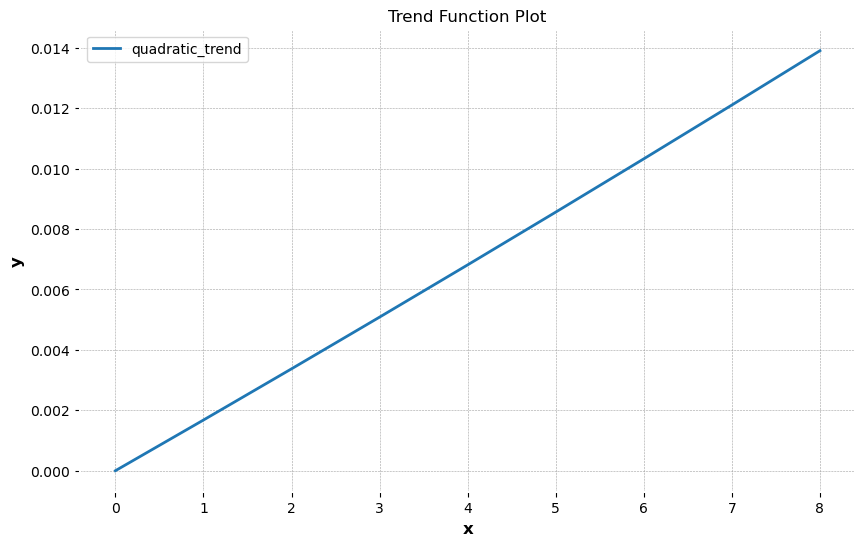

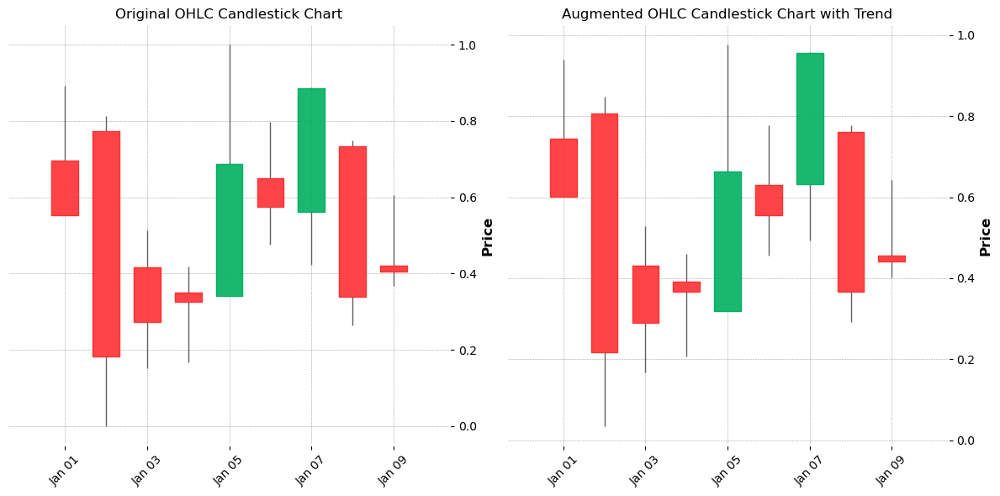


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 3.207757140196611e-05 b: 0.0031564851108774107


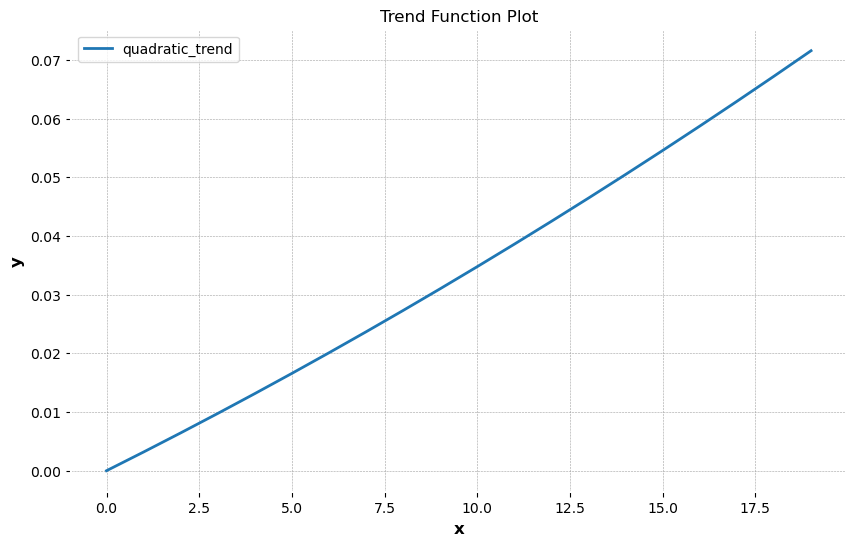

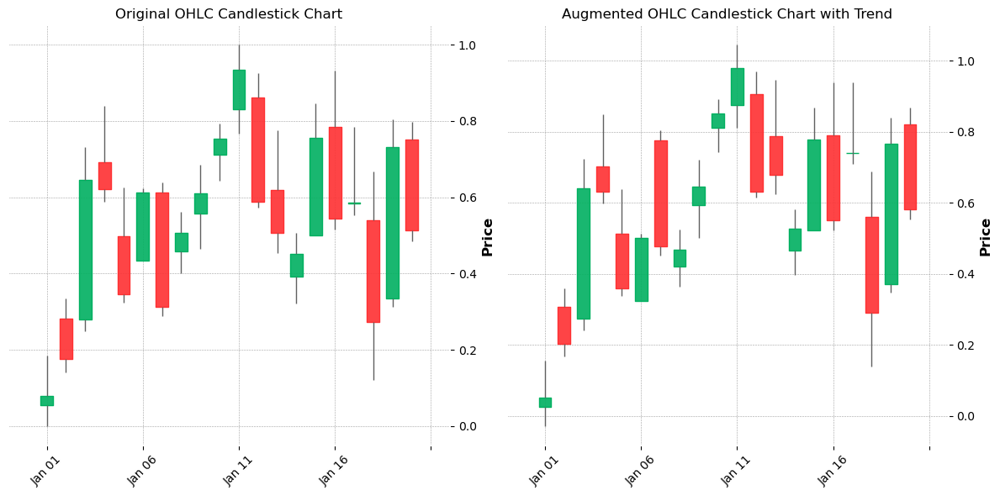


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.0076434510303633515


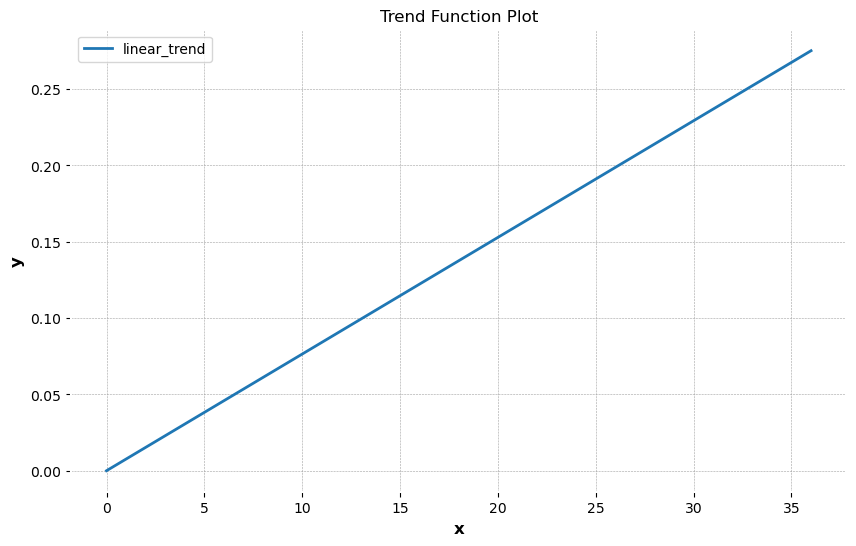

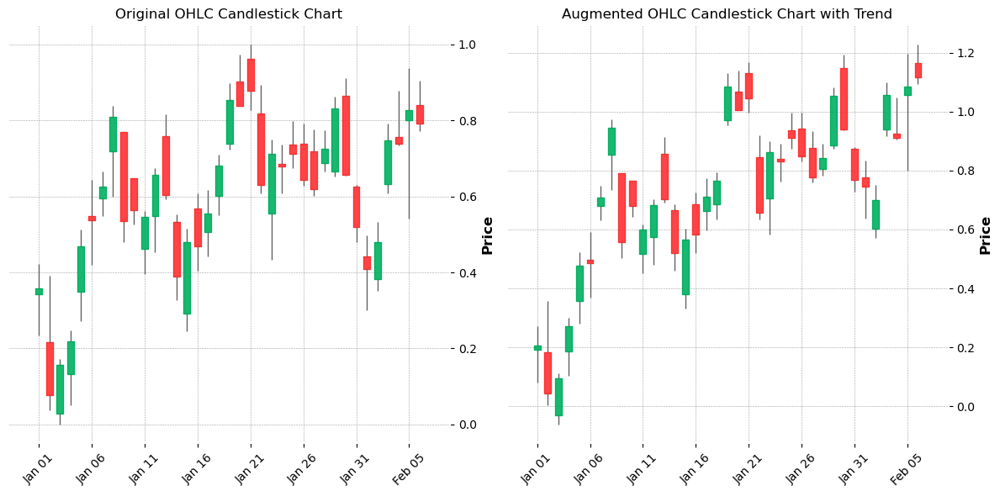


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.03395093857980993 frequency: 0.1121308386474097


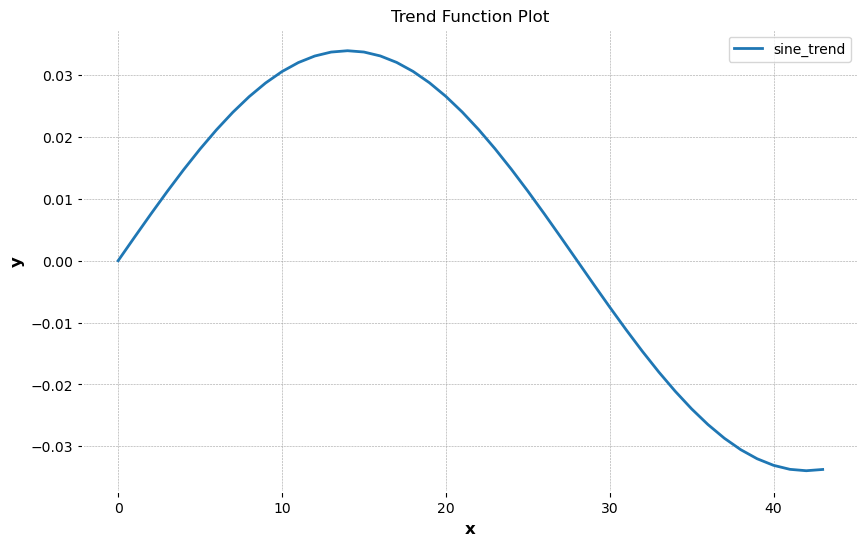

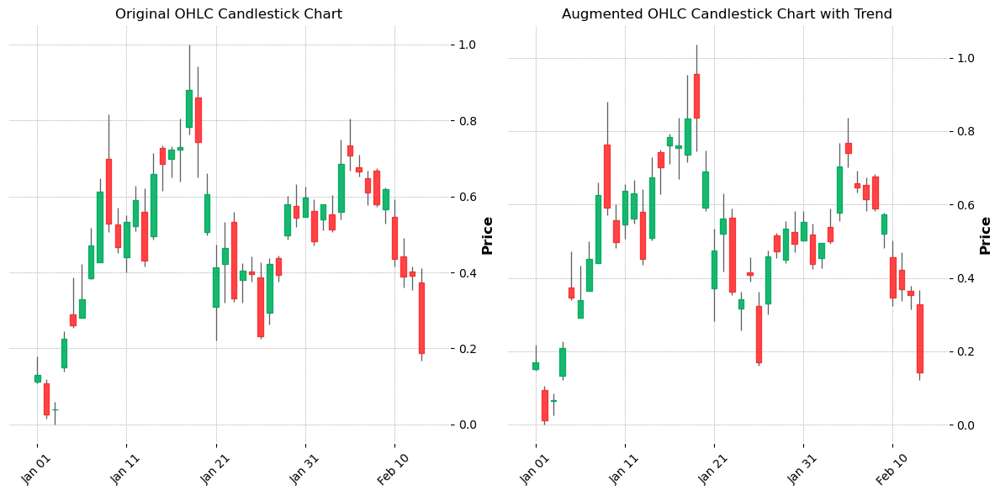


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 3.706986750705672e-05 b: 0.0007510320645618771


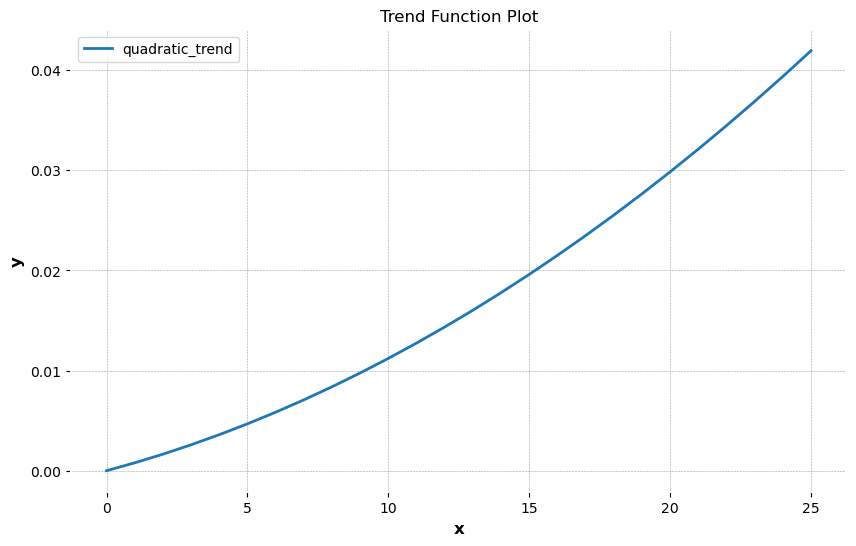

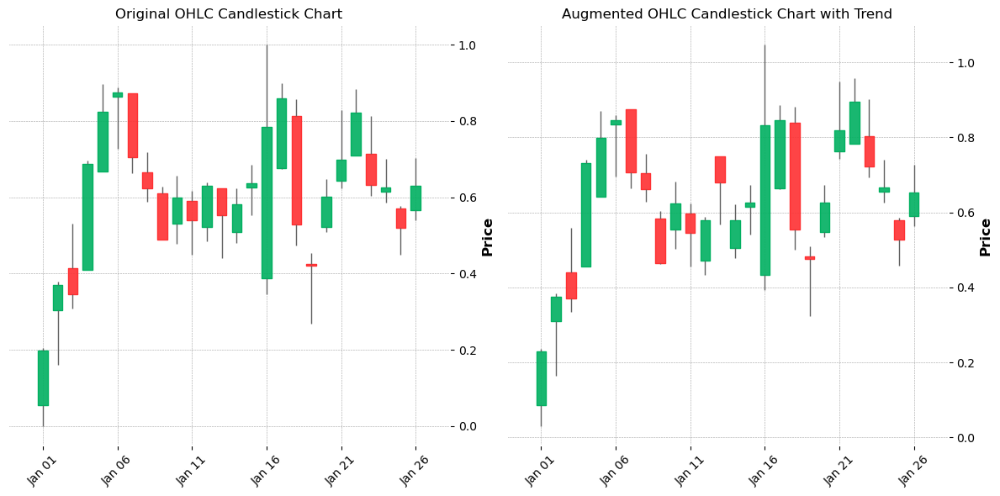


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 6.18256370992768e-05 b: 0.002001906684593


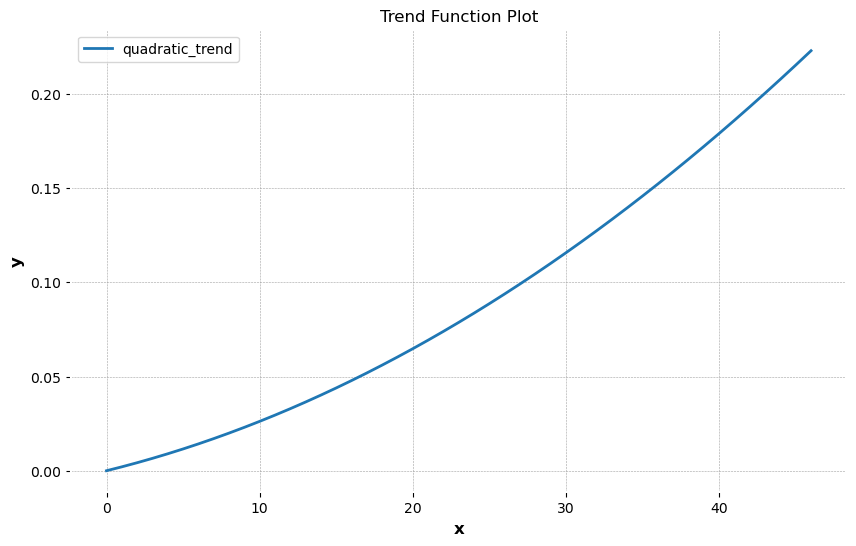

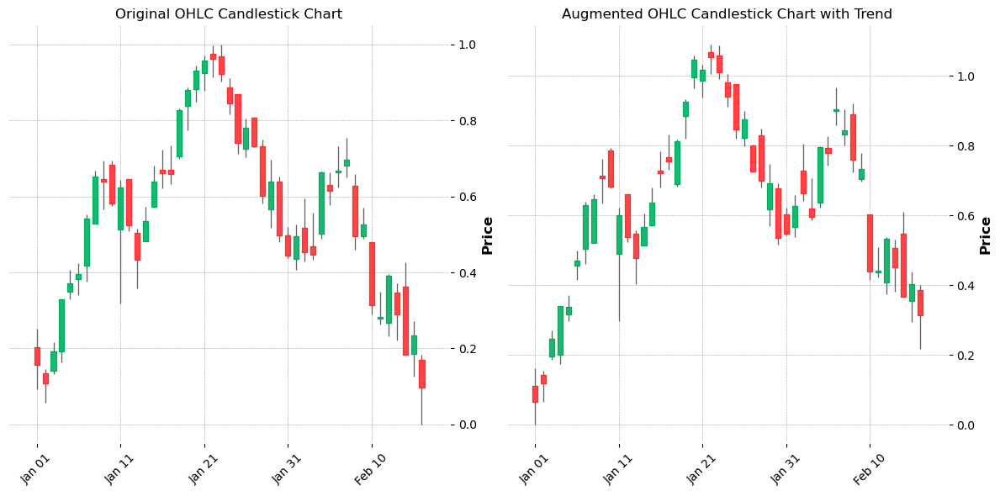


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.13250675145417787 frequency: 0.1401389954614918


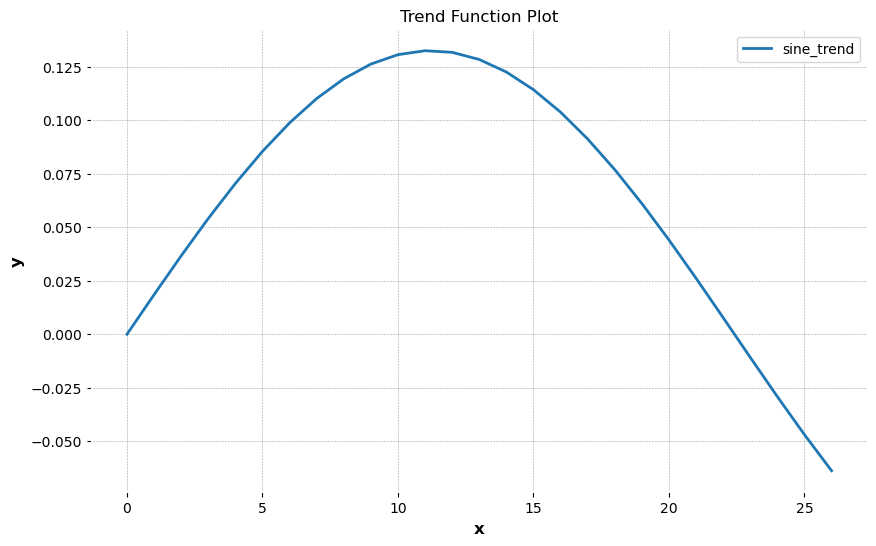

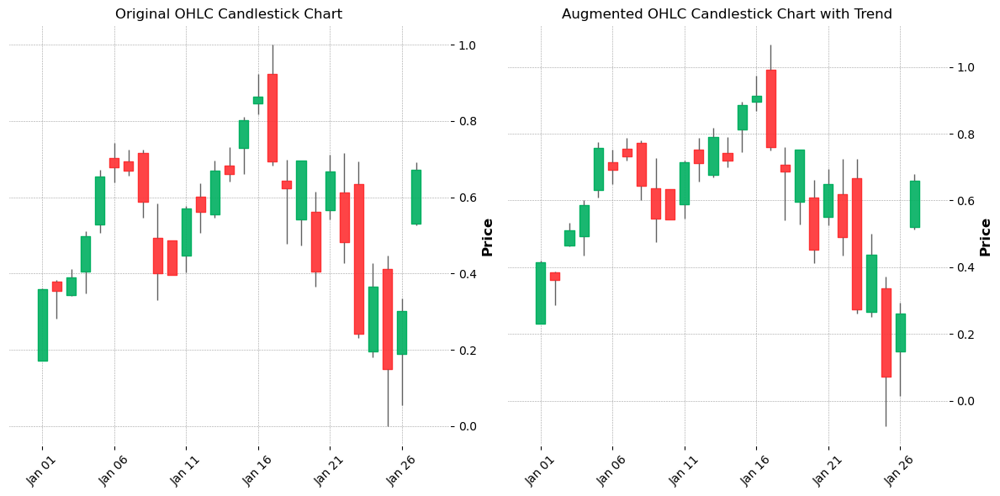


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.13885152454573607 frequency: 0.7760427576924669


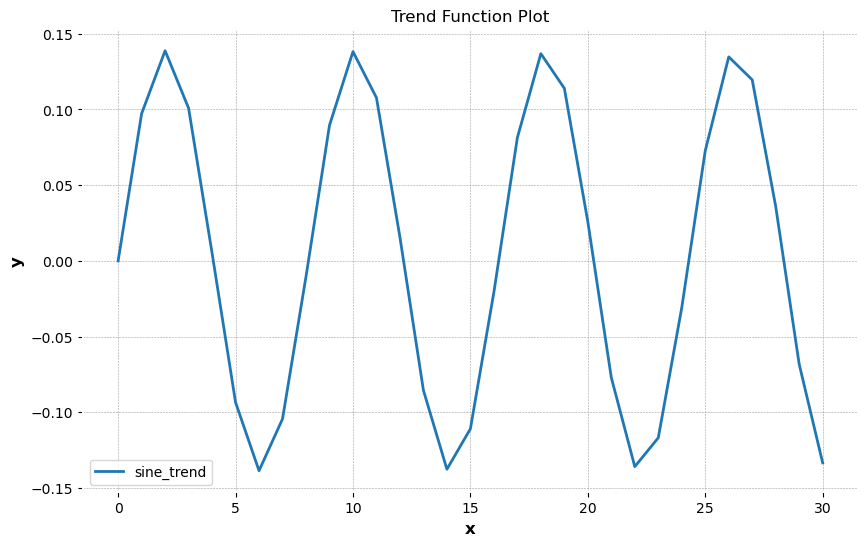

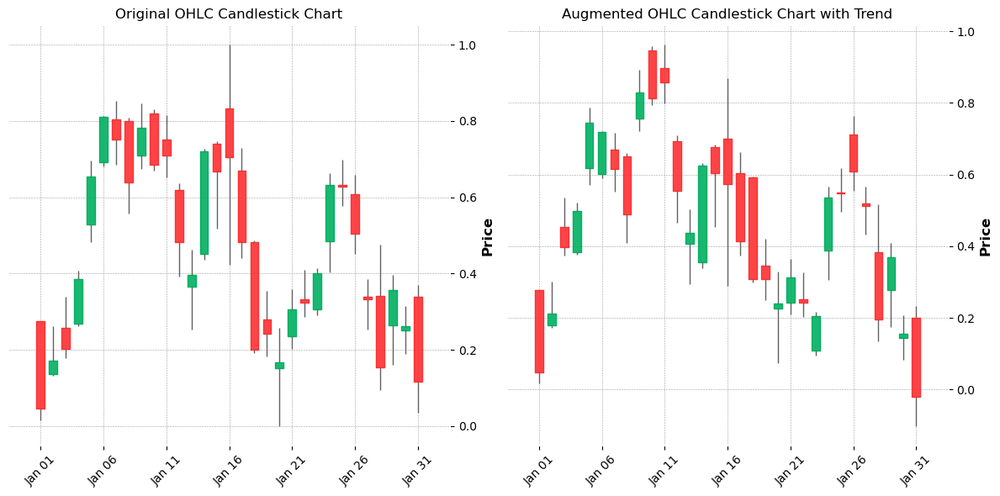


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 1.6059314982998383e-05 b: 0.0005591161311232539


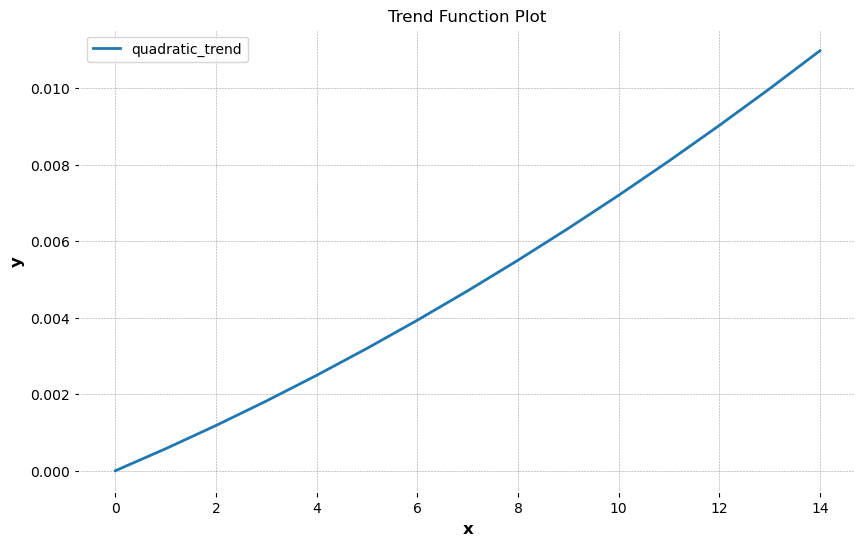

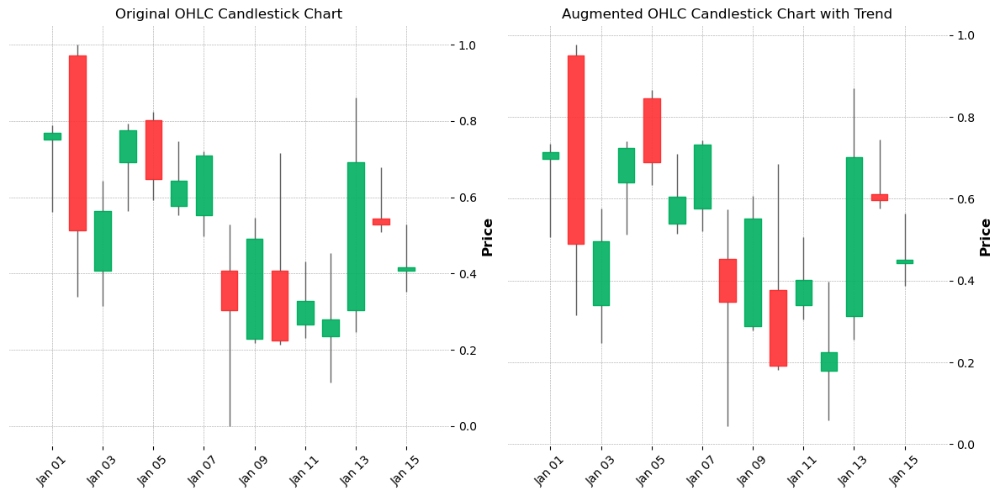


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.10362537283828405 frequency: 0.12623582487562526


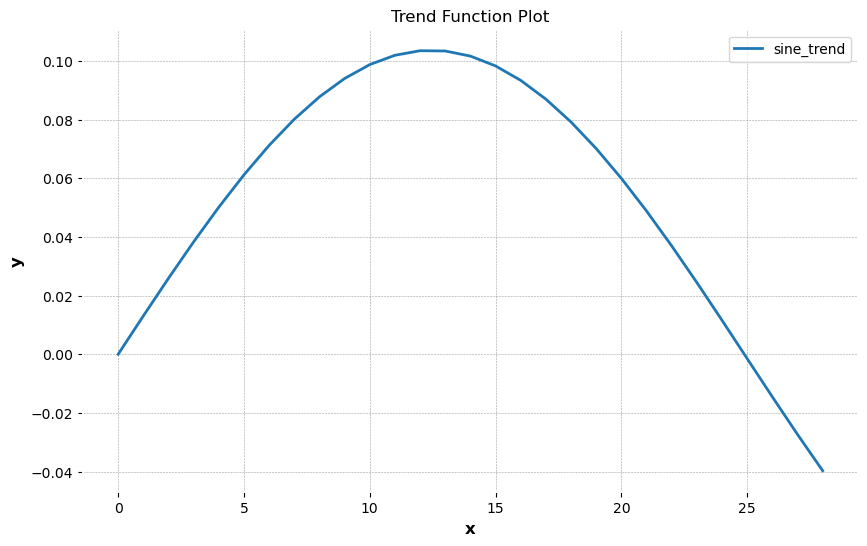

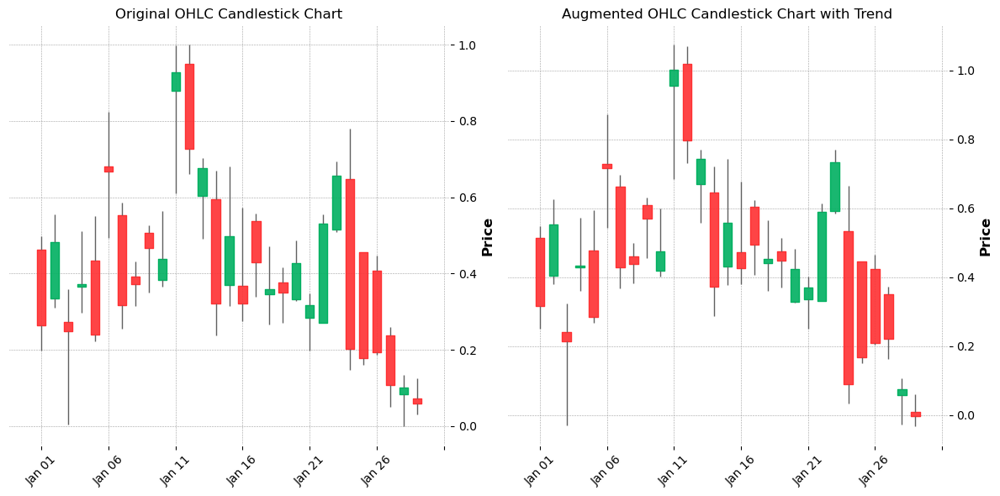


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 2.676861050503002e-05 b: 0.0008297533490141999


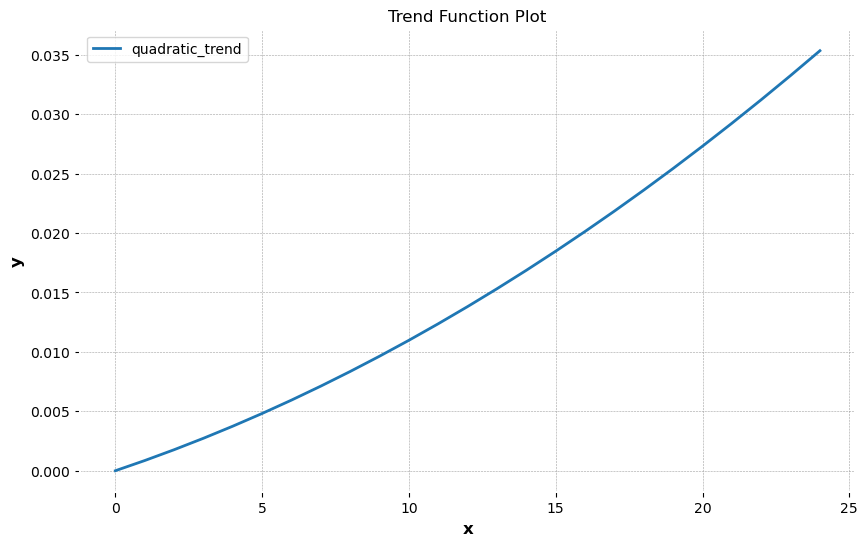

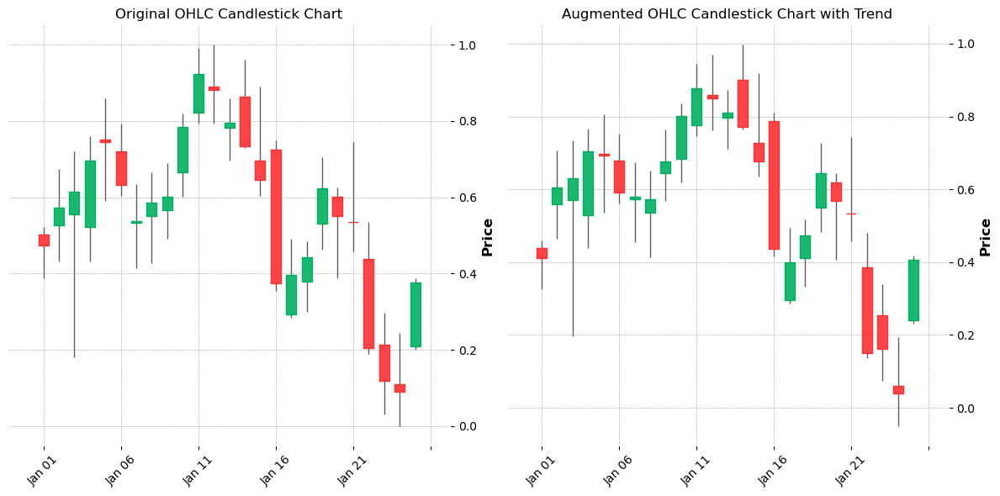


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 5.0973382602474986e-05 b: 0.005510644027263305


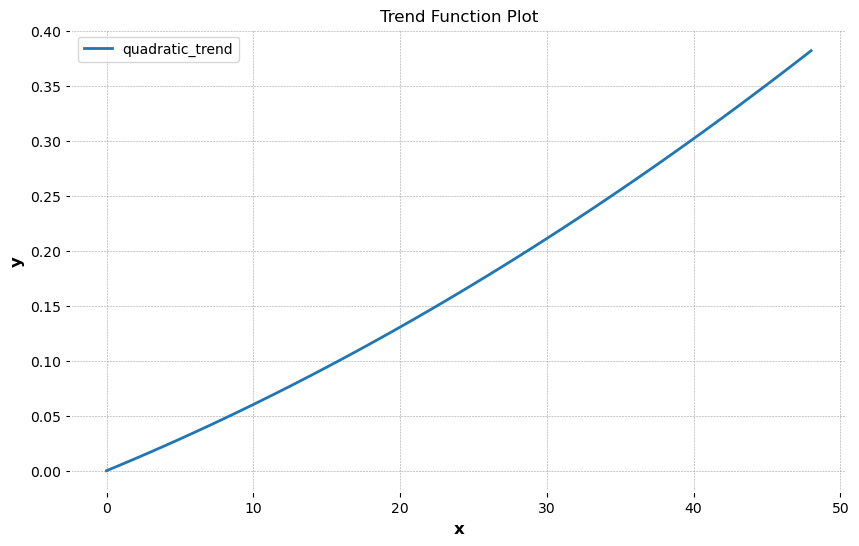

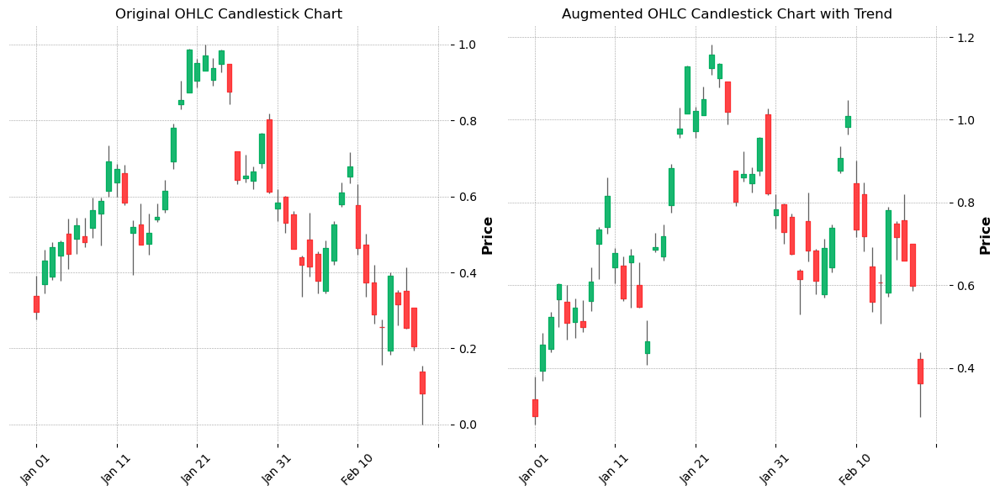


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.0023405647845921584


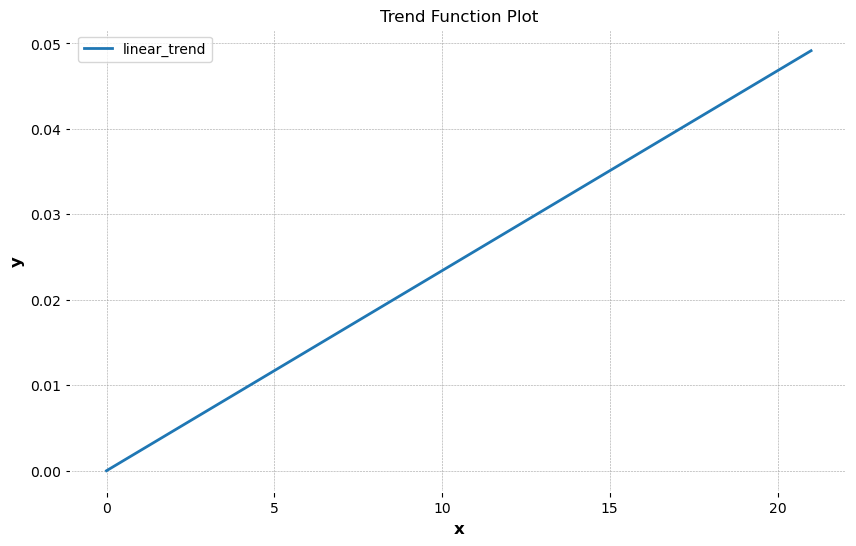

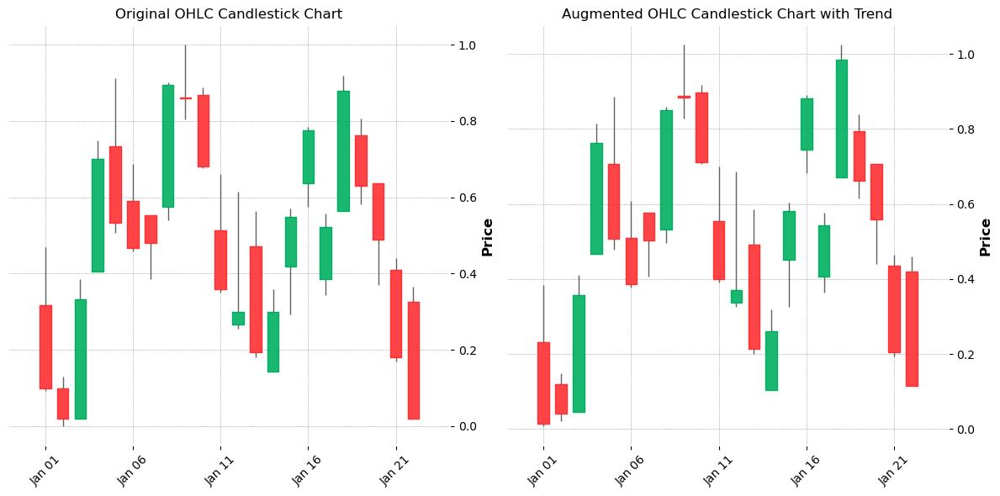


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.009365911568988448


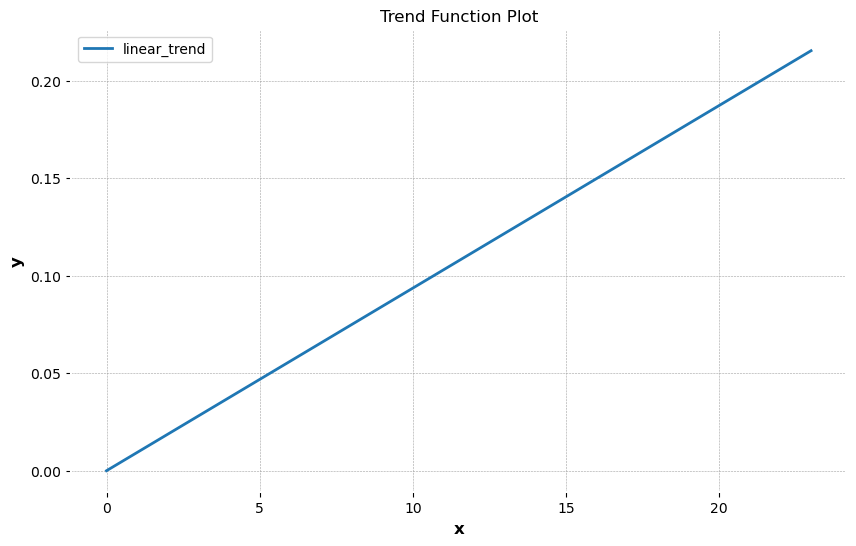

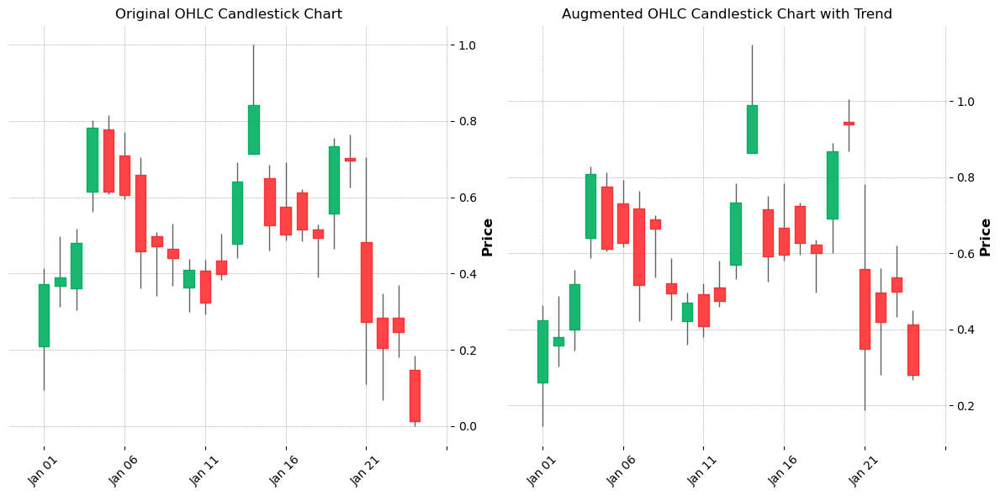


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.05260407650268463 frequency: 0.41274610837053427


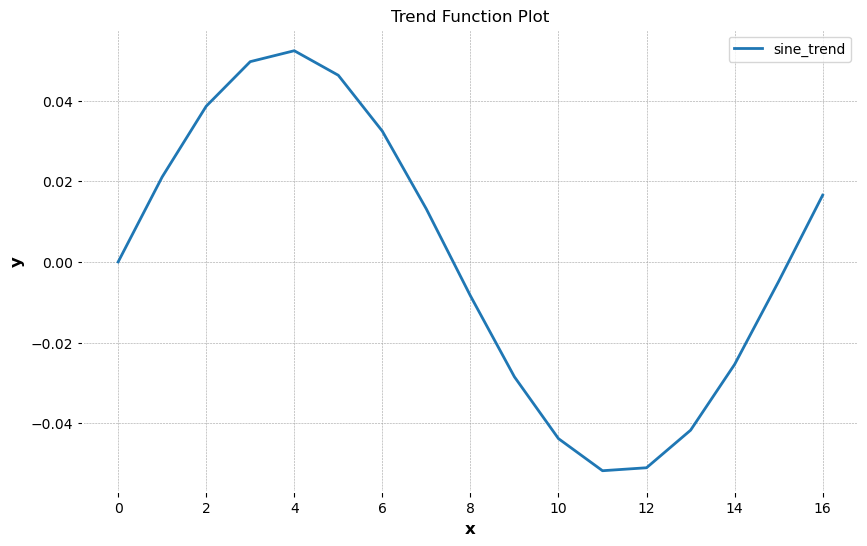

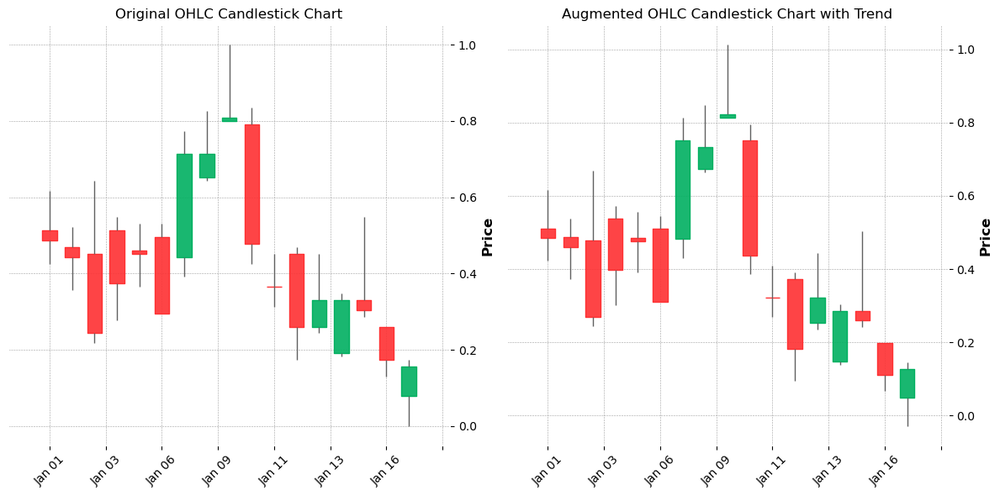


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.16874057837956866 frequency: 0.4073443242961802


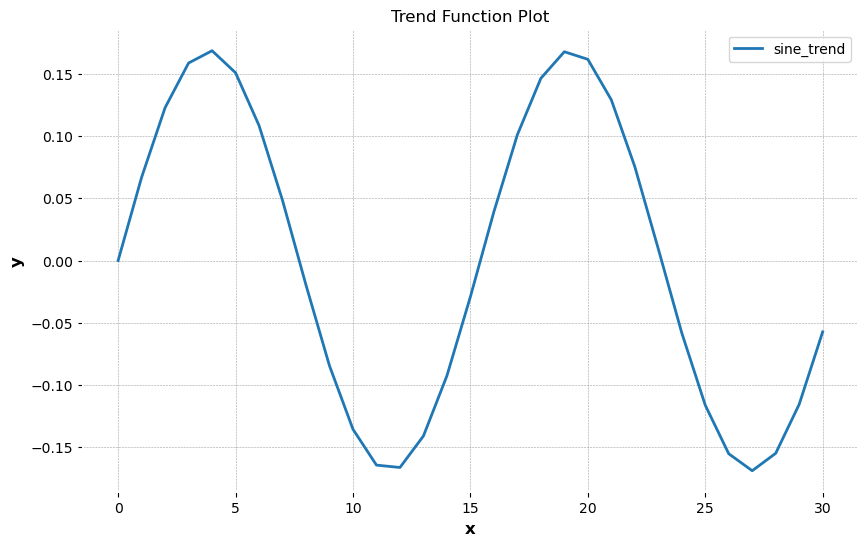

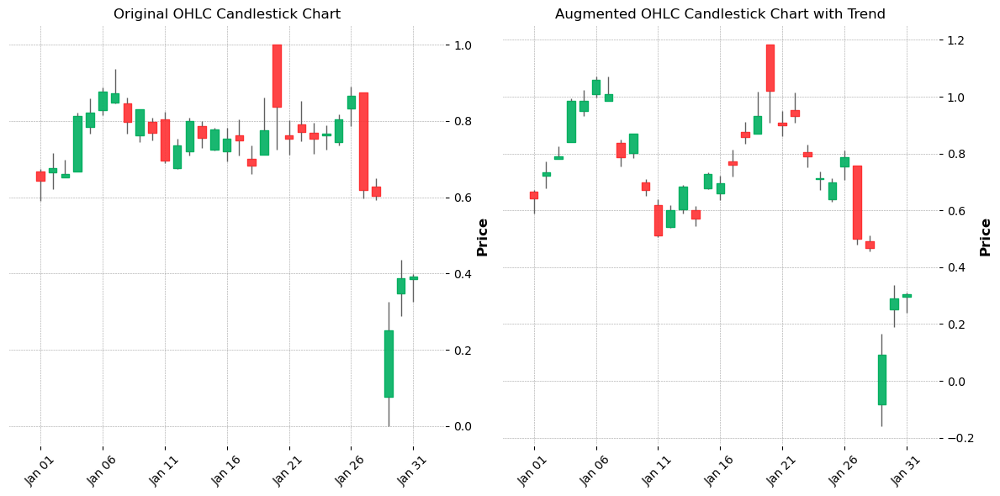


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.022275306804006845 frequency: 0.774910568874055


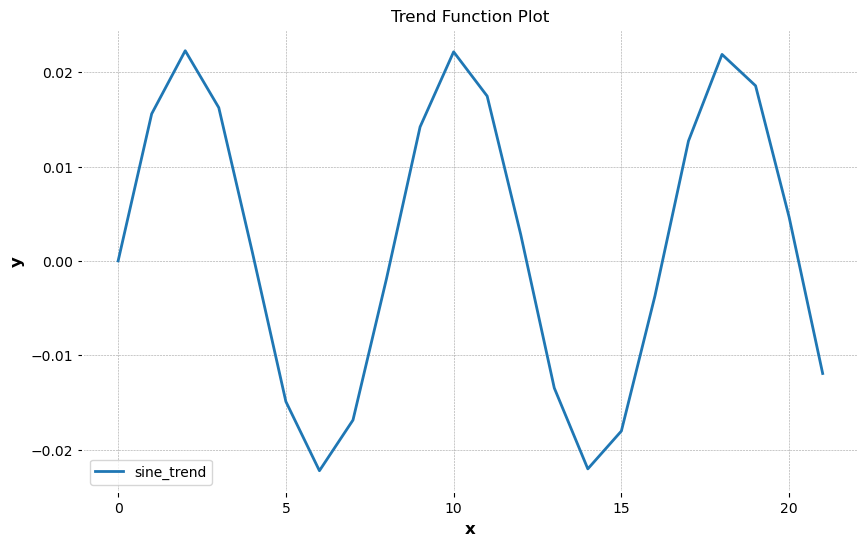

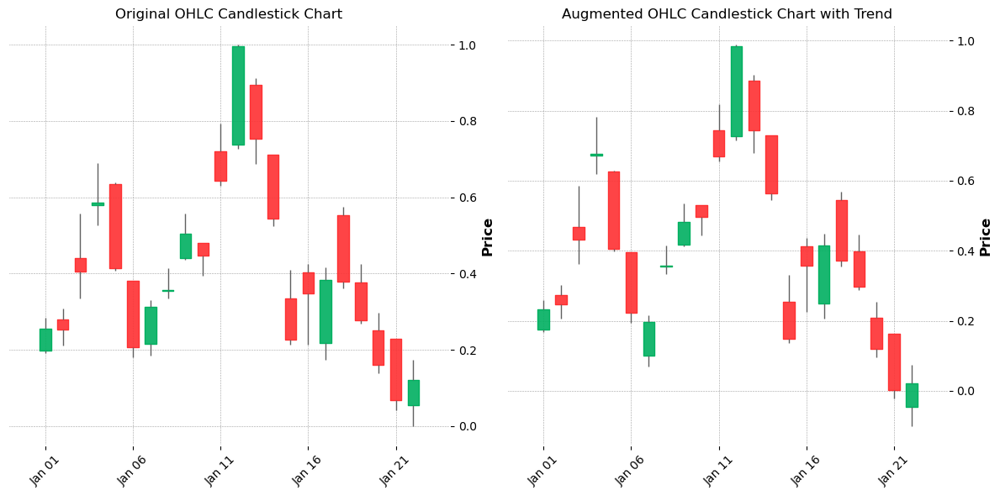


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 1.1057436935002112e-05 b: 0.0024892663665878356


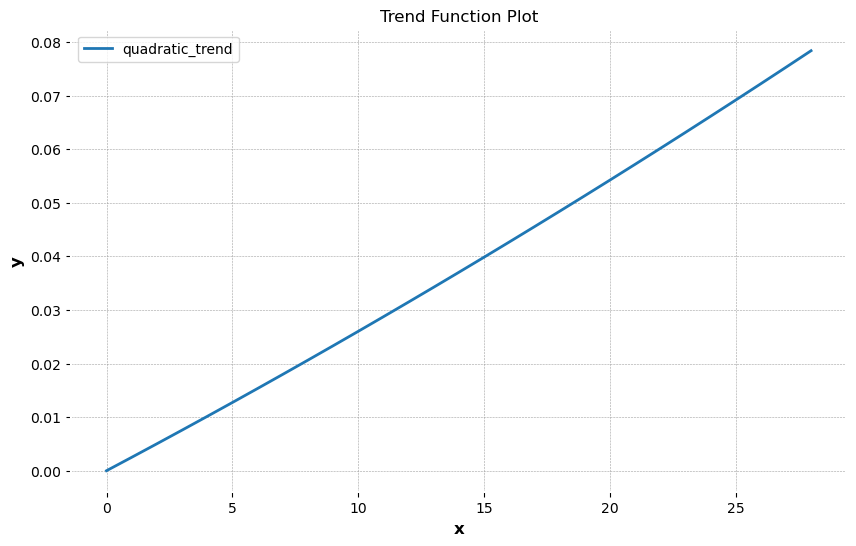

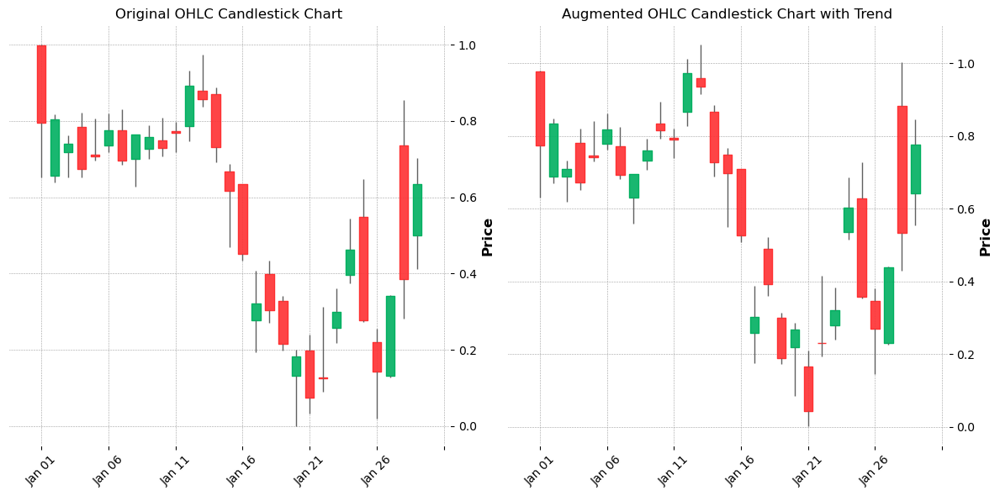


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 0.00012623568837703925 b: 0.006035407369622964


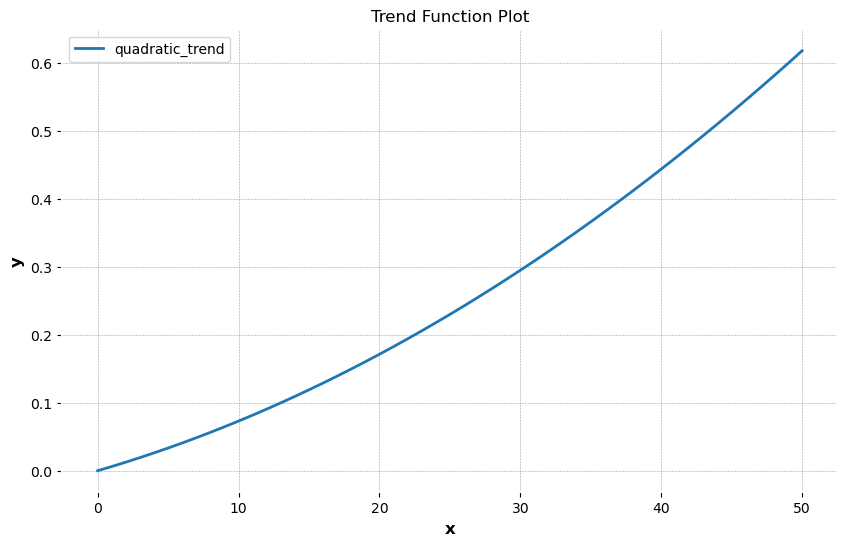

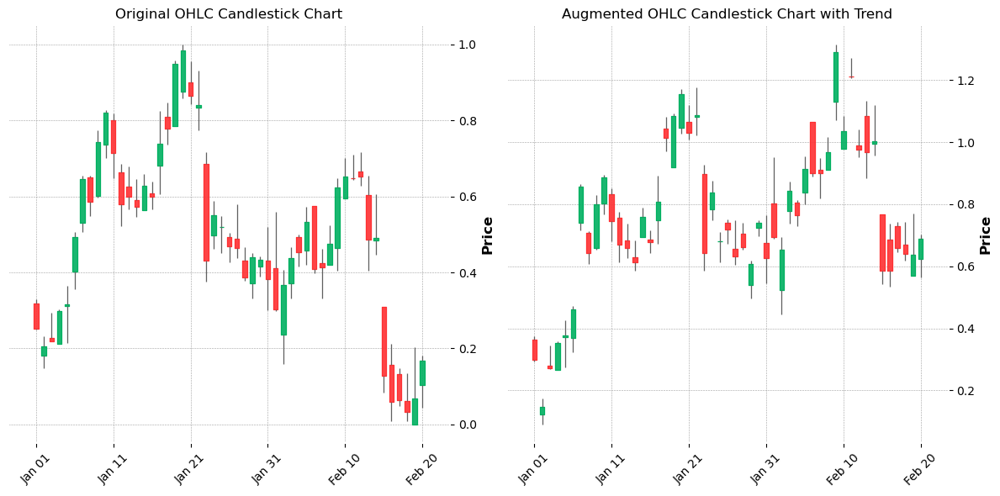


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 6.211479703731348e-05 b: 0.002256814265457573


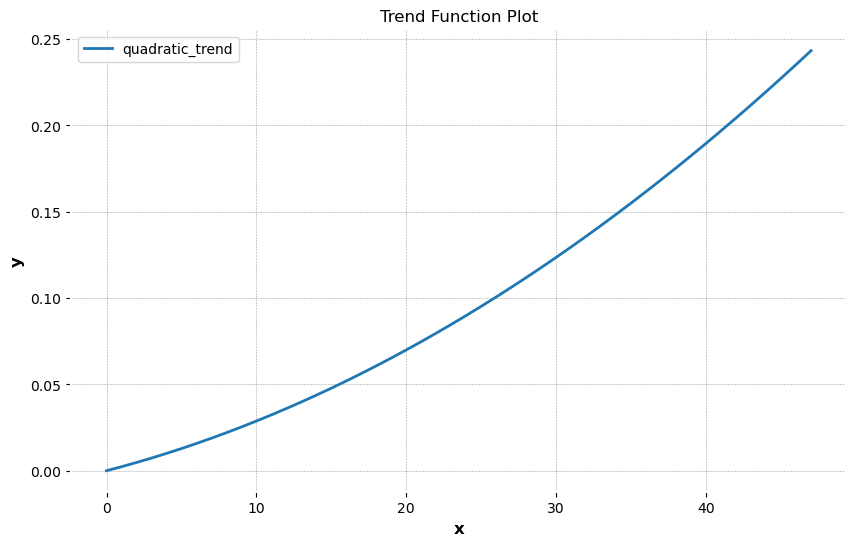

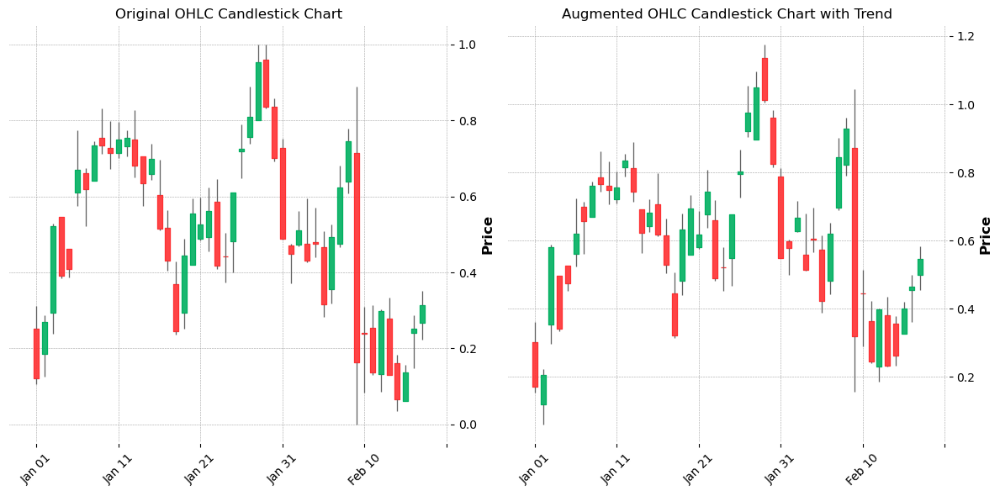


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.1318912131800393 frequency: 0.6720318227962667


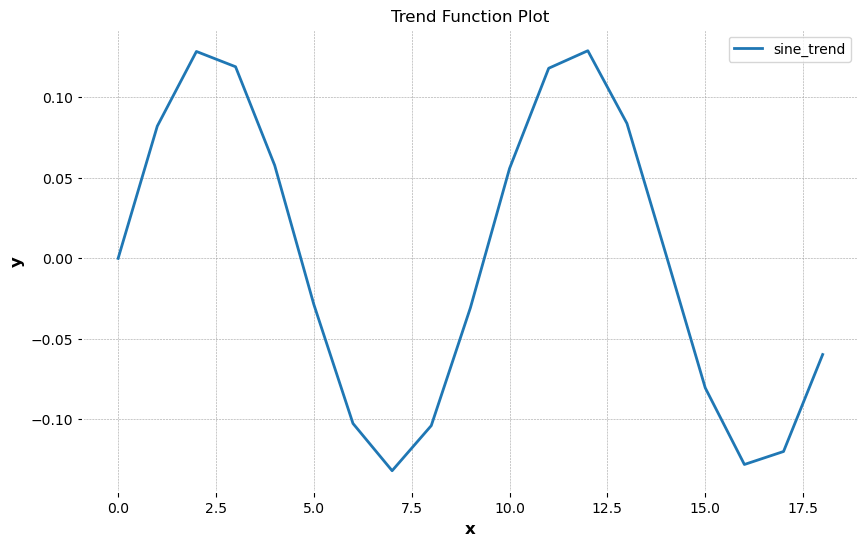

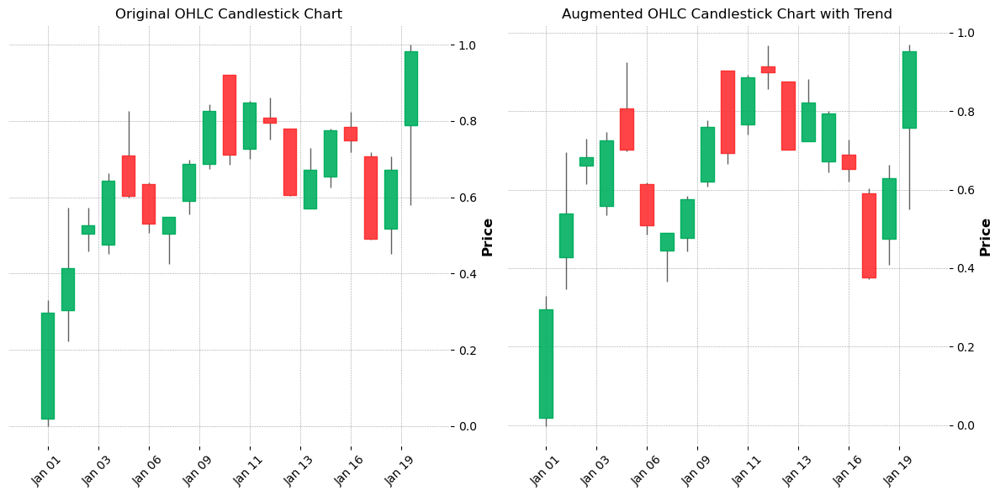


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.0020503121146684083


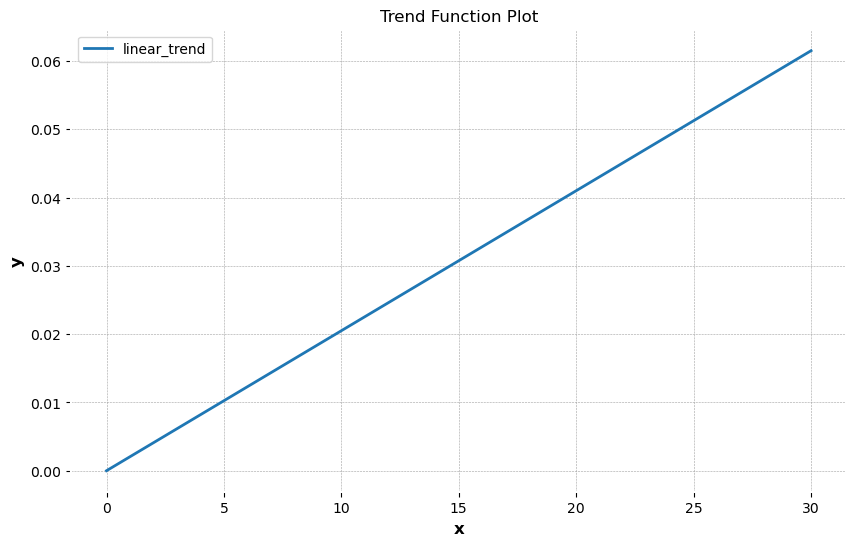

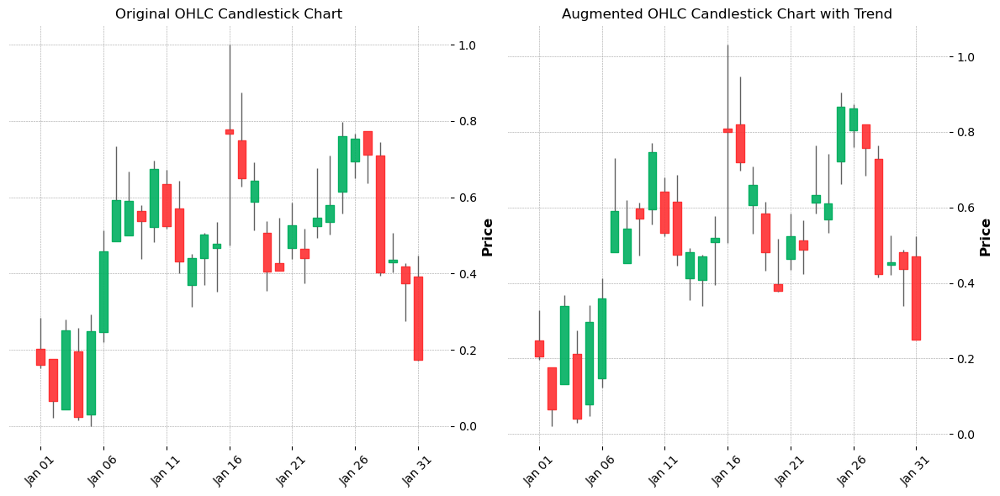


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.136140872476839 frequency: 0.21042720685785463


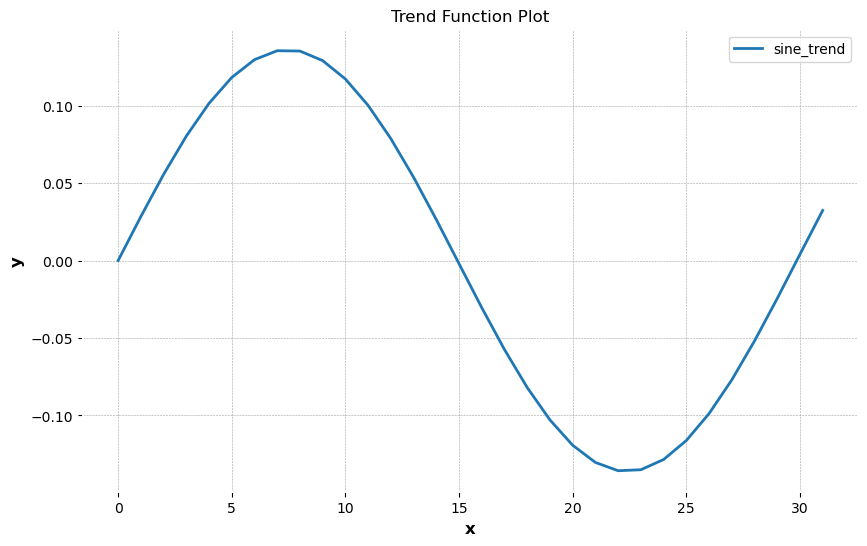

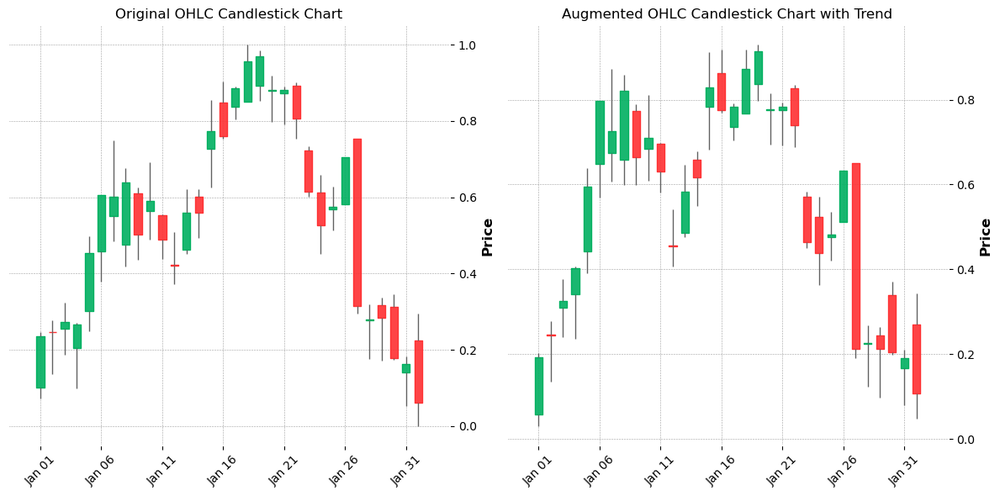


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.24739425220892436 frequency: 0.995635756805024


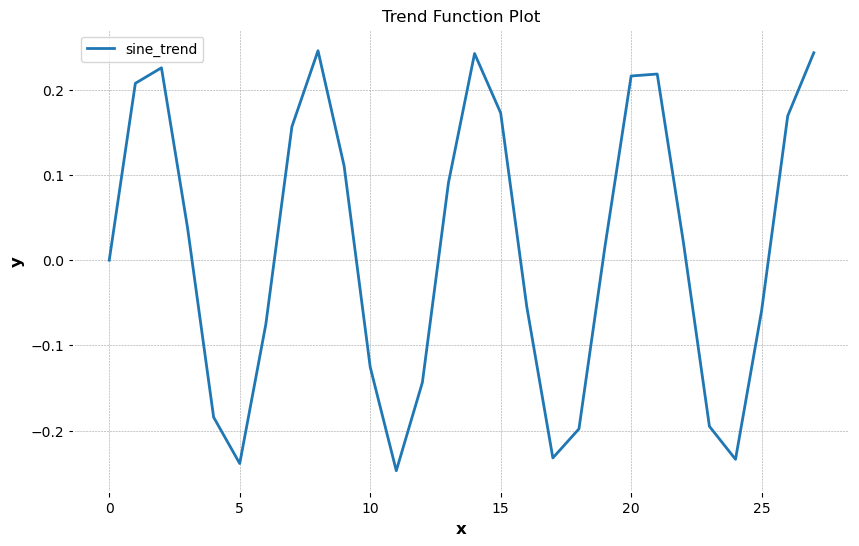

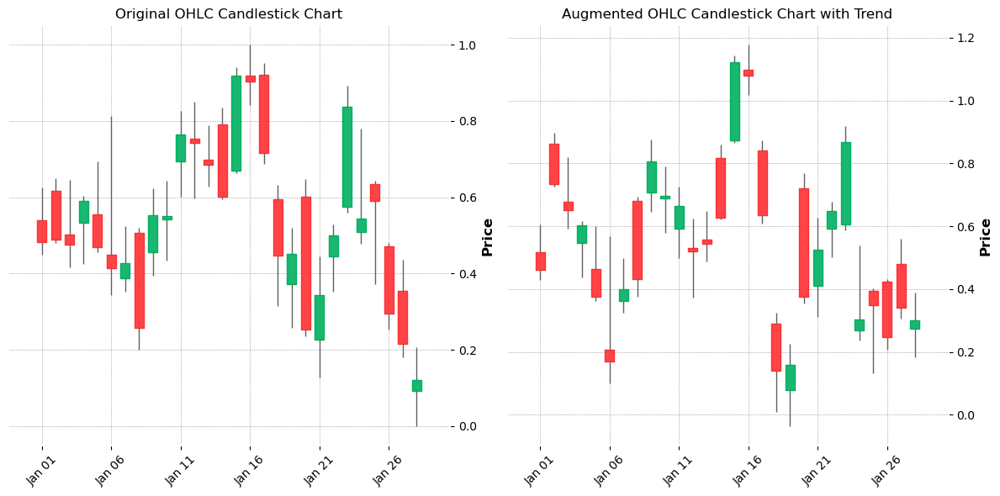


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.20145681251890818 frequency: 0.5278128532831808


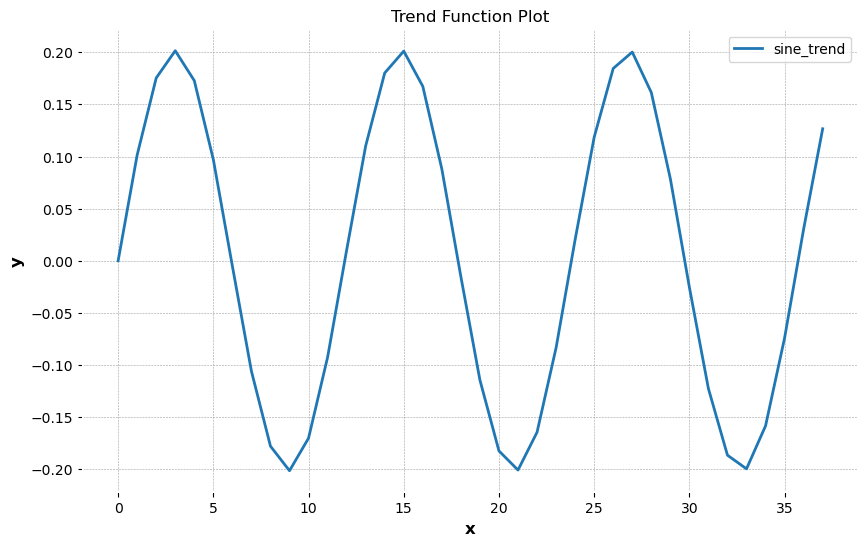

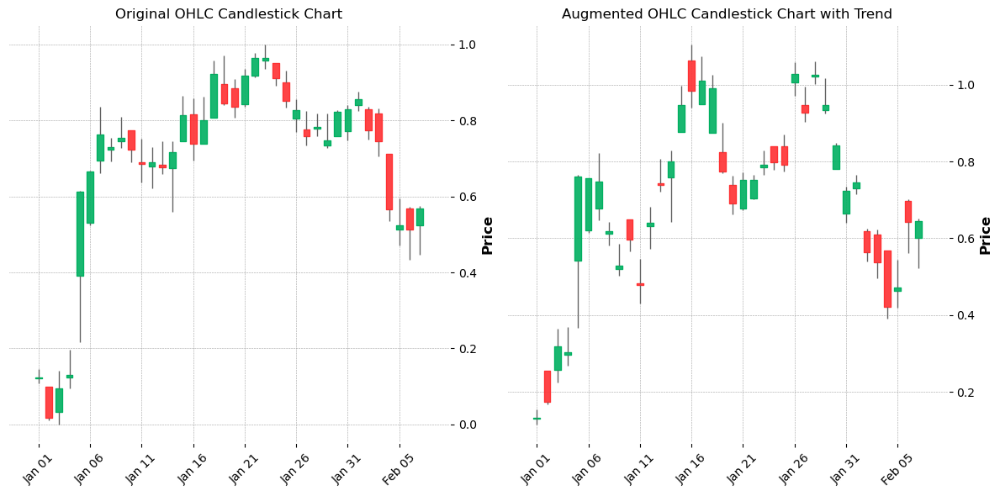


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.2828176254535292 frequency: 0.24266821406826353


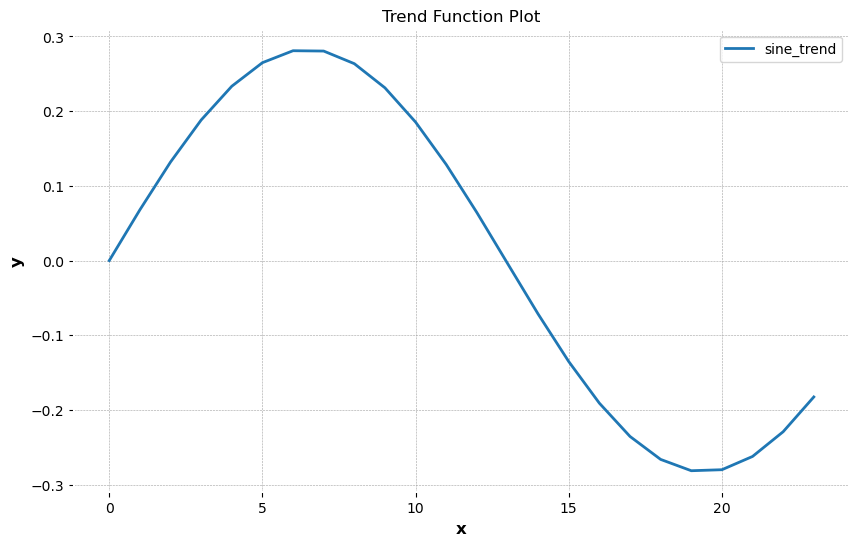

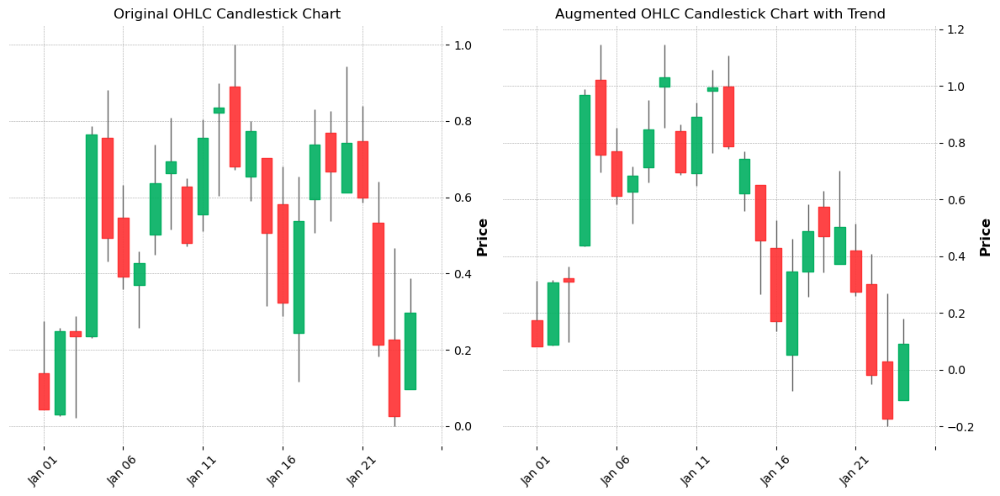


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.10770202756651513 frequency: 0.6201495800564045


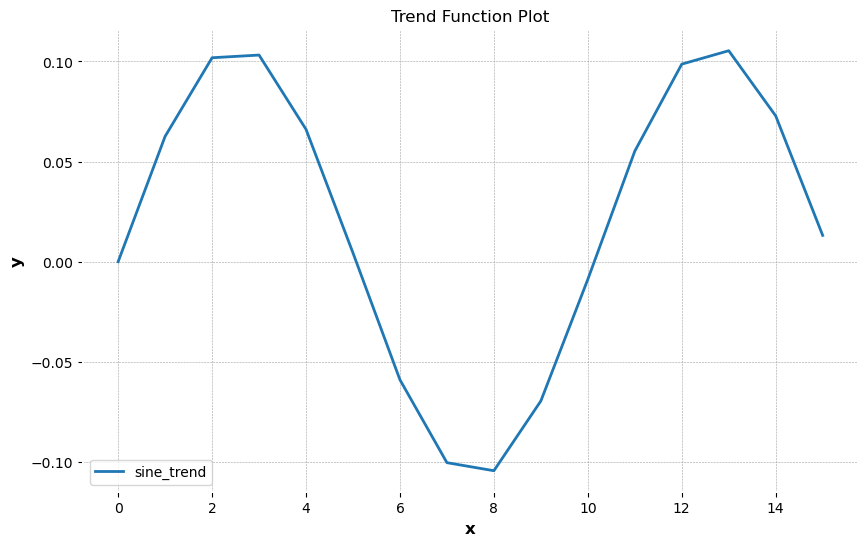

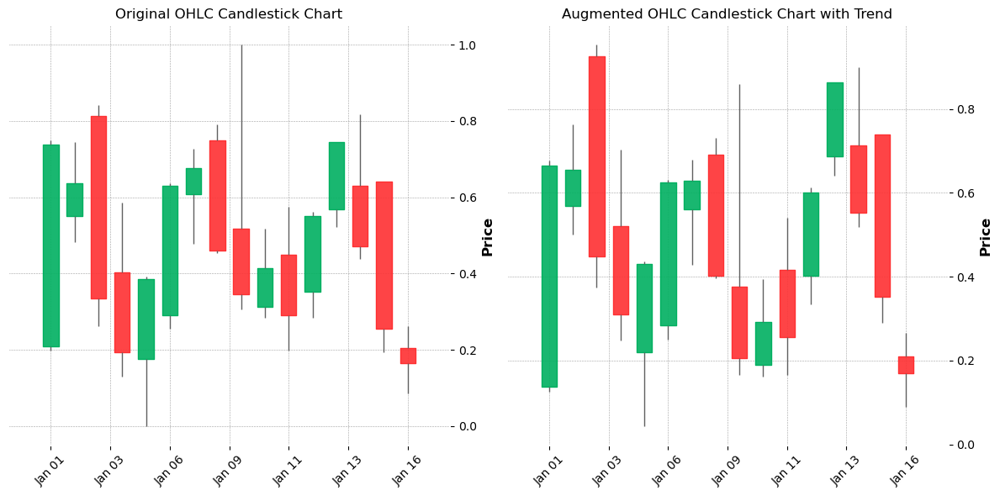


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.010747079260332198


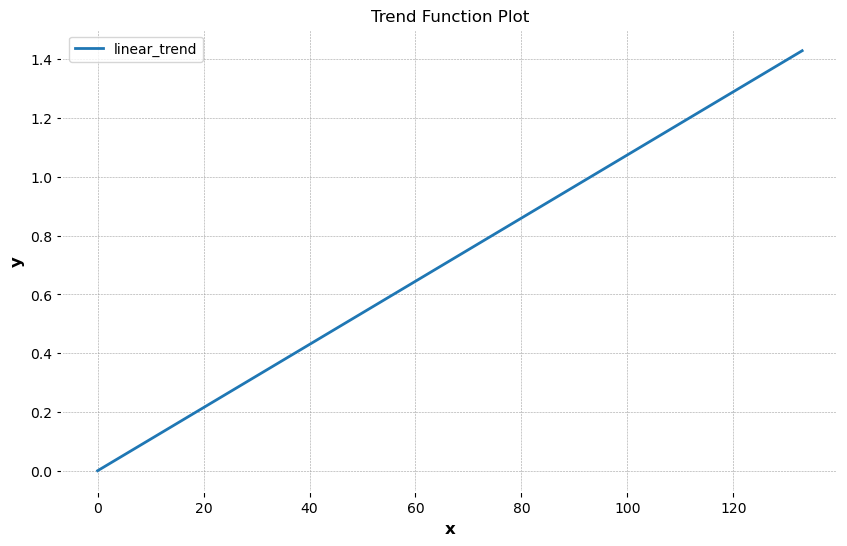

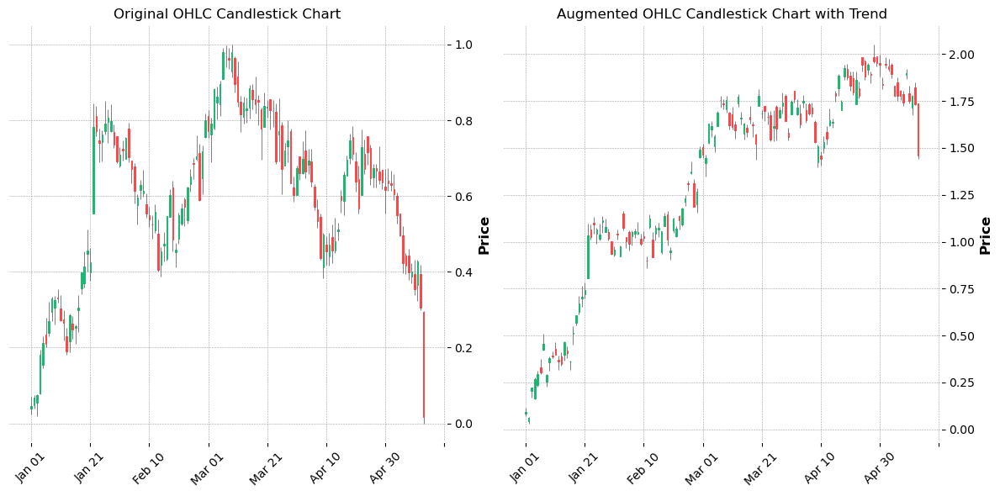


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 1.4561159896287196e-05 b: 0.006324655389526803


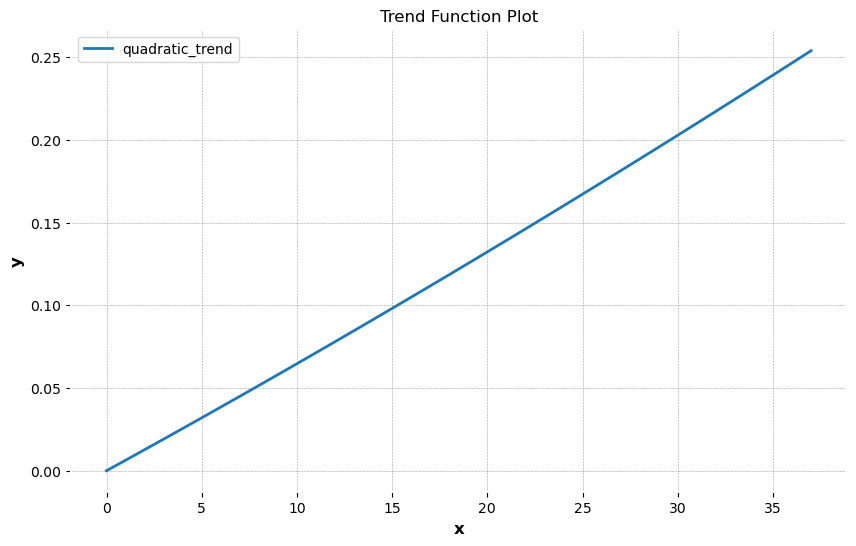

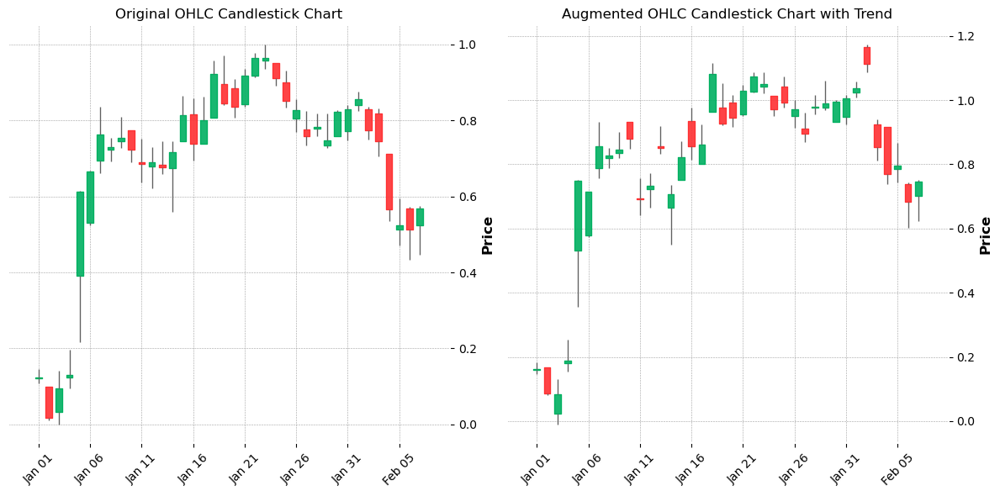


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 0.00010400634900885902 b: 0.002908730907772518


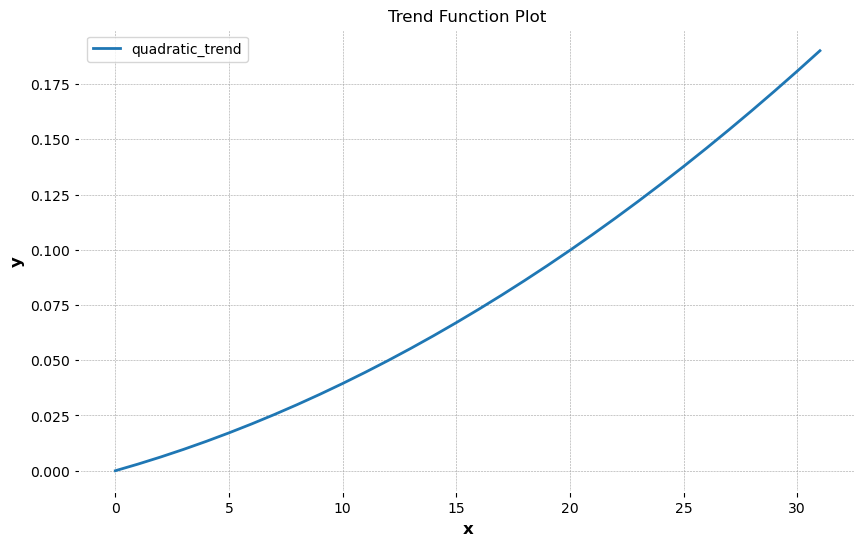

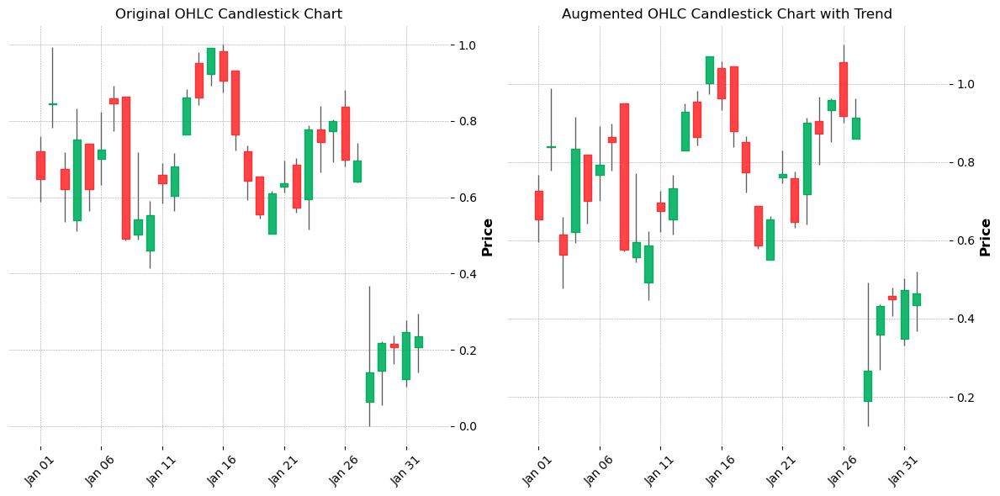


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 5.490425456384e-05 b: 0.0017864701449959955


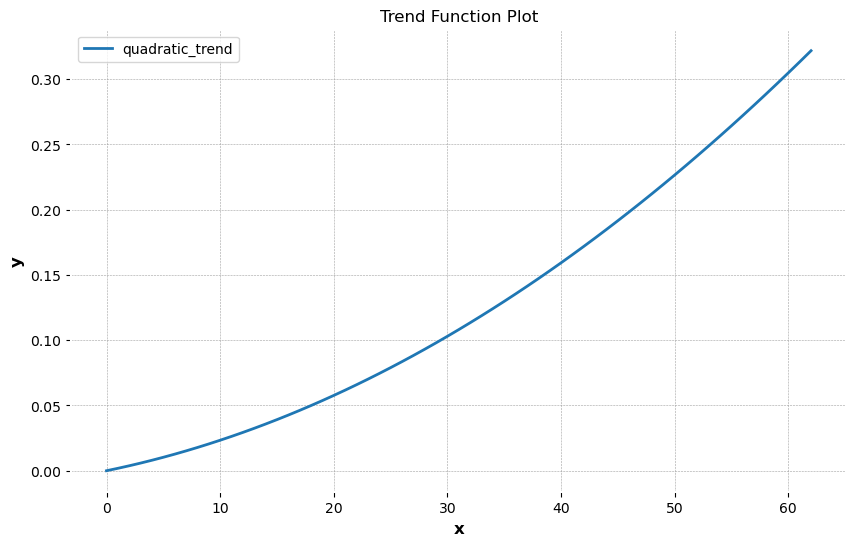

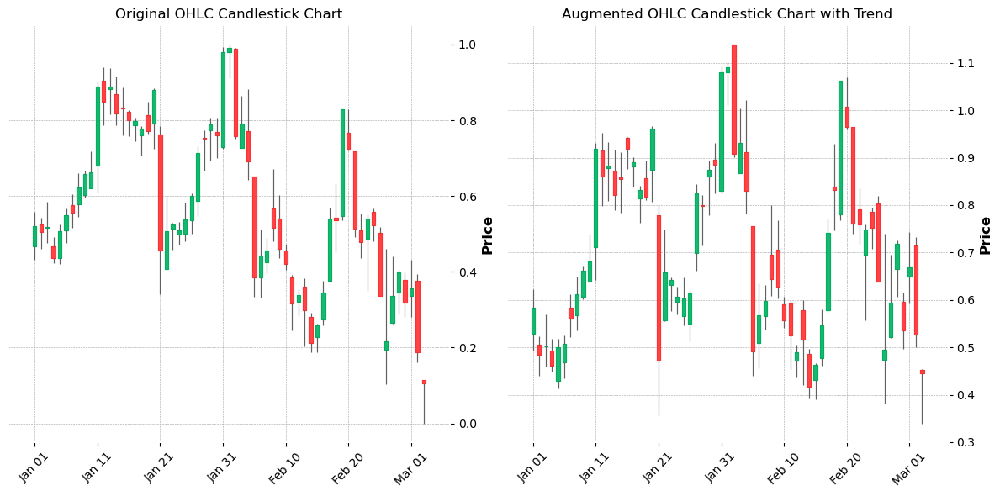


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.14778233044403652 frequency: 0.43500660789836176


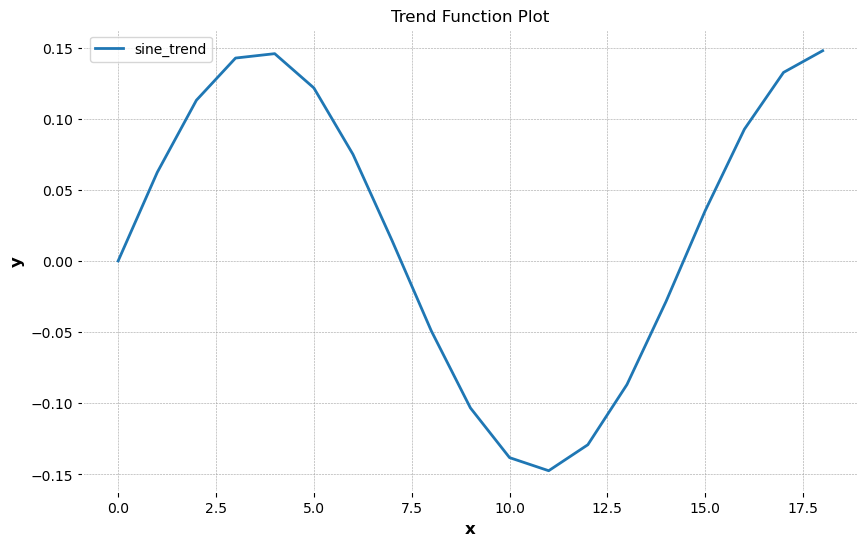

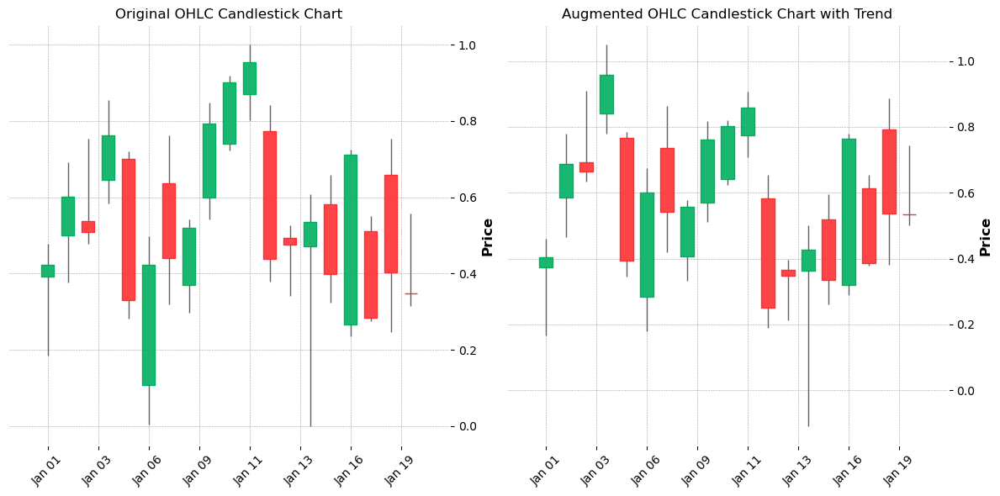


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.11017913560353013 frequency: 0.9380720400063624


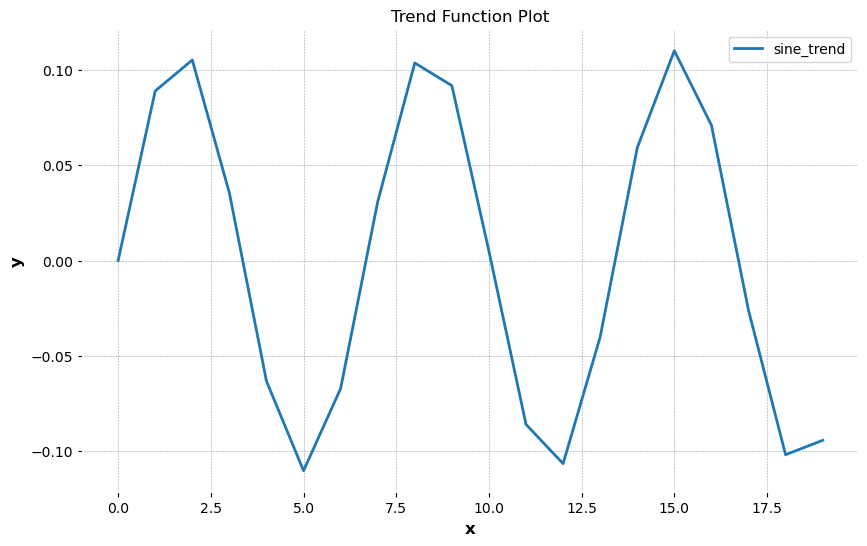

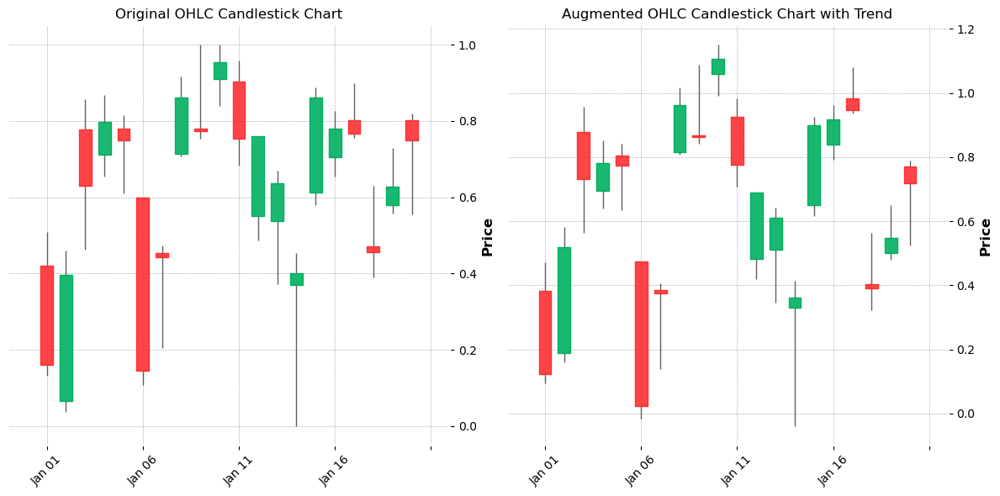


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.0014438614975108412


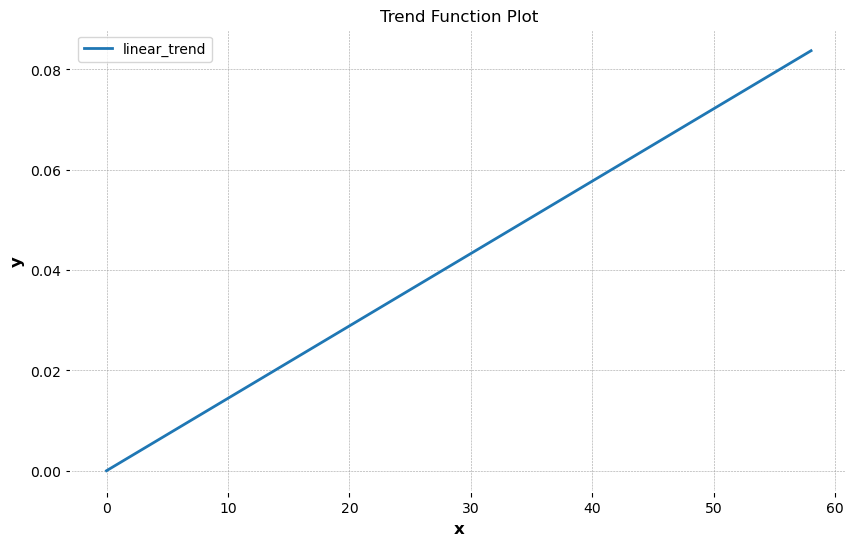

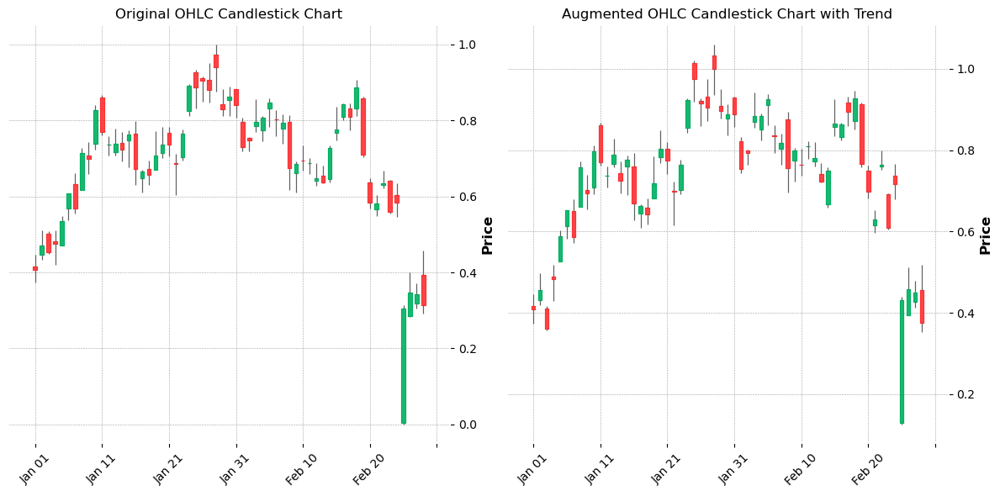


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 9.45877171230698e-05 b: 0.0045884686638379005


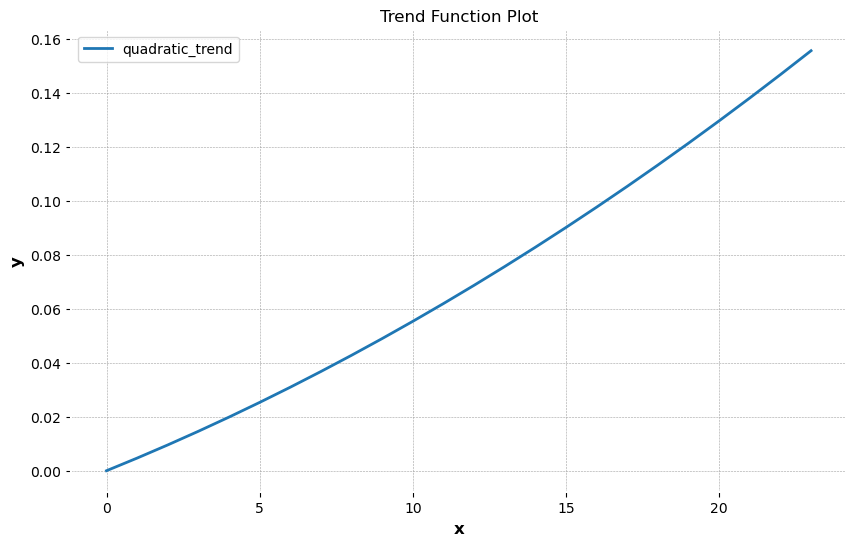

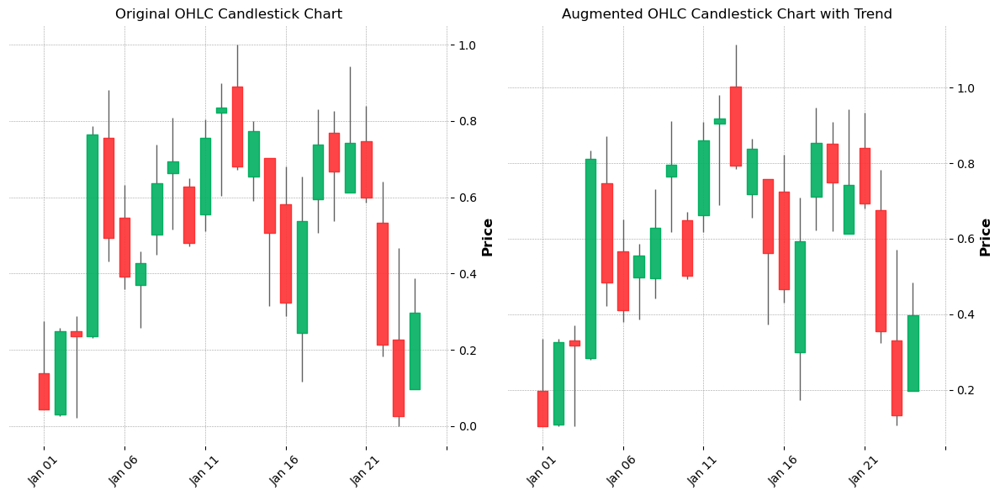


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.23594639496640699 frequency: 0.9463509853226583


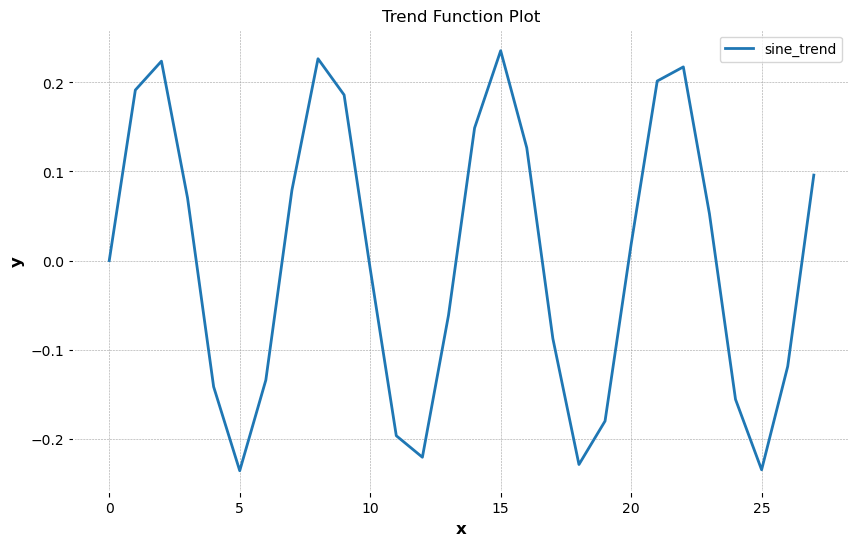

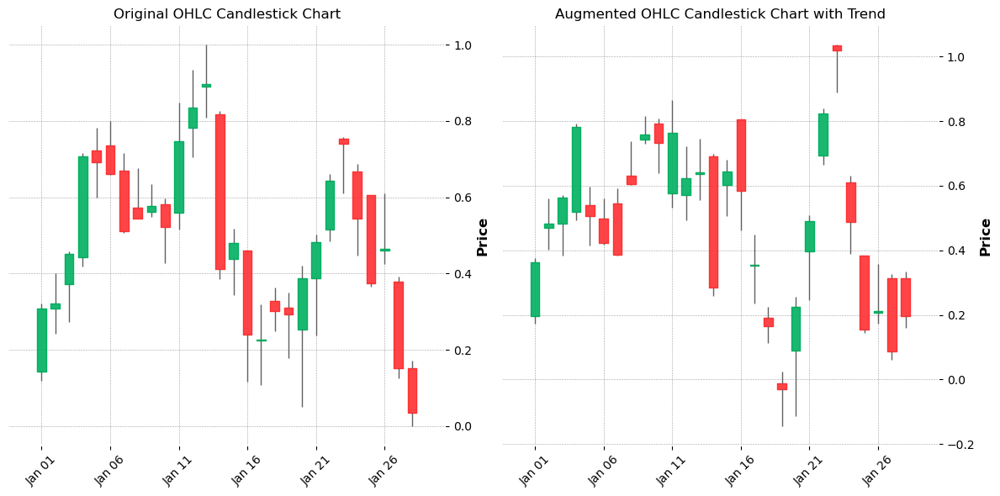


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.004028762311568801


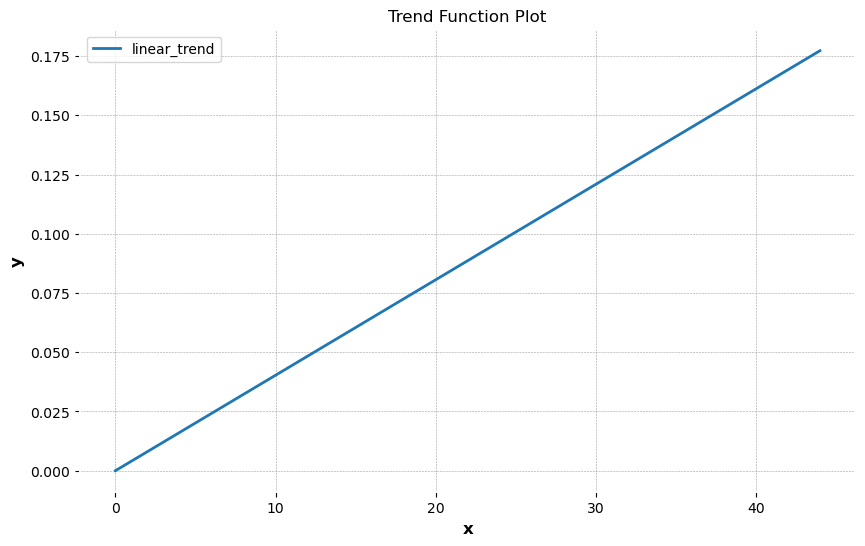

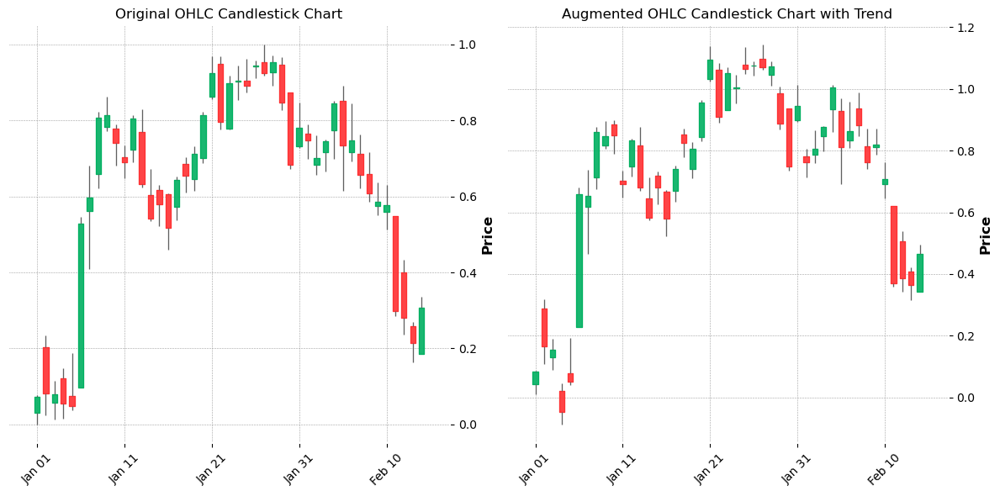


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.007288149892300058


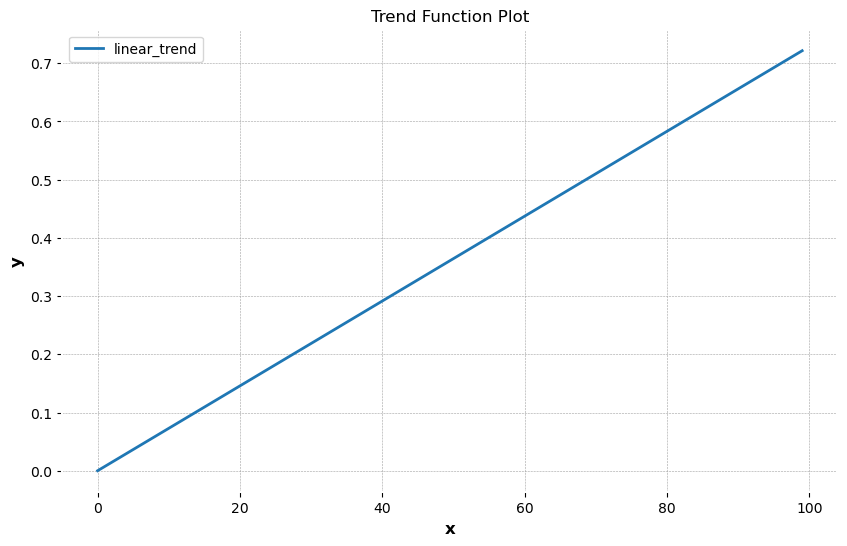

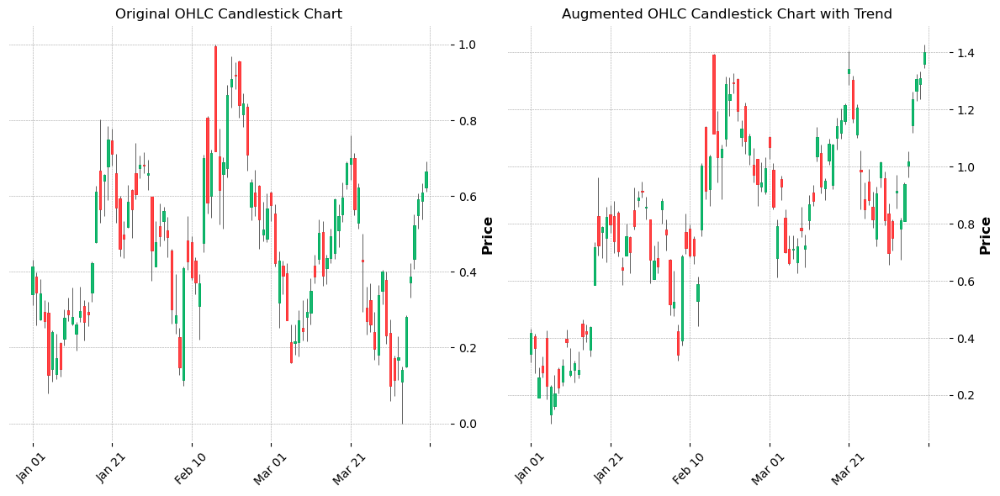


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.012088994716419246


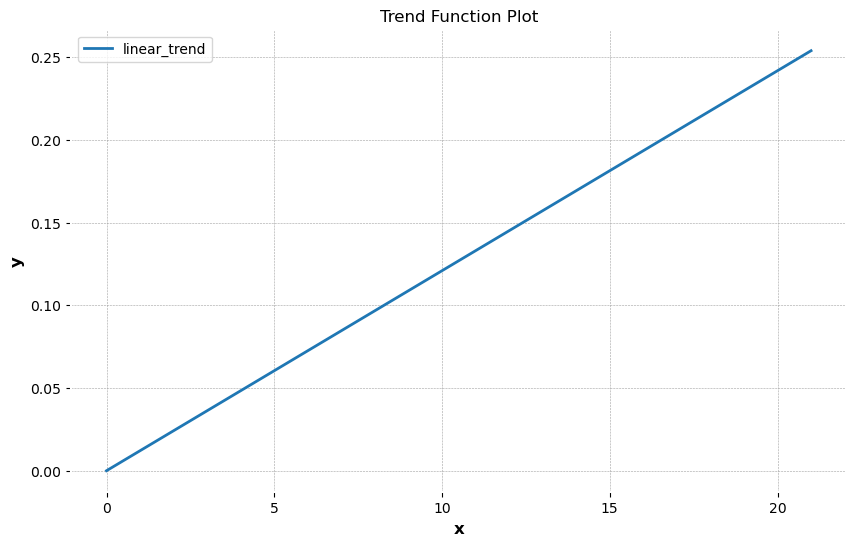

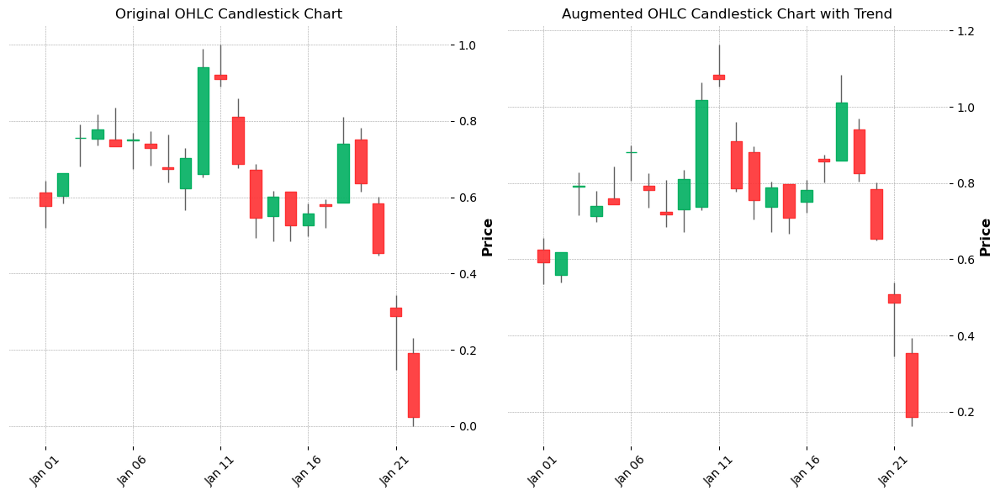


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 2.1752005276372087e-05 b: 0.0011860956305911122


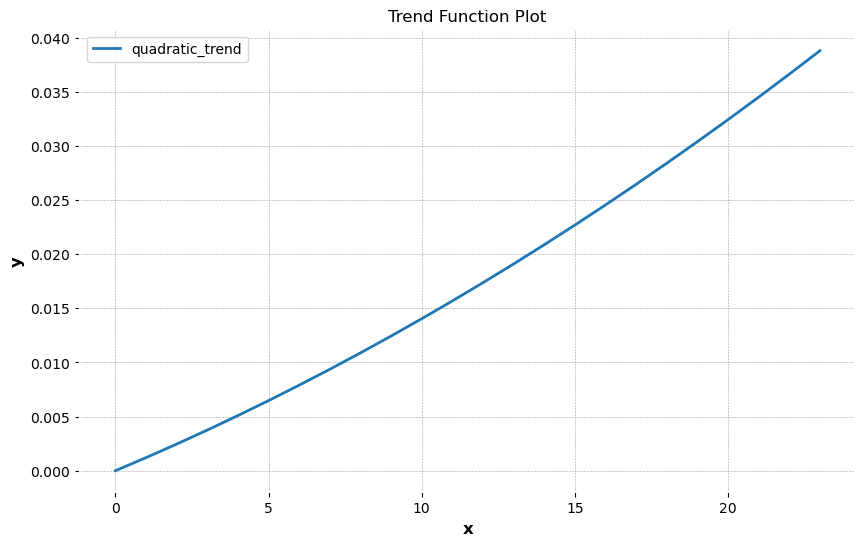

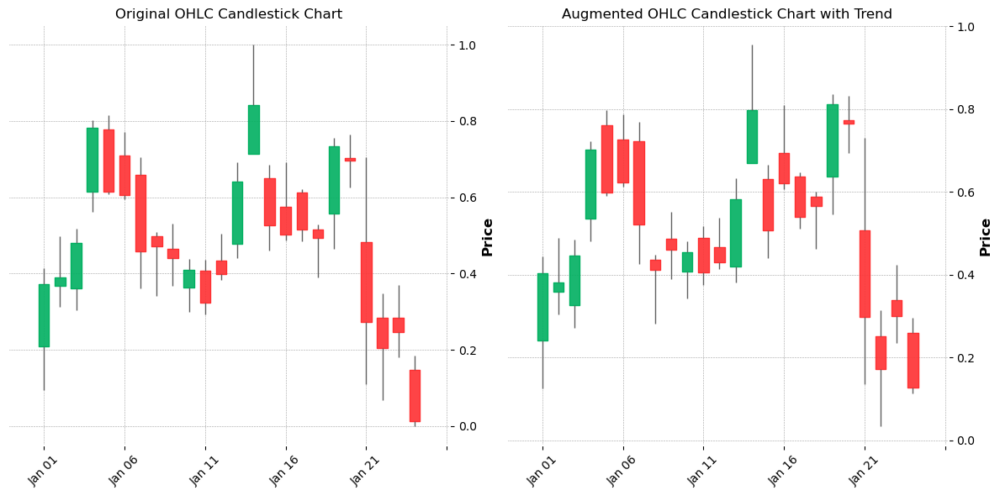


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.011667851201032193


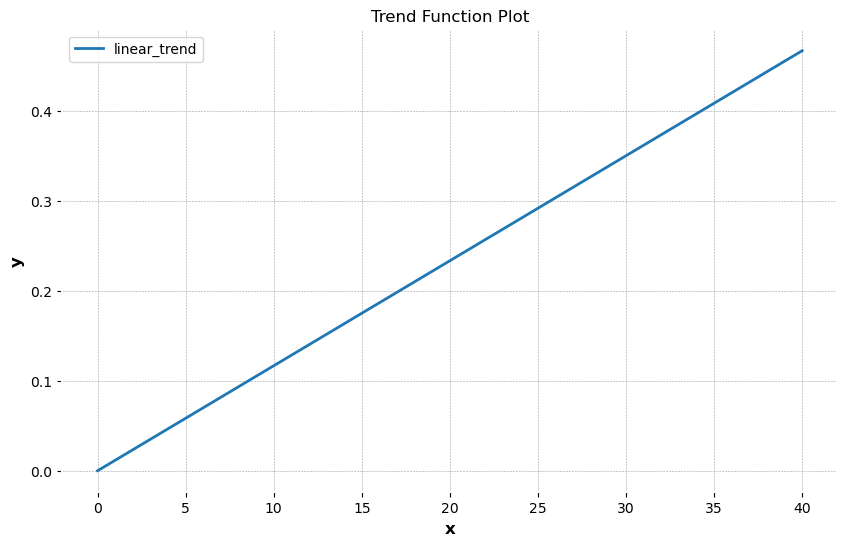

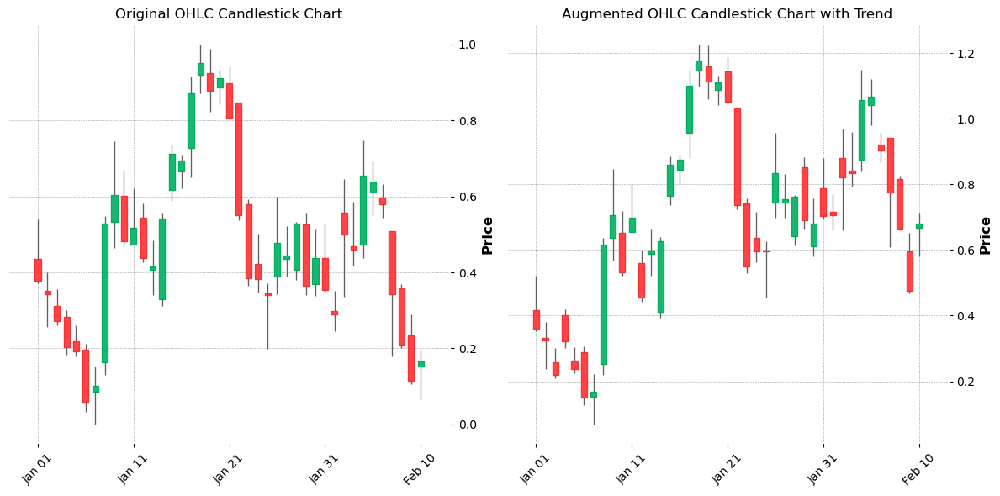


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 0.00012493594299346425 b: 0.002410484020173497


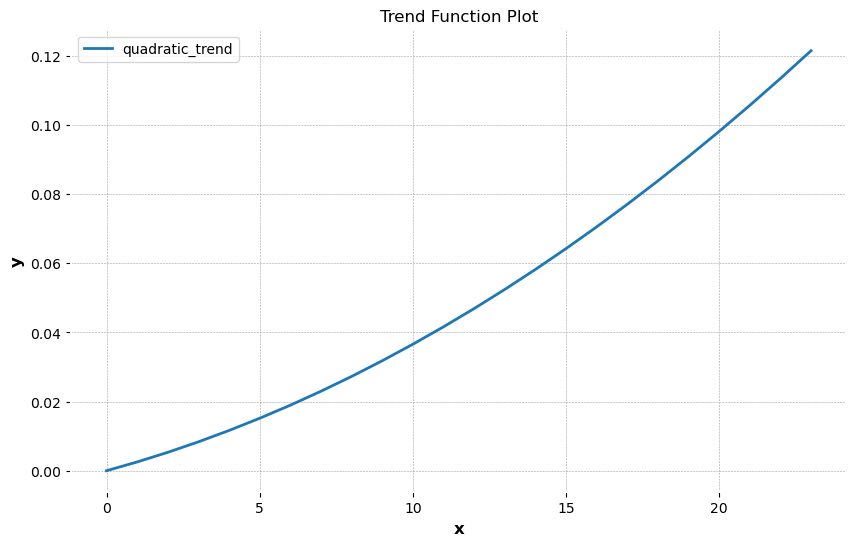

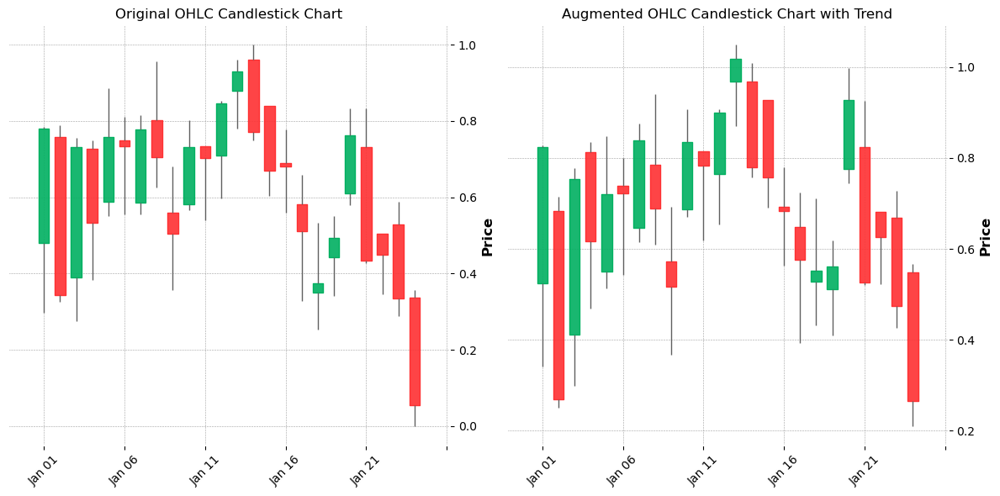


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 1.7426090670041966e-05 b: 0.0016051485236489452


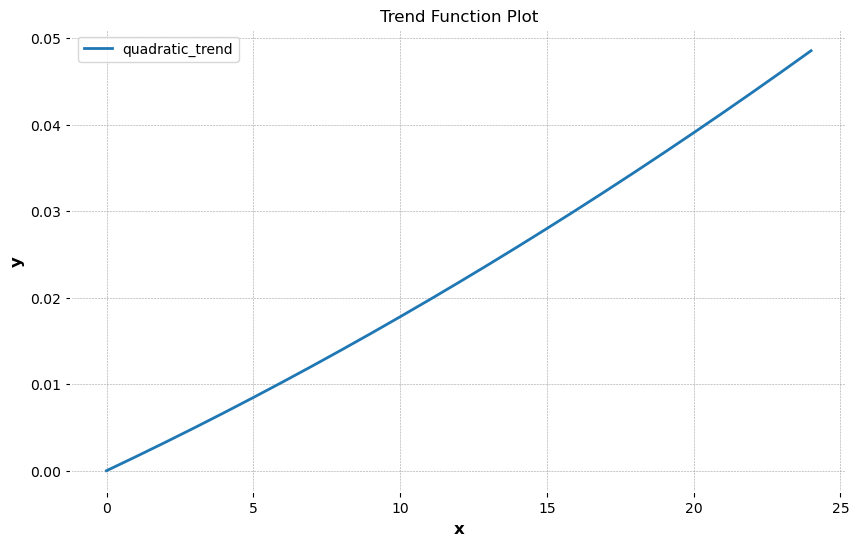

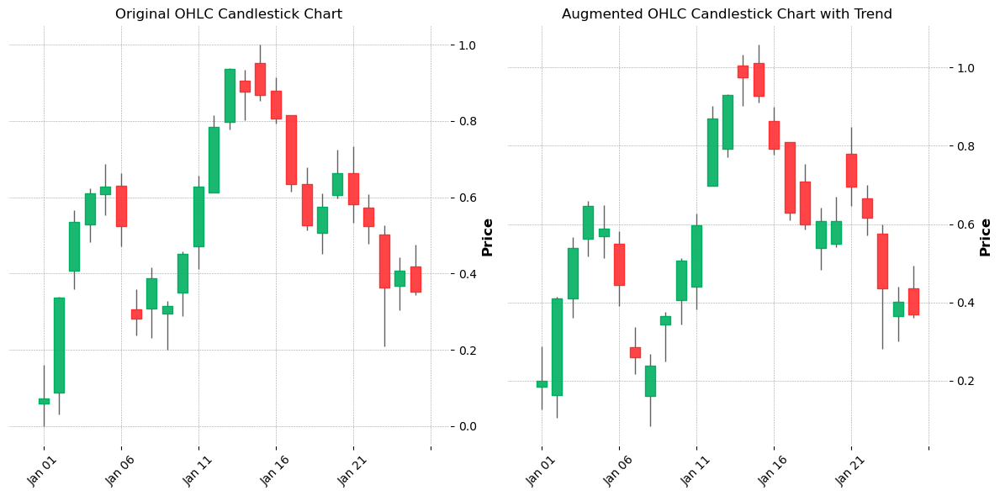


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 1.0198114467763298e-05 b: 0.0023195500140731637


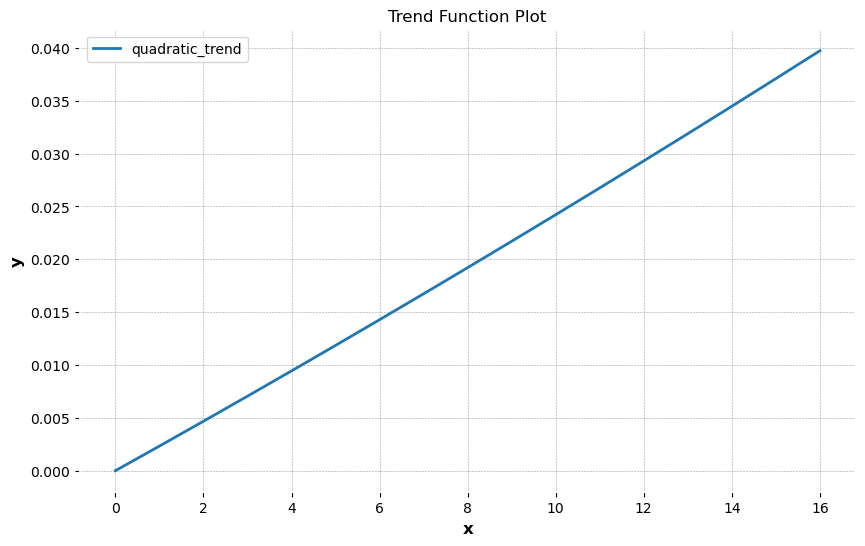

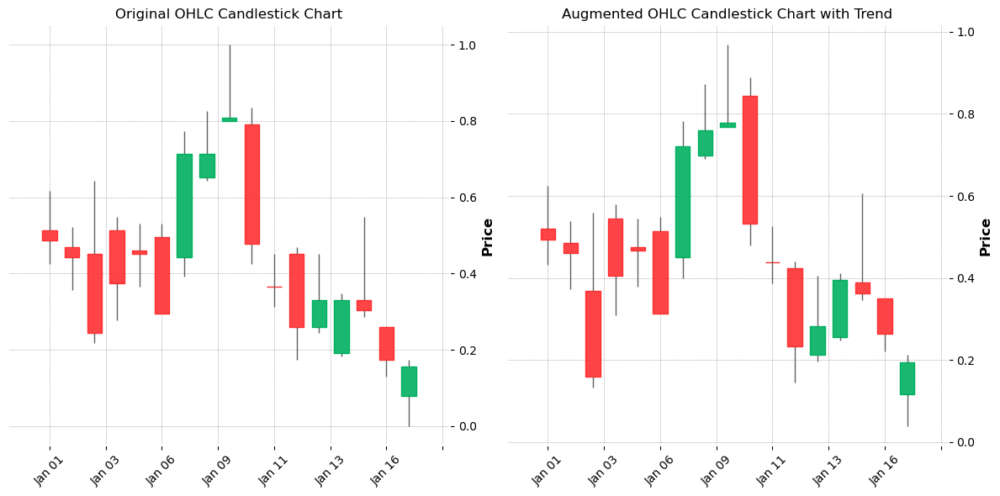


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.06025818374613087 frequency: 0.10531707758750097


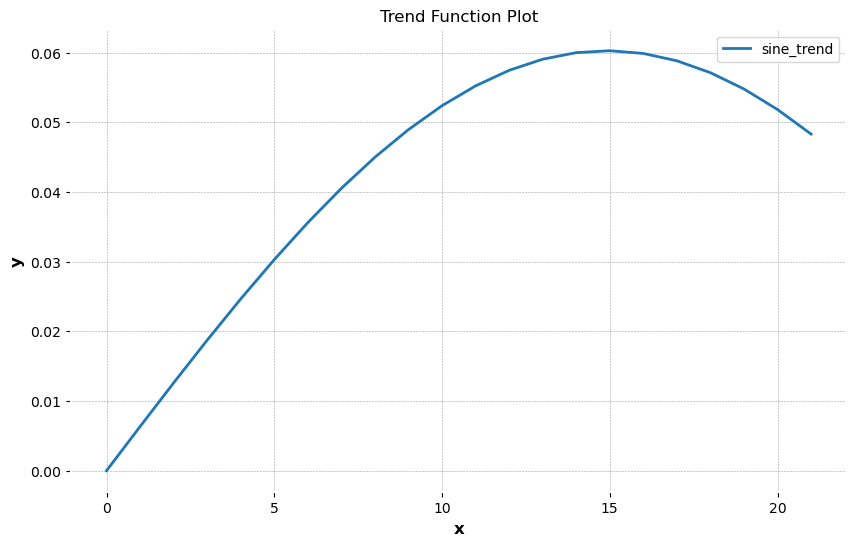

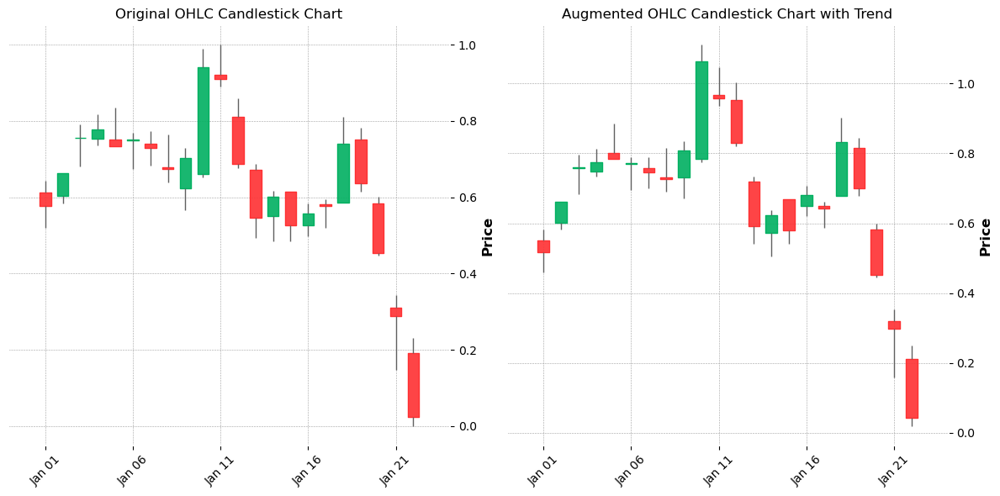


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 3.685709385885565e-05 b: 0.0017815732137727172


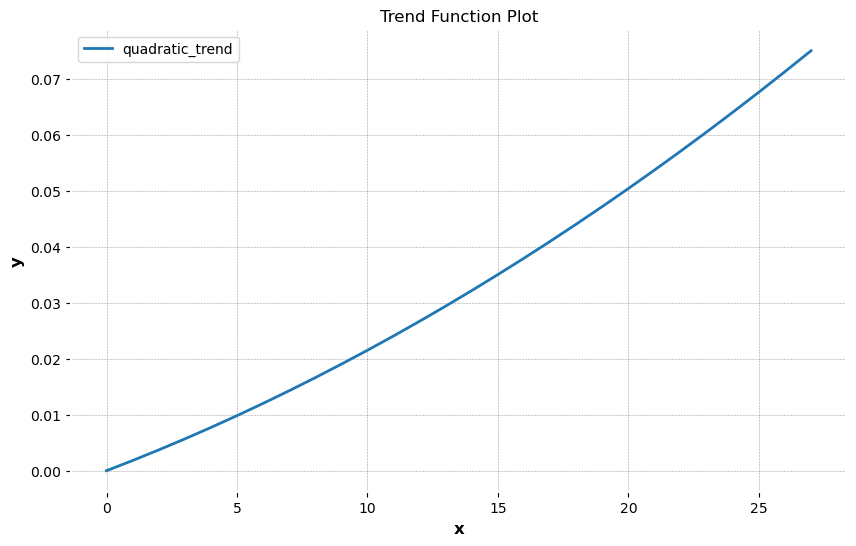

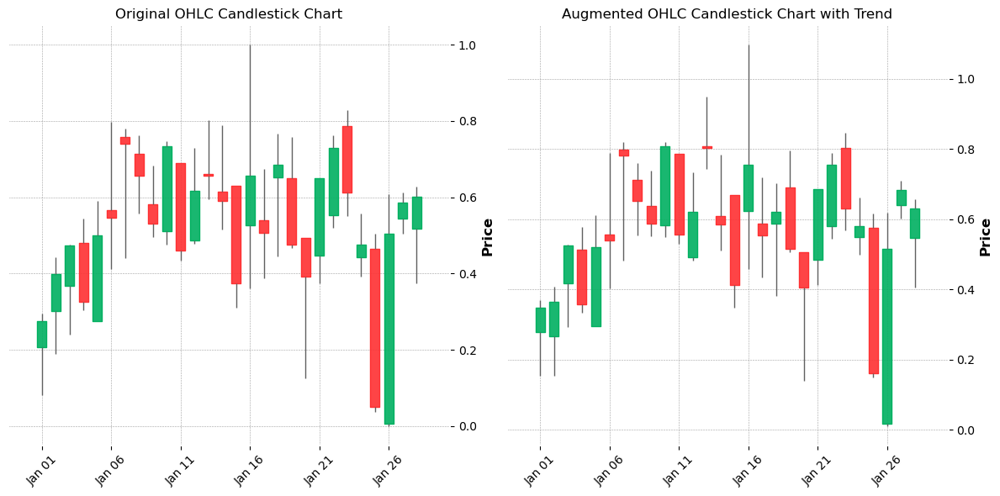


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.059589759788381005 frequency: 0.06819648018821318


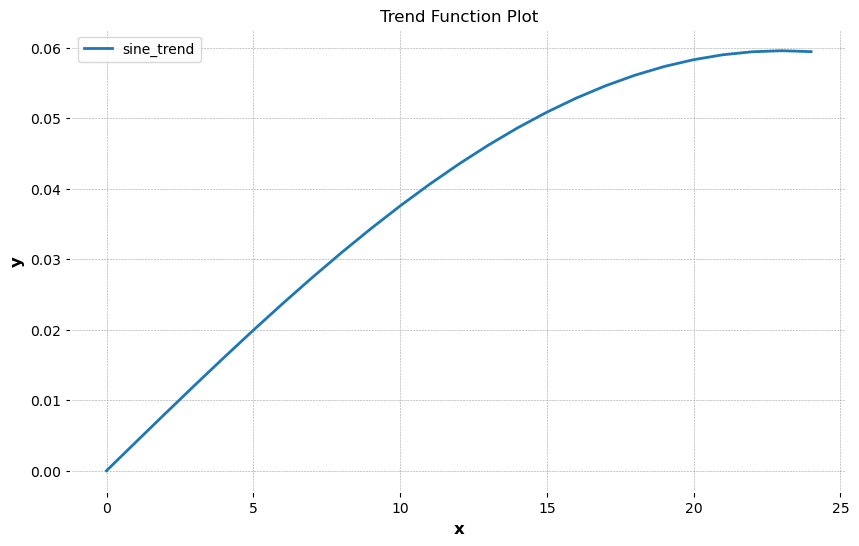

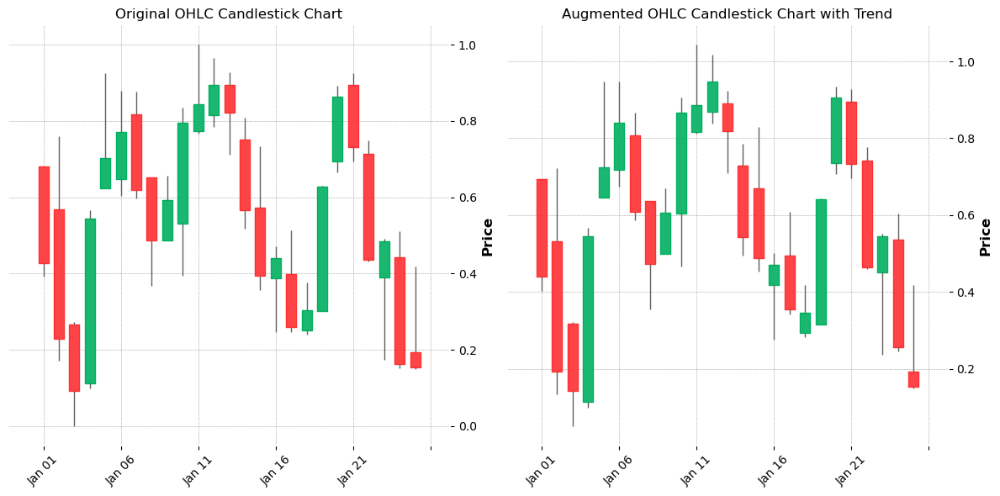


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.0017105747614290531


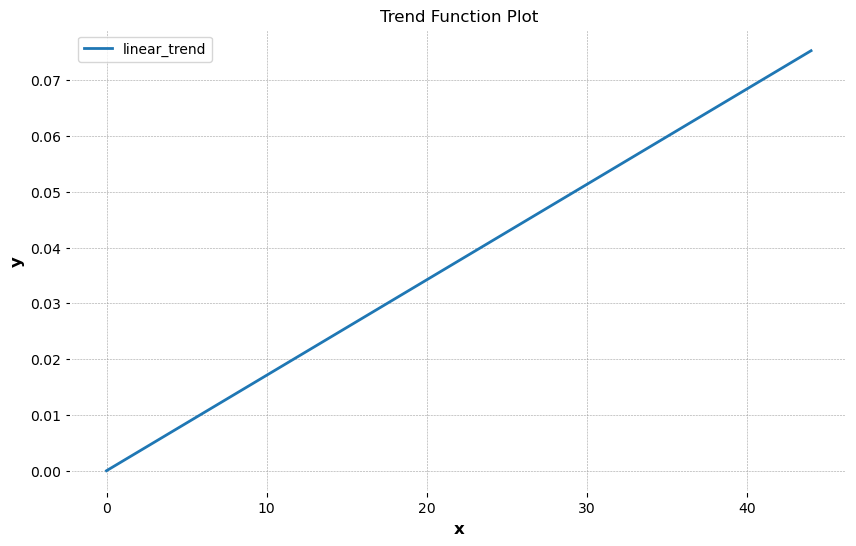

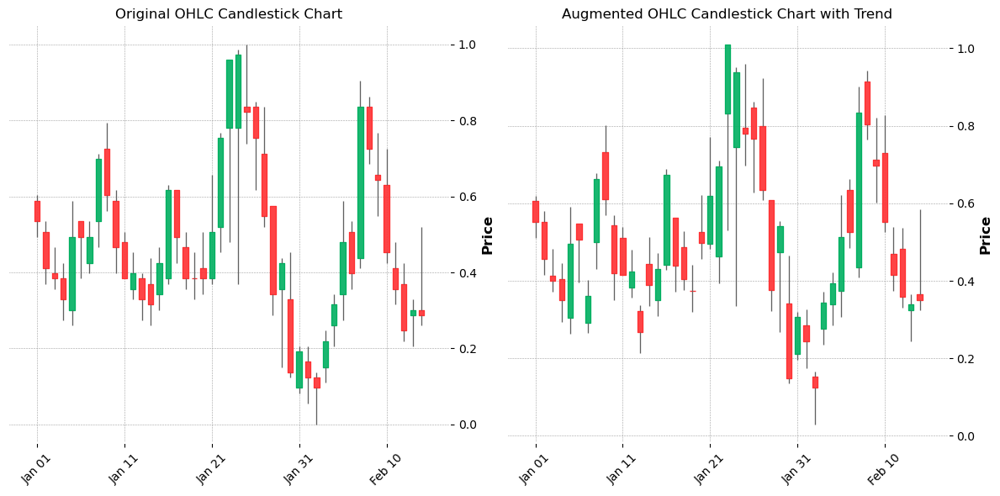


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.012196363742619745


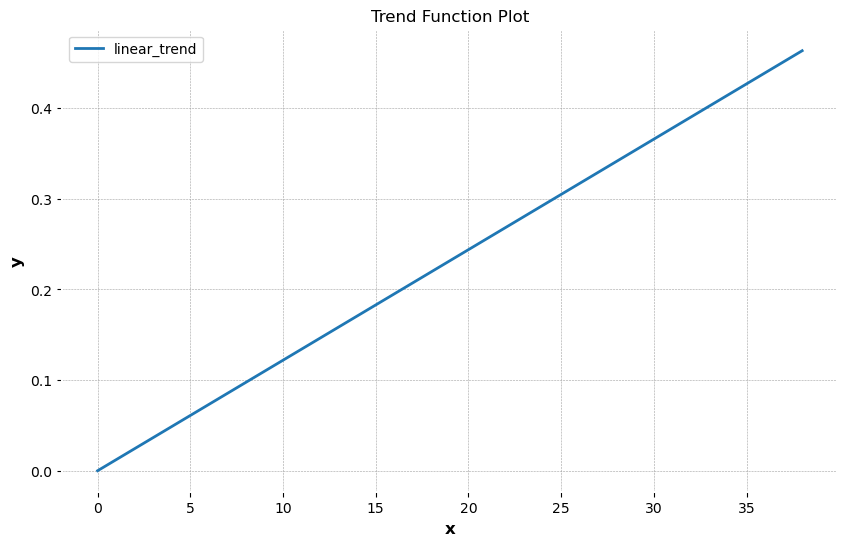

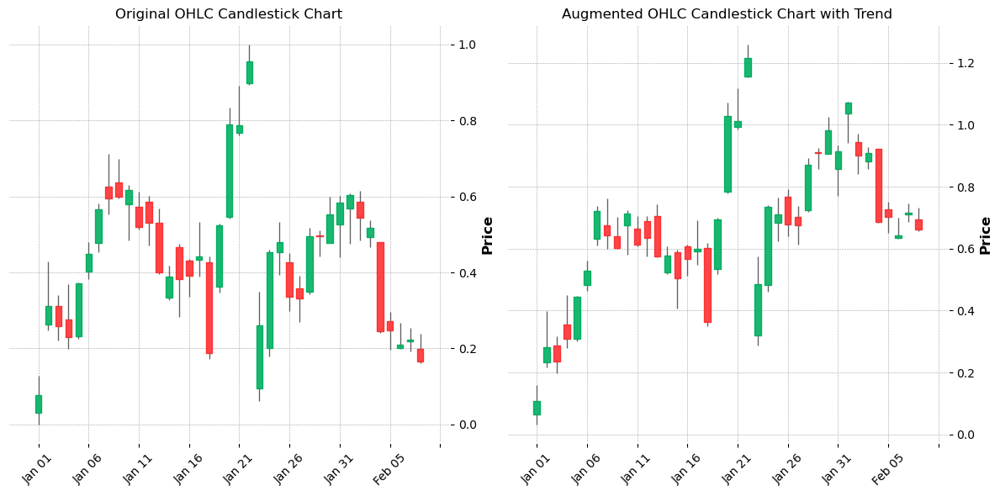


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.008069258562097373


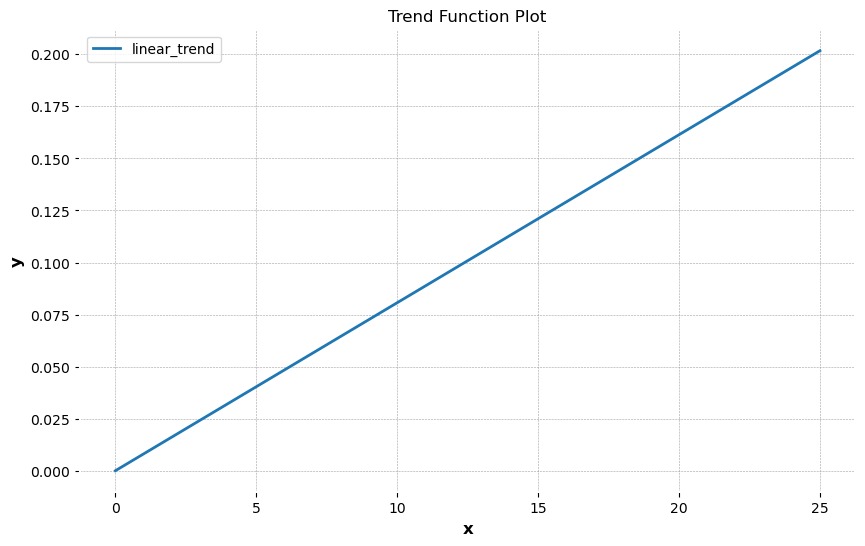

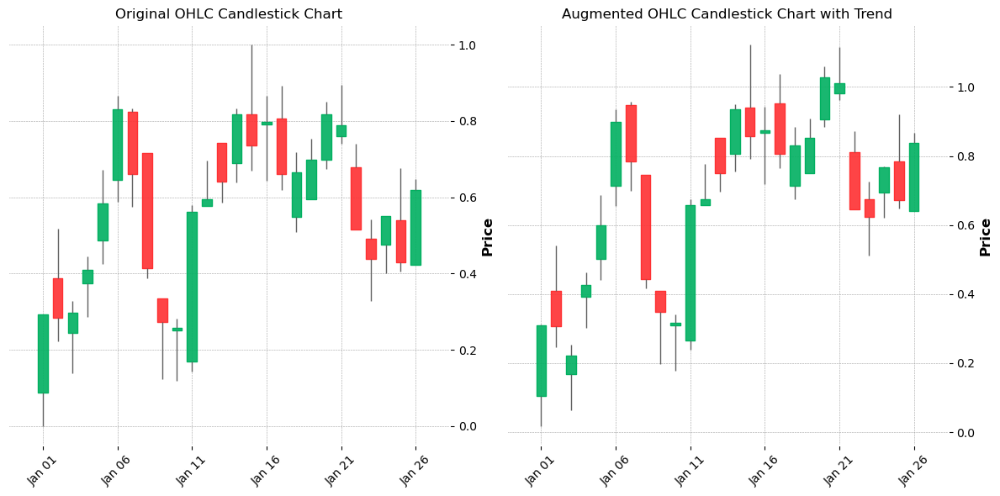


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.010249403725260155


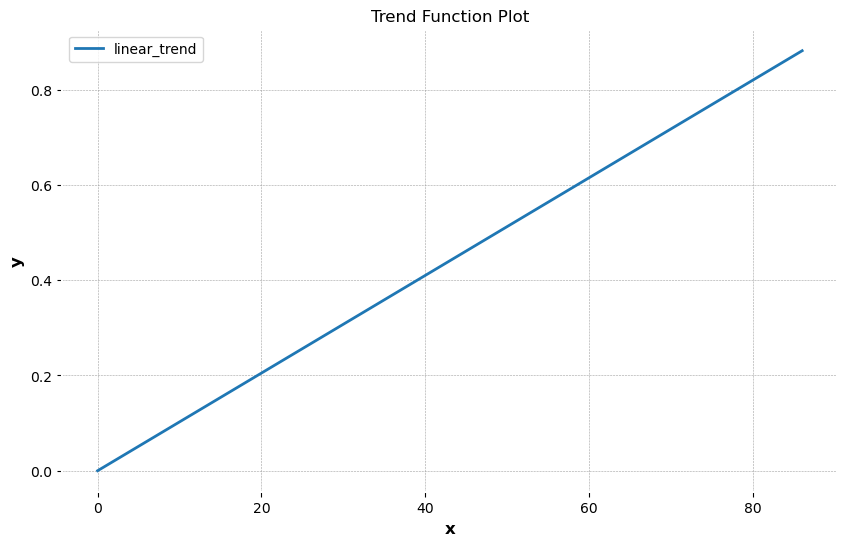

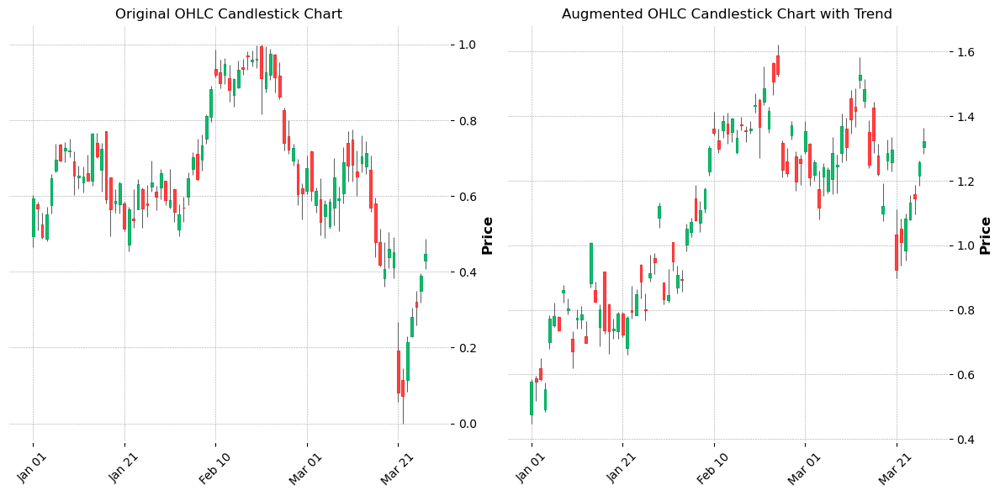


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 1.3212702395905968e-05 b: 0.0016220943536062174


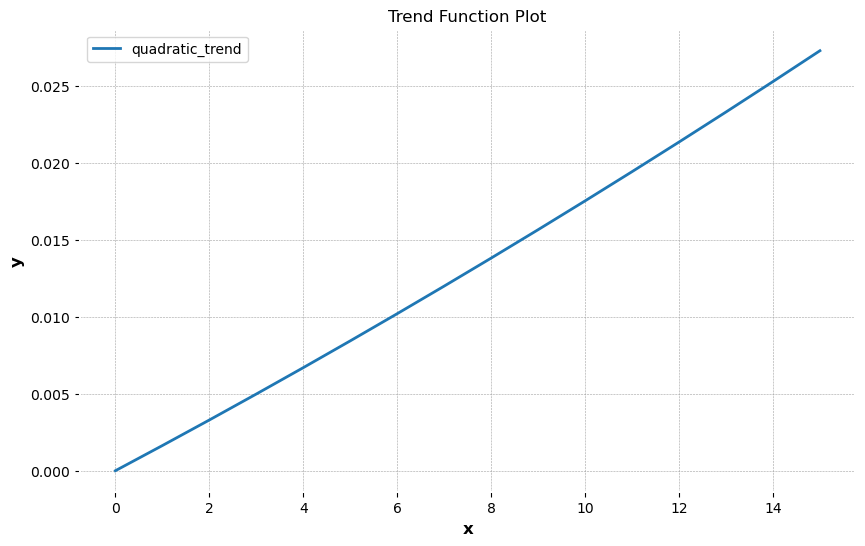

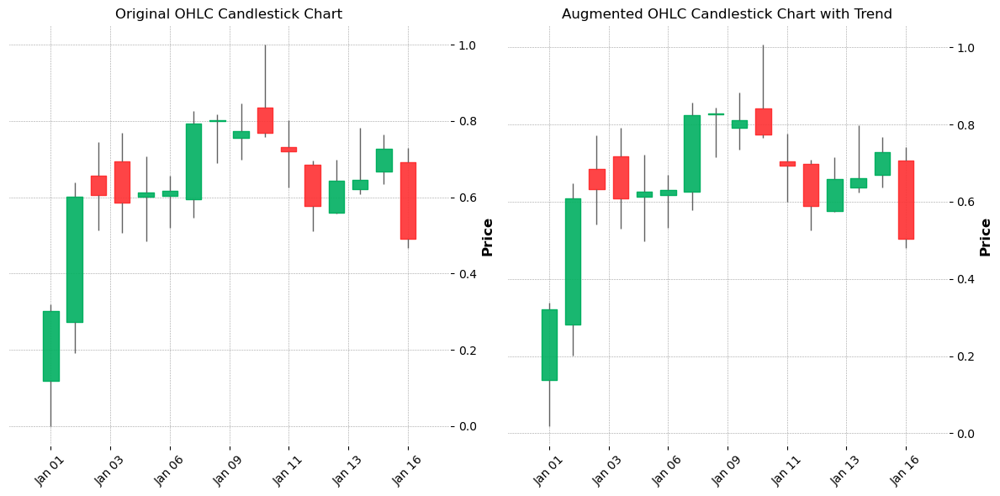


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.09634488126089777 frequency: 0.416655569646862


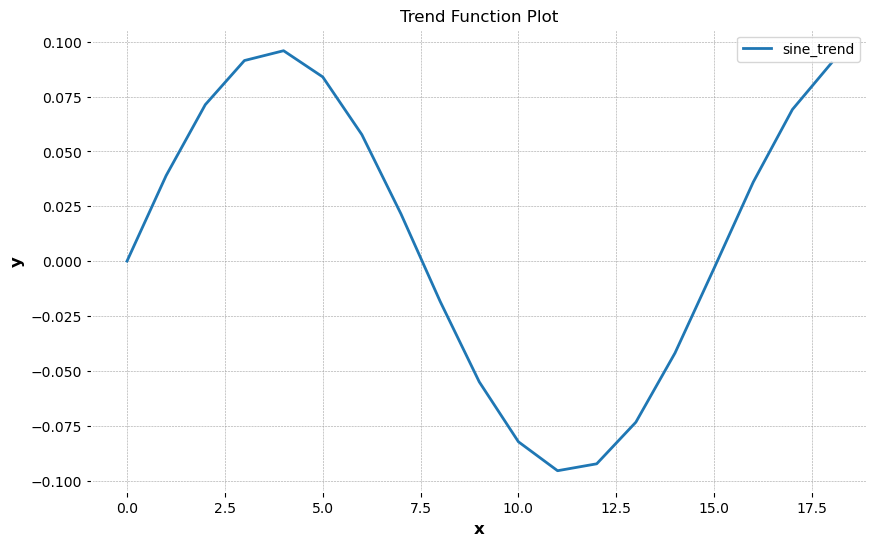

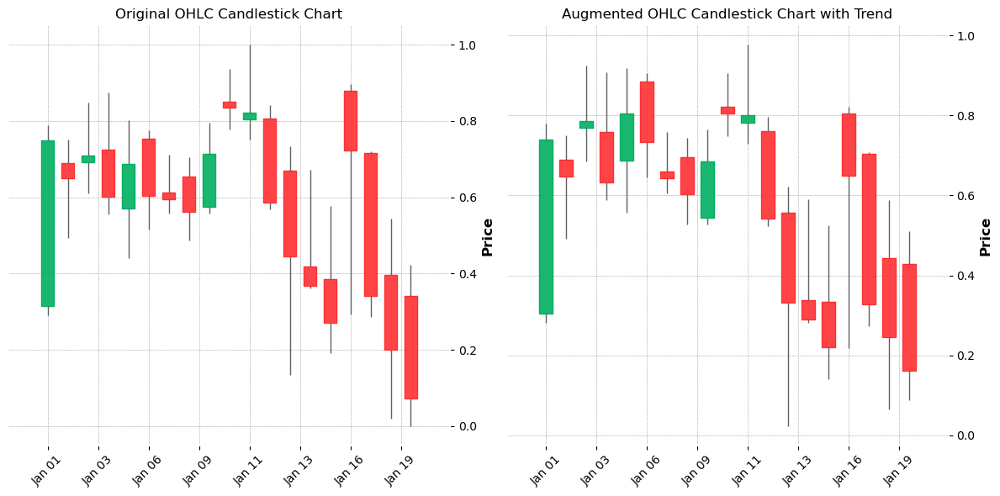


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.10829746354617935 frequency: 0.02245128158802657


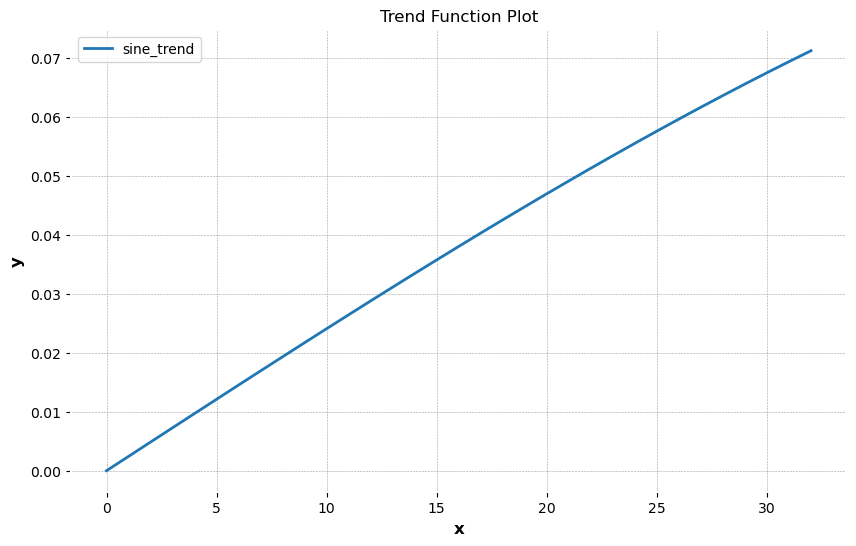

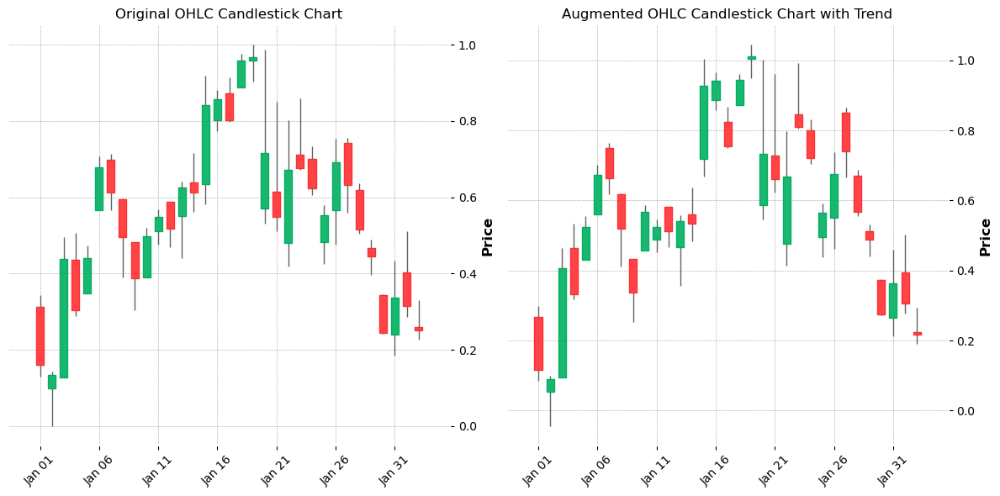


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.007819642259477051


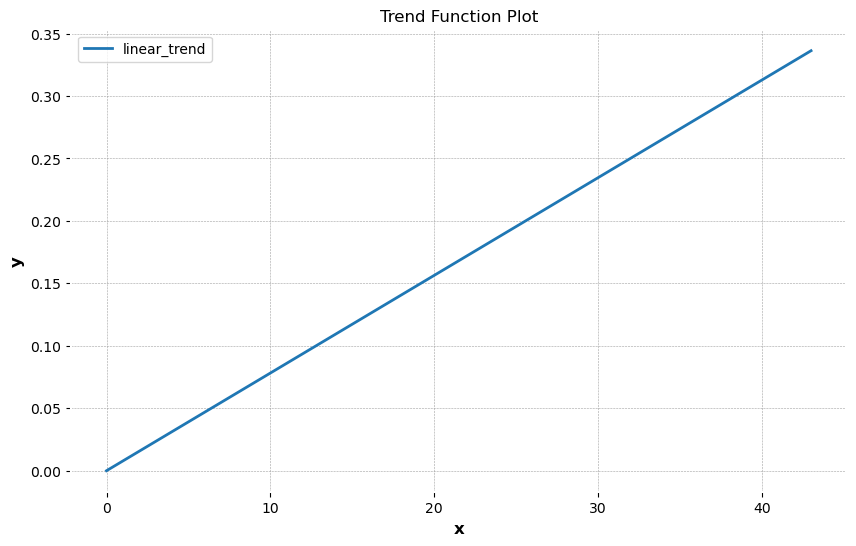

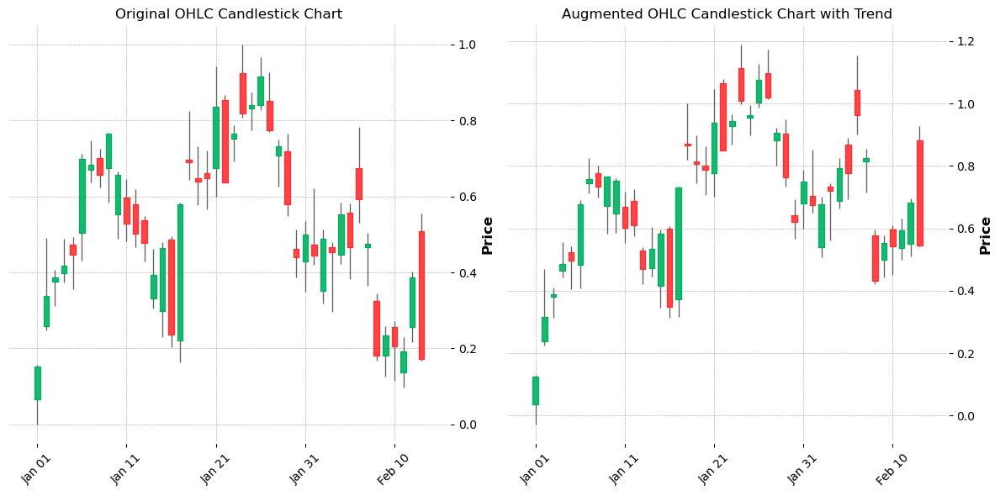


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 7.30906776425917e-05 b: 0.001586474077277506


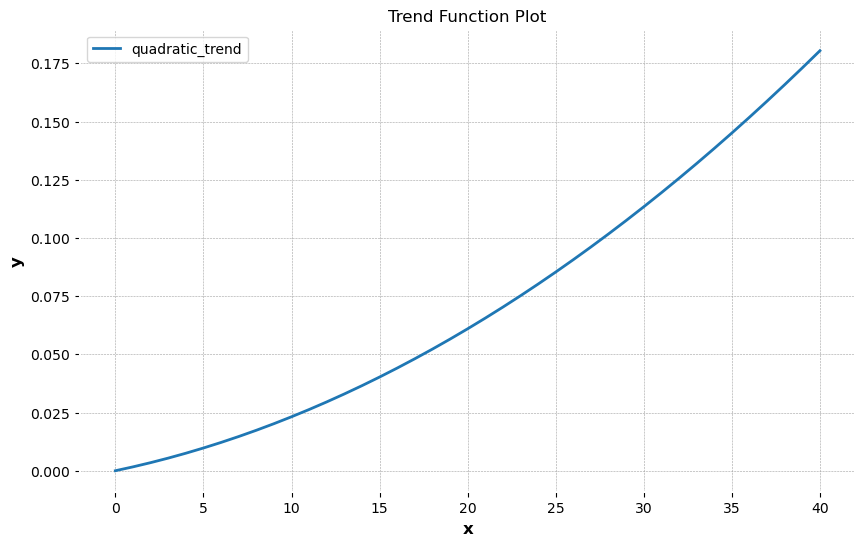

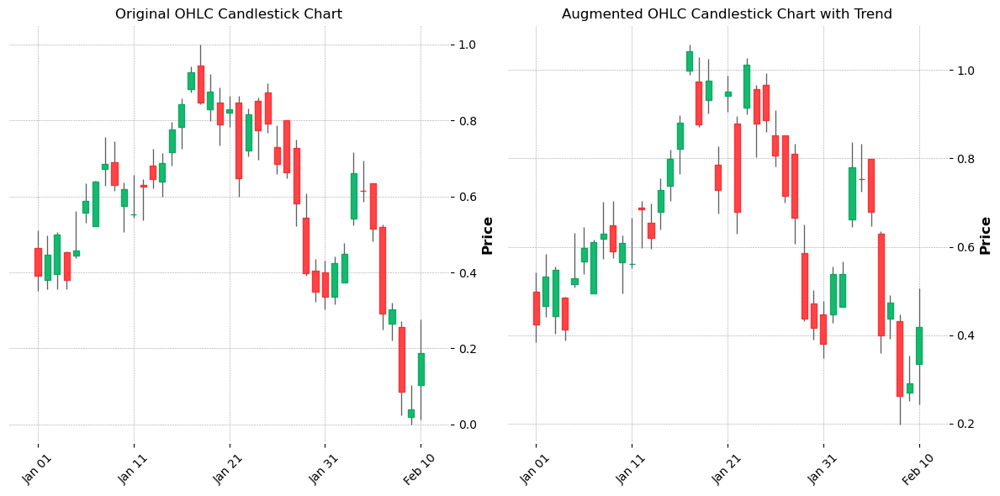


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.09235264444100236 frequency: 0.812803339517597


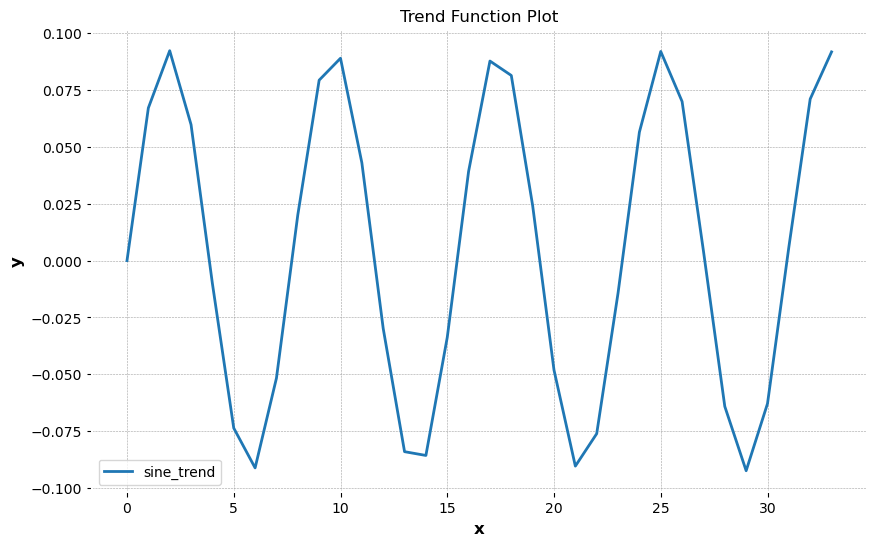

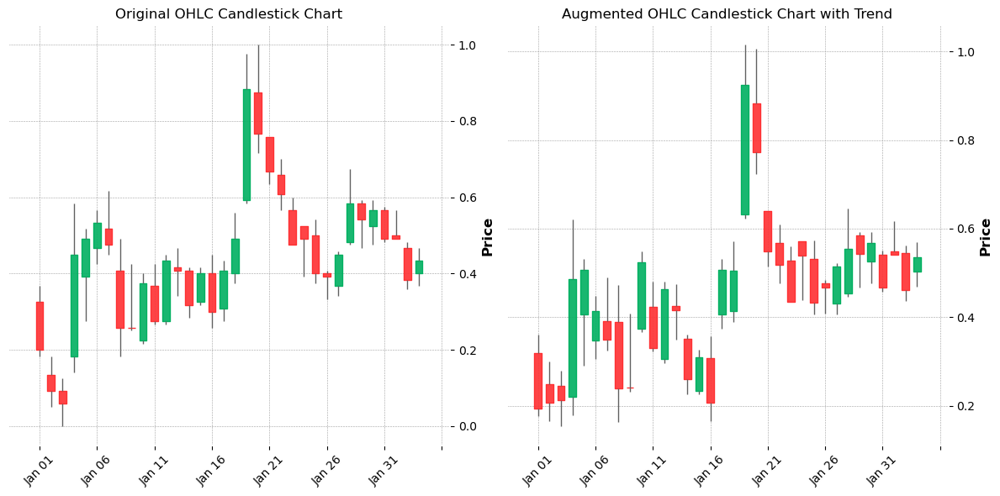


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.008172794577767772


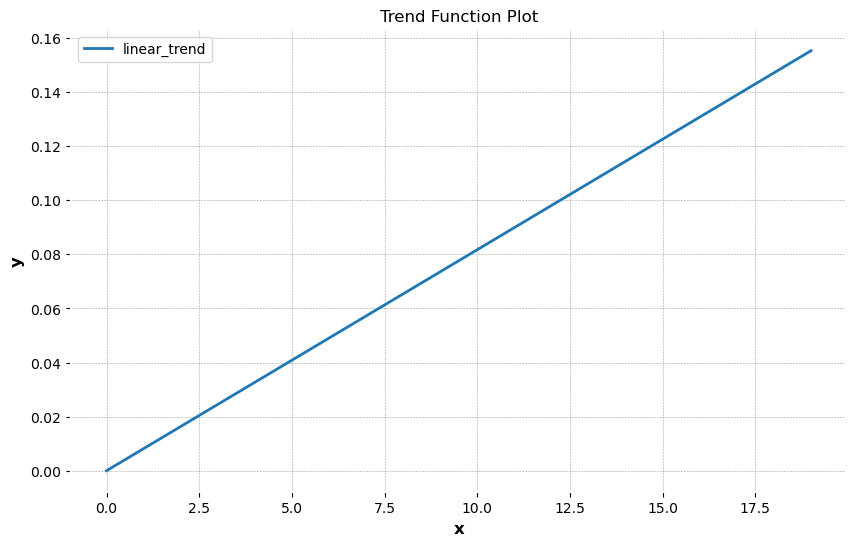

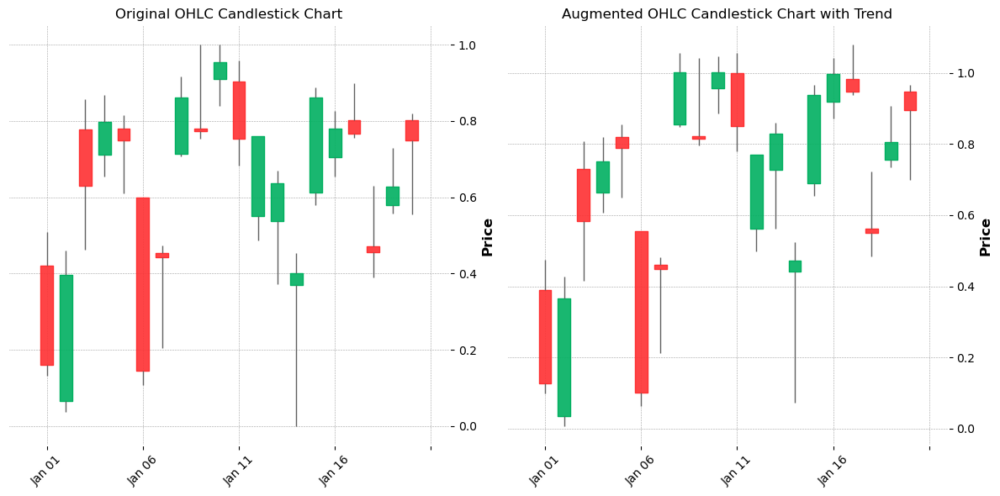


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.12375126620812424 frequency: 0.26518456298366283


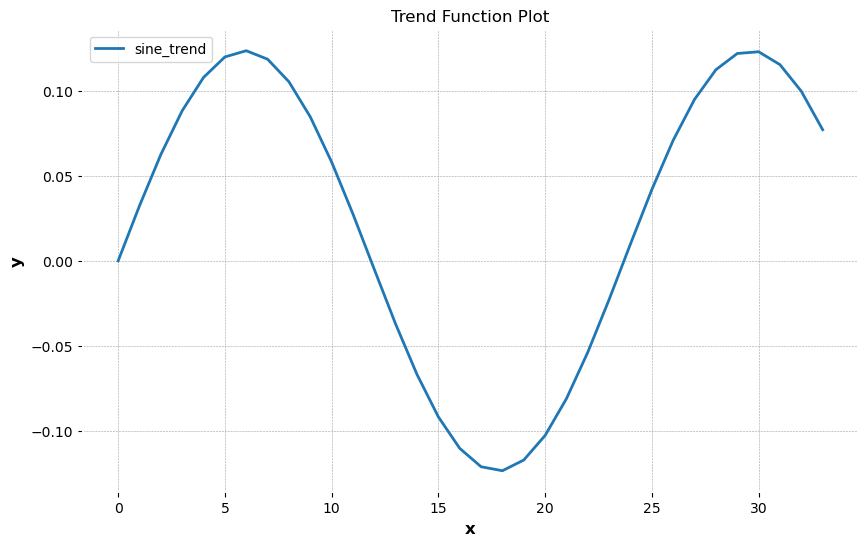

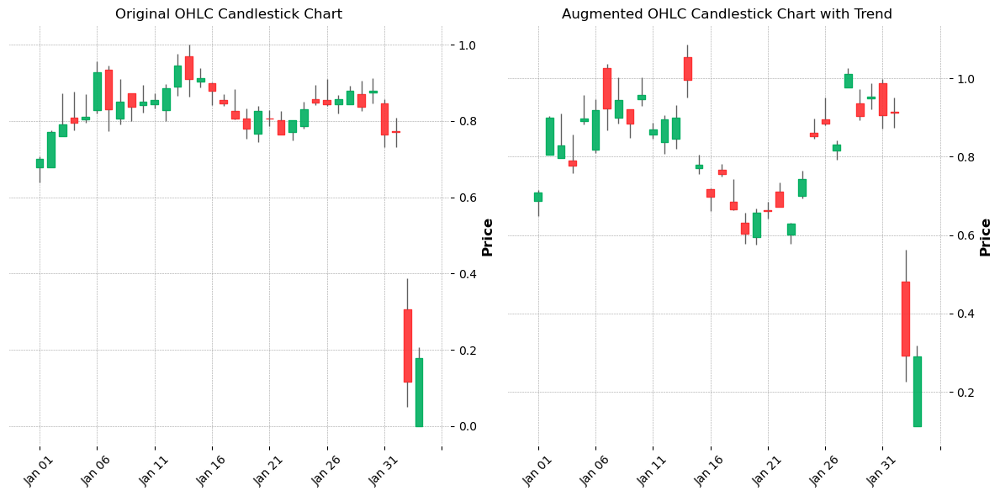


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.10479798556257232 frequency: 0.15210931309747913


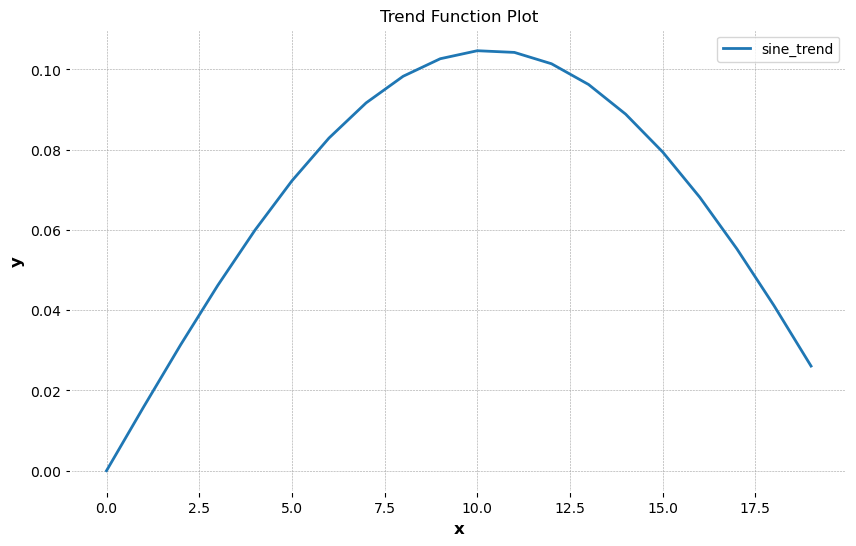

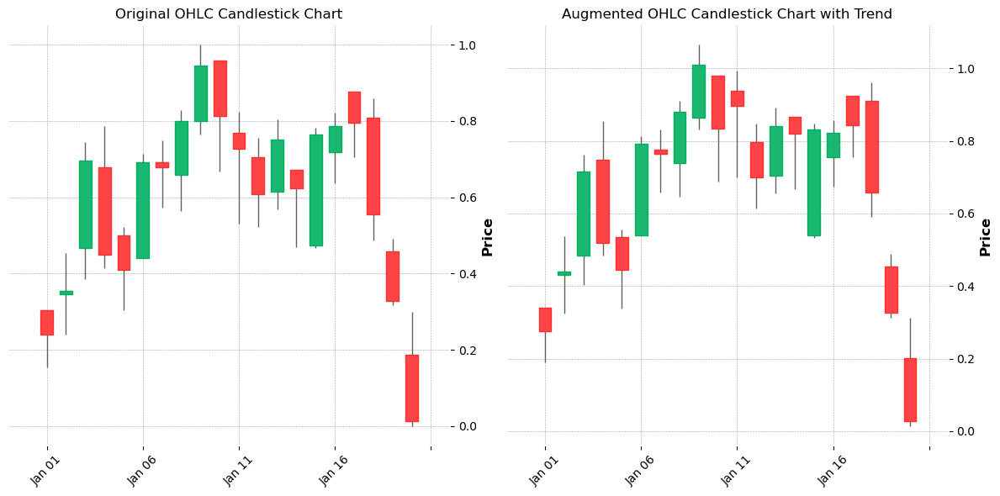


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.0053326494059026345


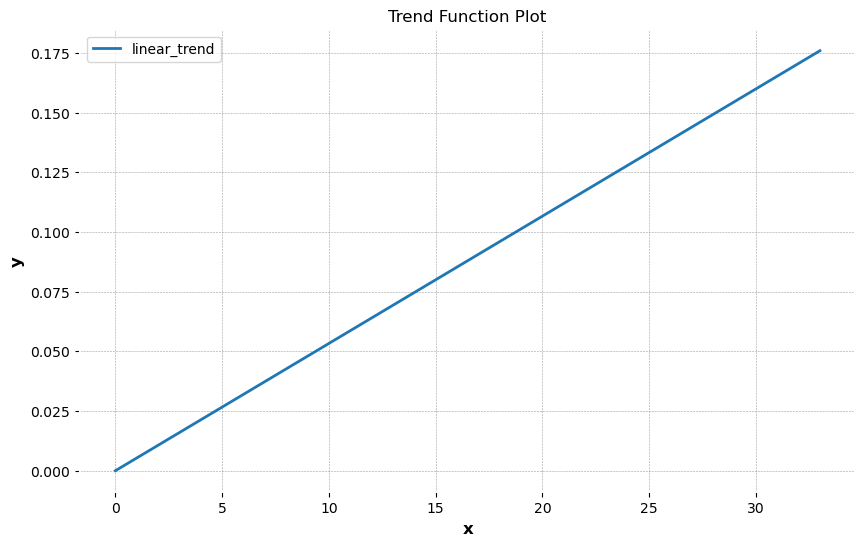

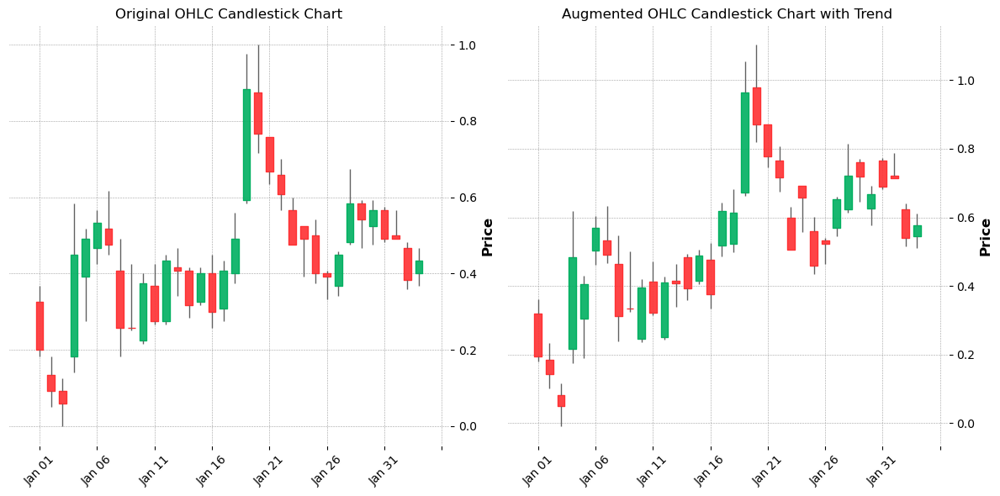


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.27304648085756805 frequency: 0.3920075902516237


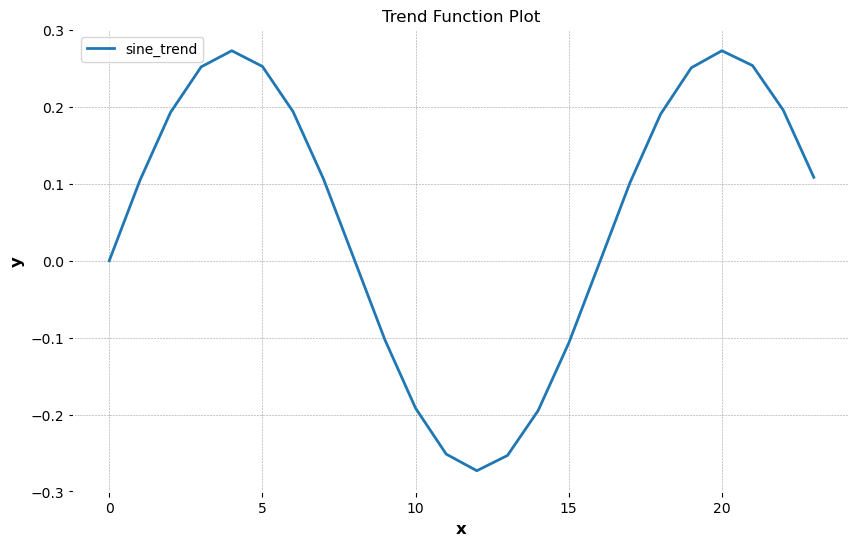

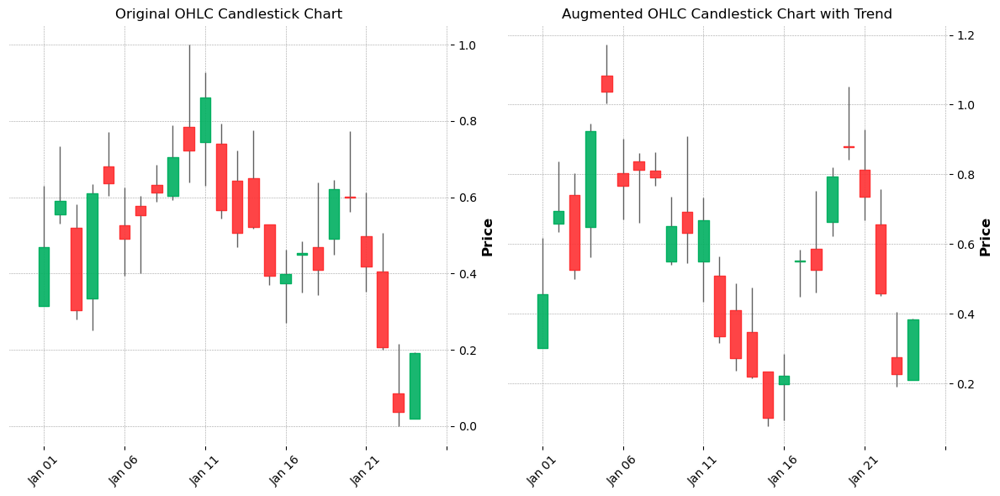


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.27401544137729295 frequency: 0.11324368967931721


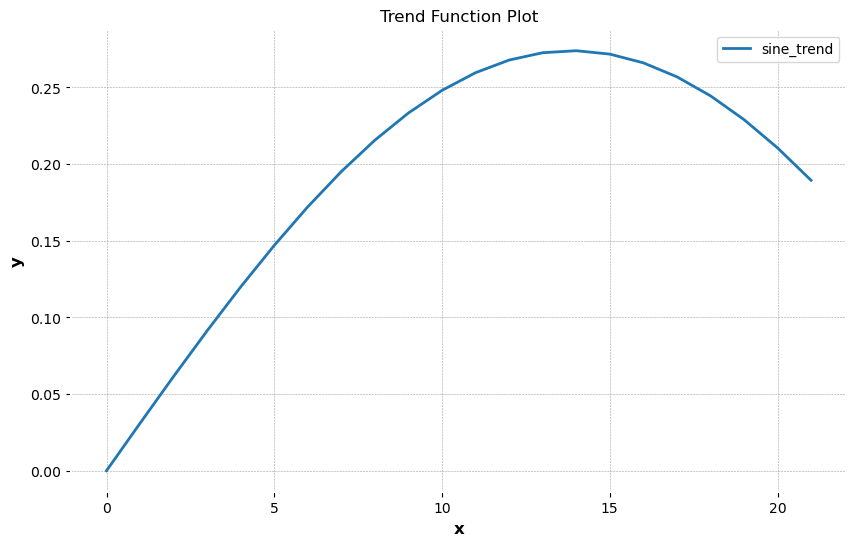

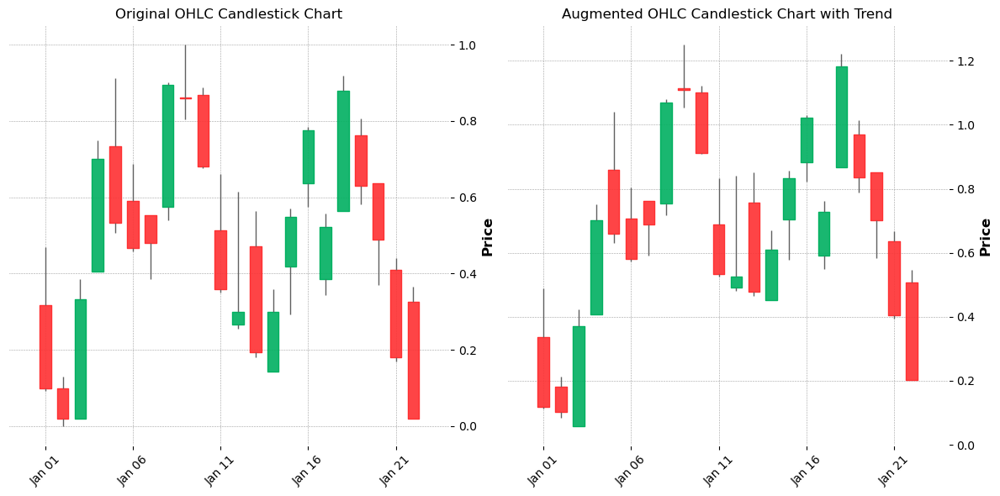


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.15768783577683393 frequency: 0.30425772254778843


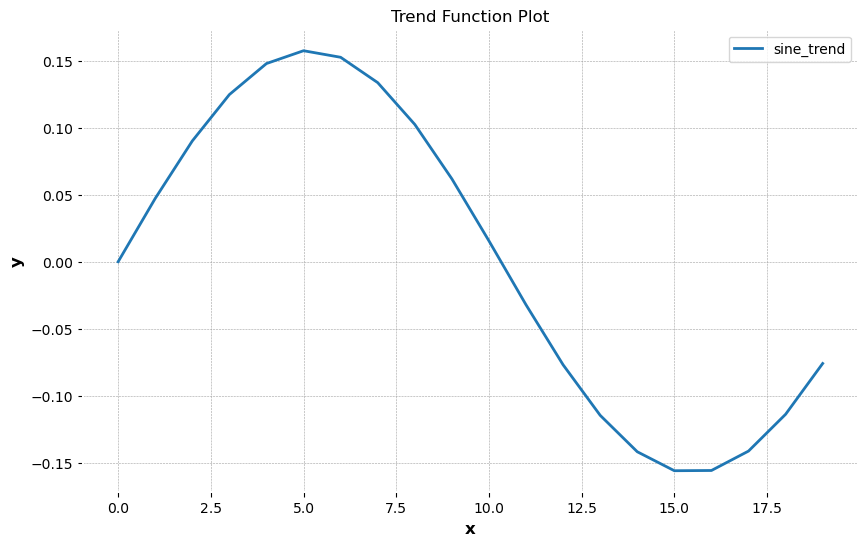

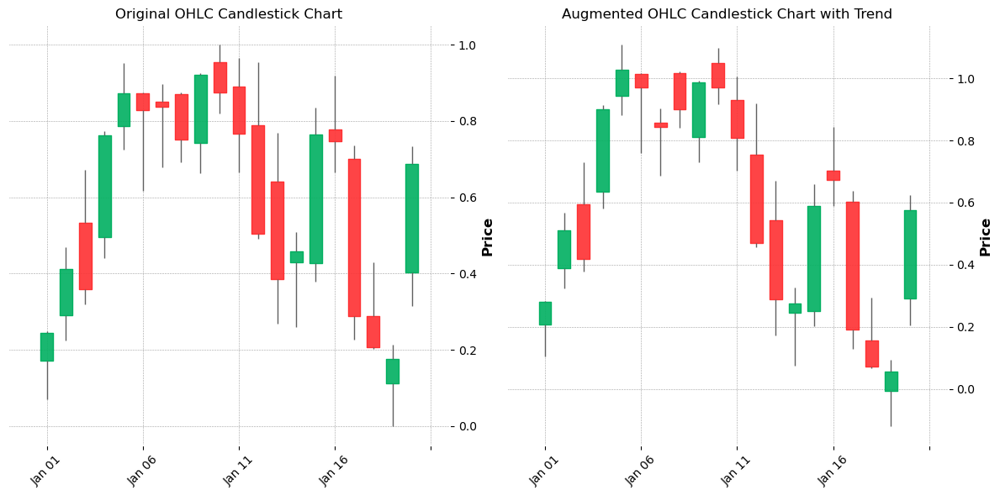


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 5.797924230193235e-05 b: 0.004970739339483253


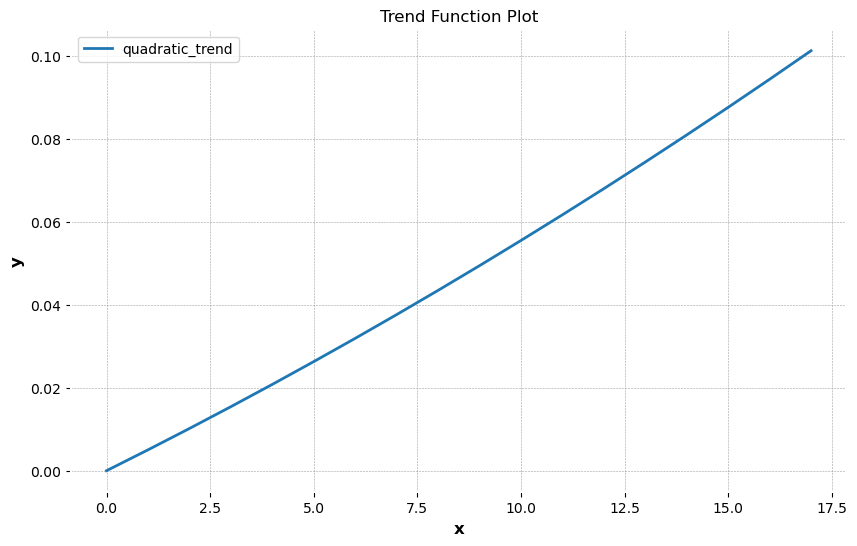

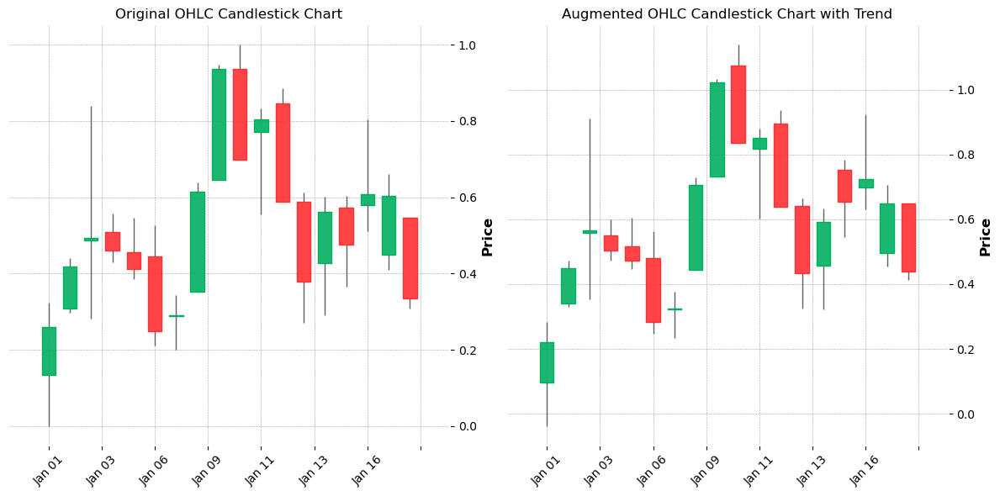


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 2.9248988175136115e-05 b: 0.004302869555870229


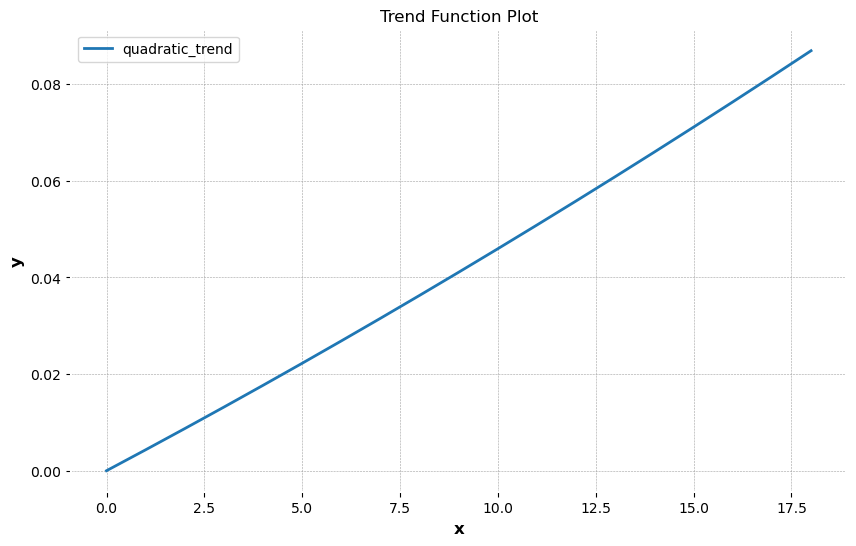

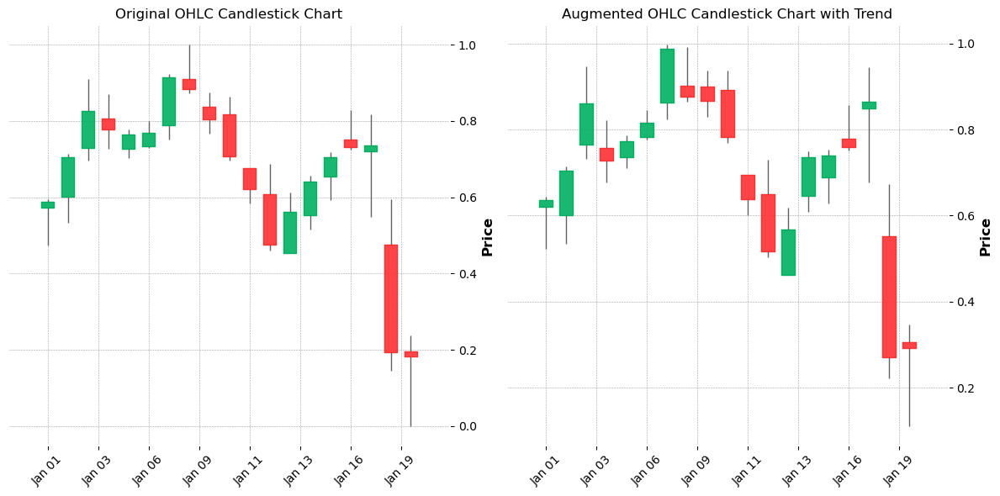


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.2814610417315088 frequency: 0.540480753764509


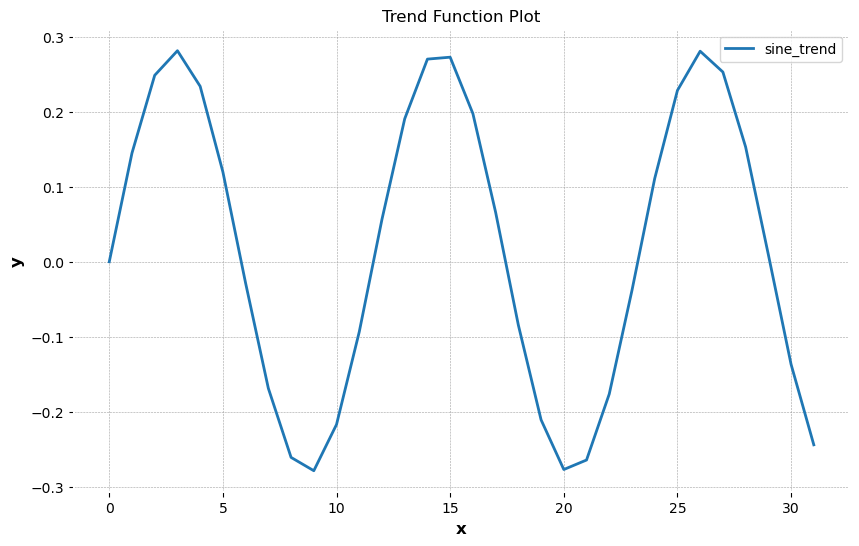

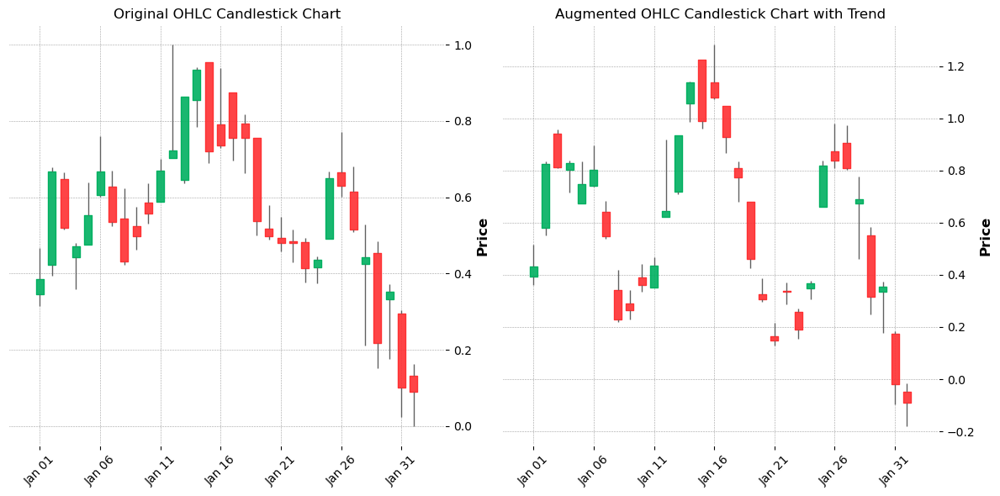


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.011192308428293177


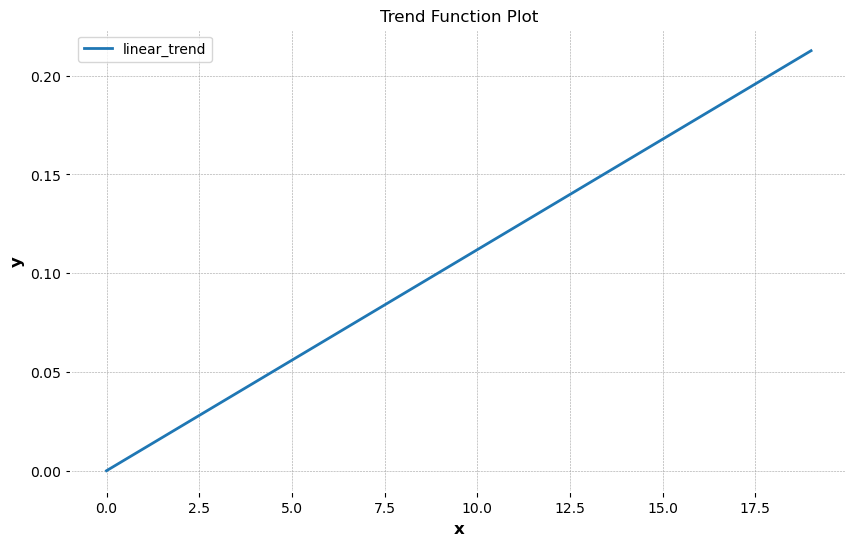

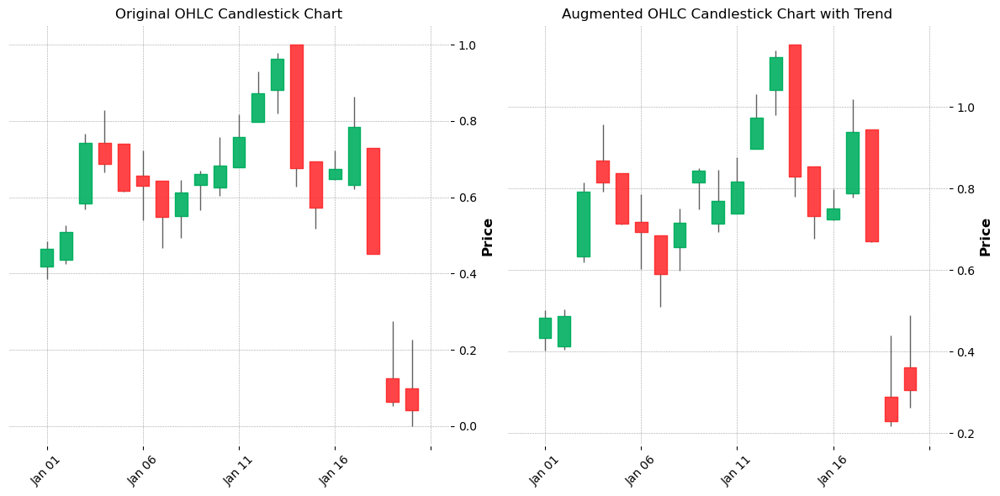


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.008566646986598956


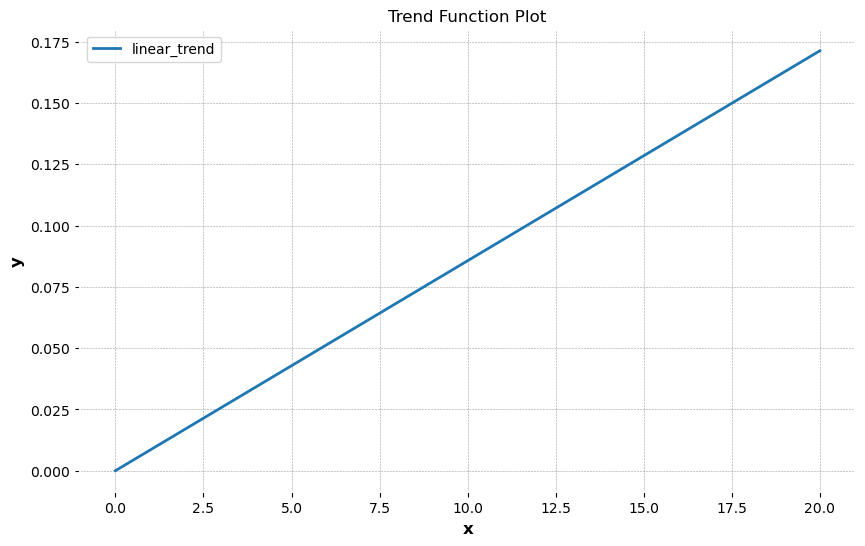

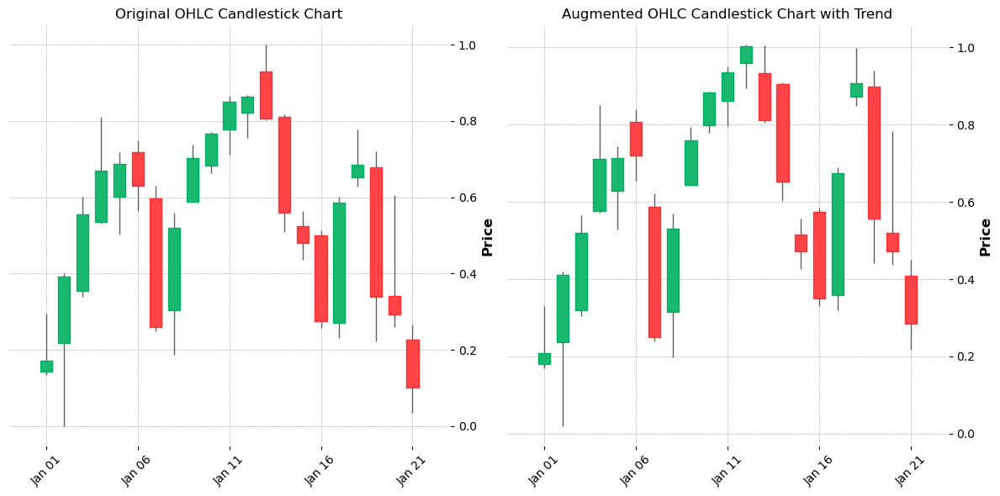


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.00889007662862542


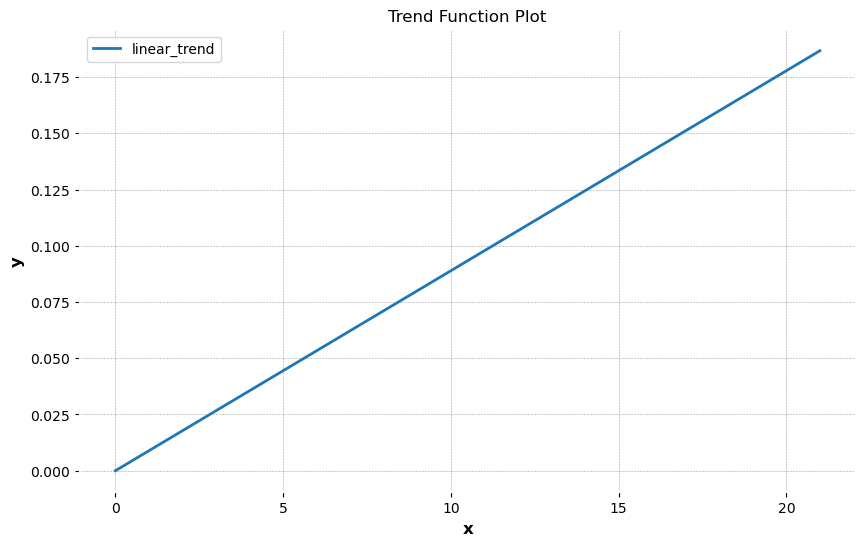

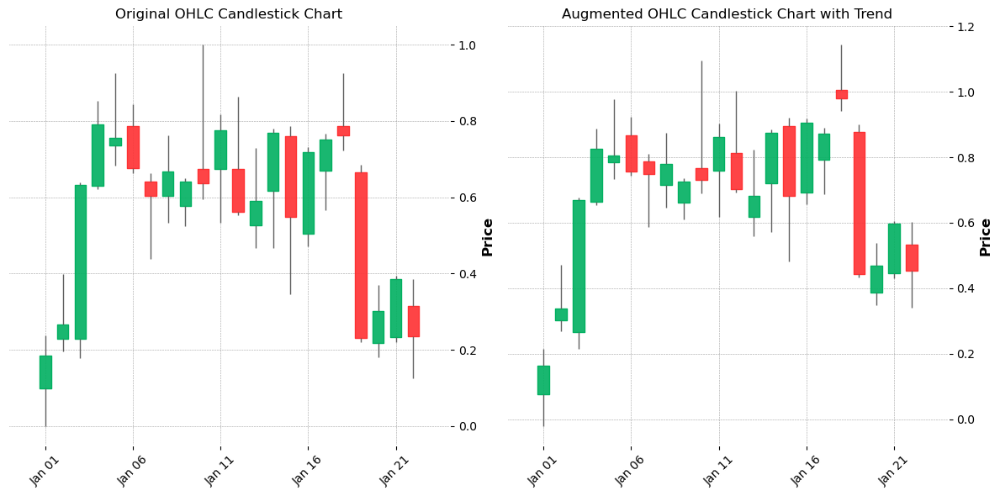


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.007991248585136565


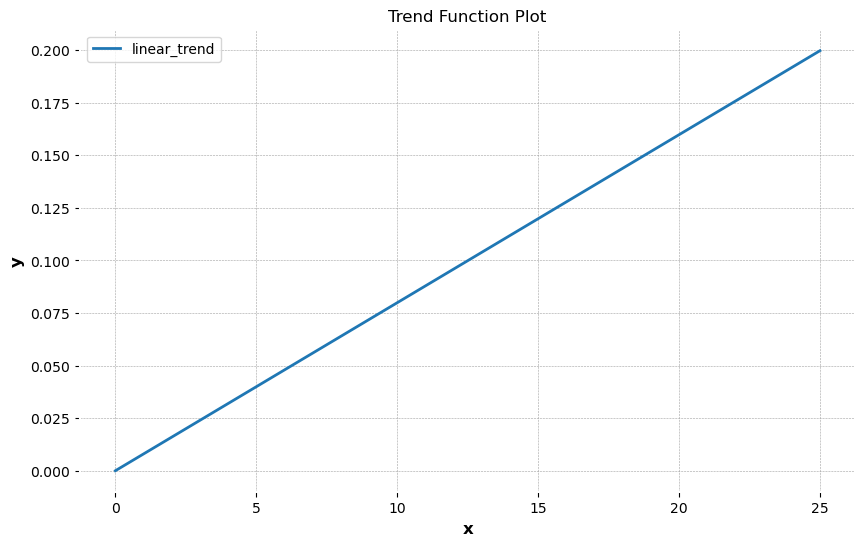

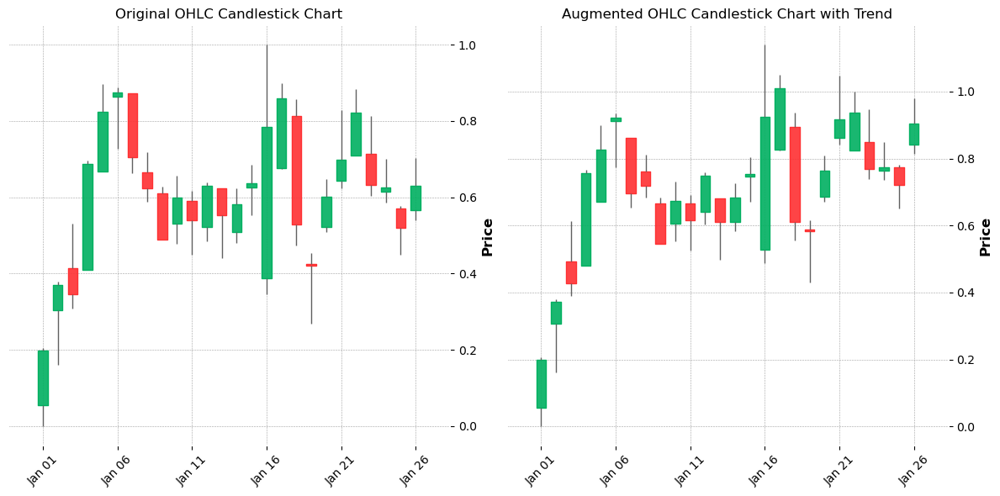


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.005827228900573965


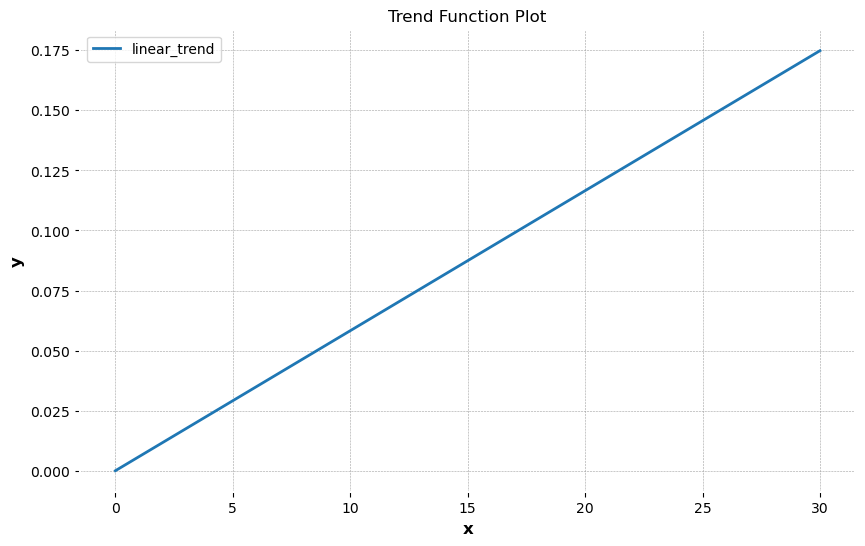

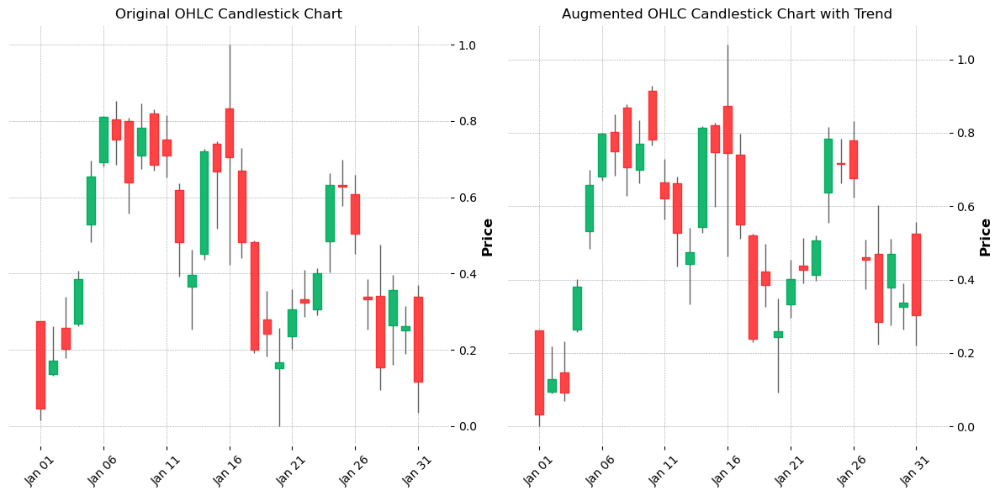


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 4.444591078861293e-05 b: 0.005319602081367369


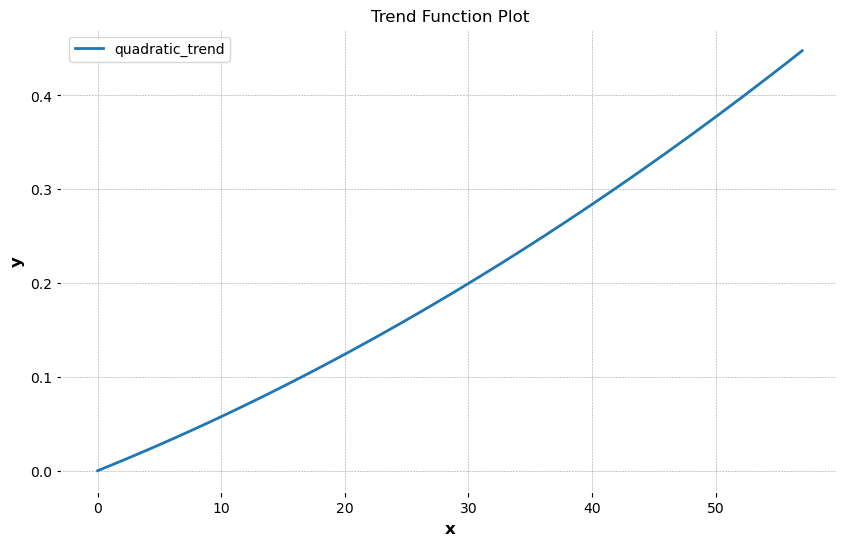

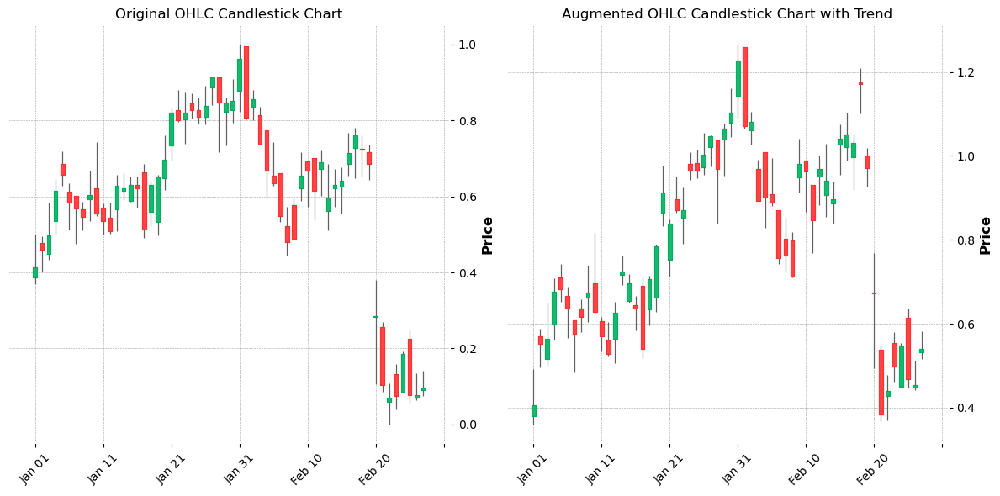


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.007758148755421135


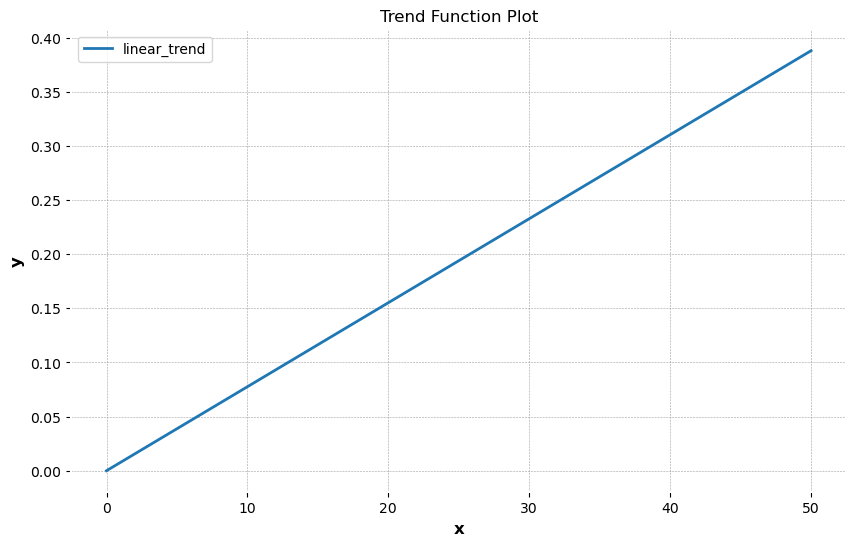

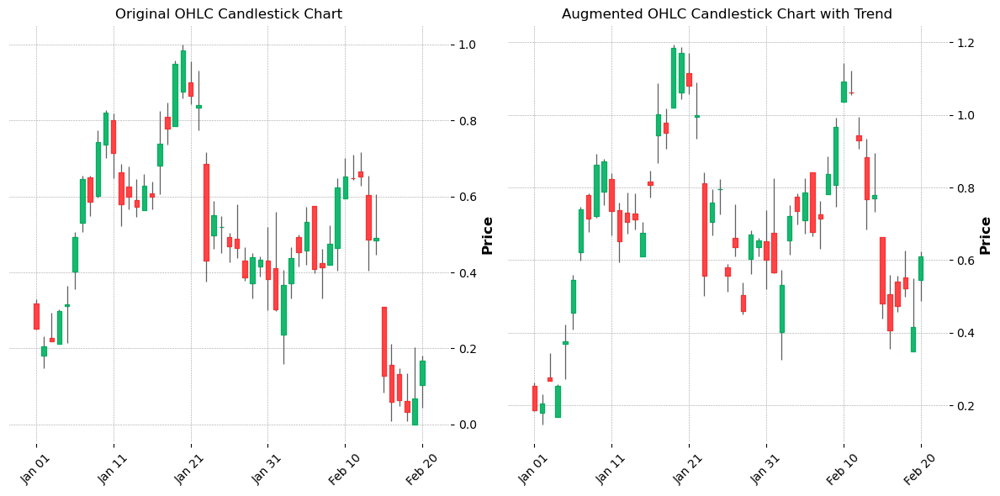


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 0.0001125544623886854 b: 0.0024291216709212


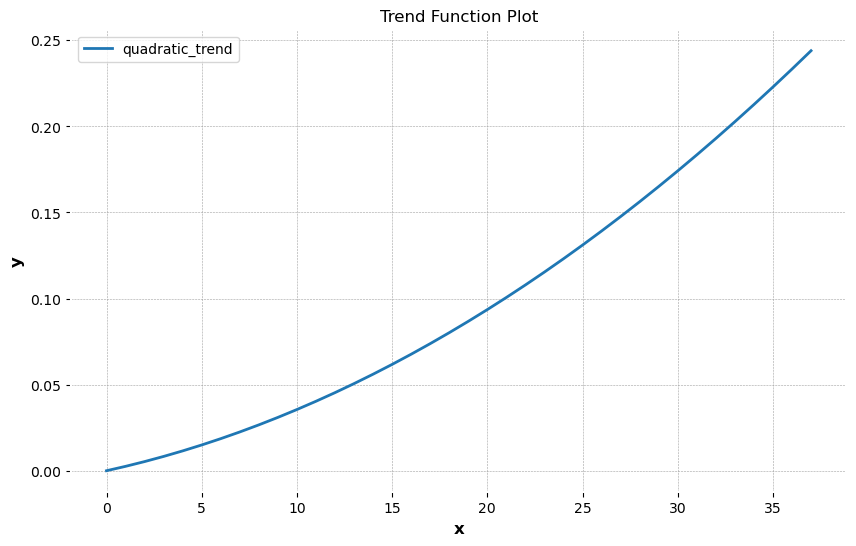

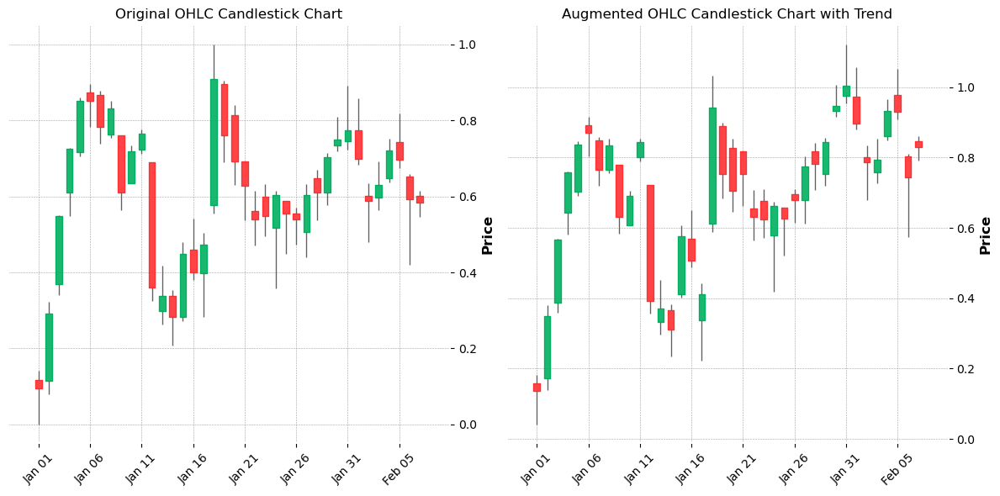


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.05531558132361619 frequency: 0.2832921870385404


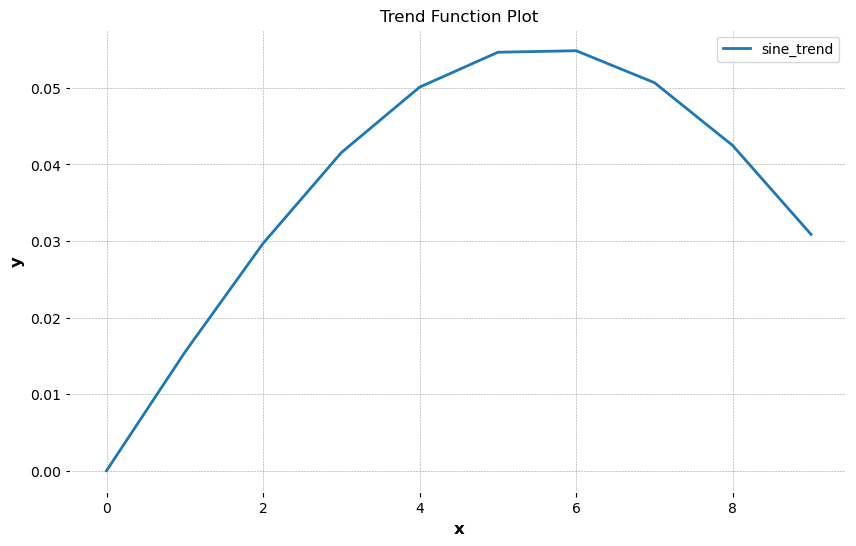

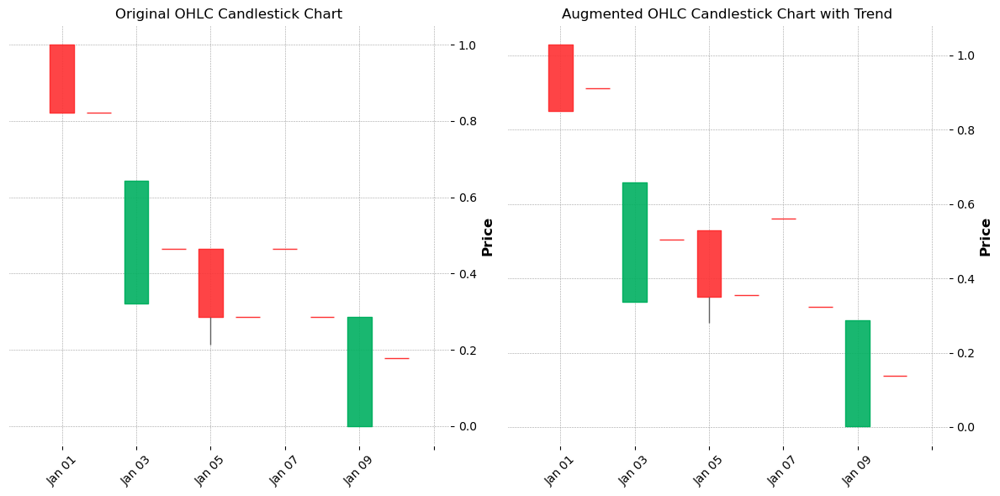


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.22548932127894 frequency: 0.37601974690208395


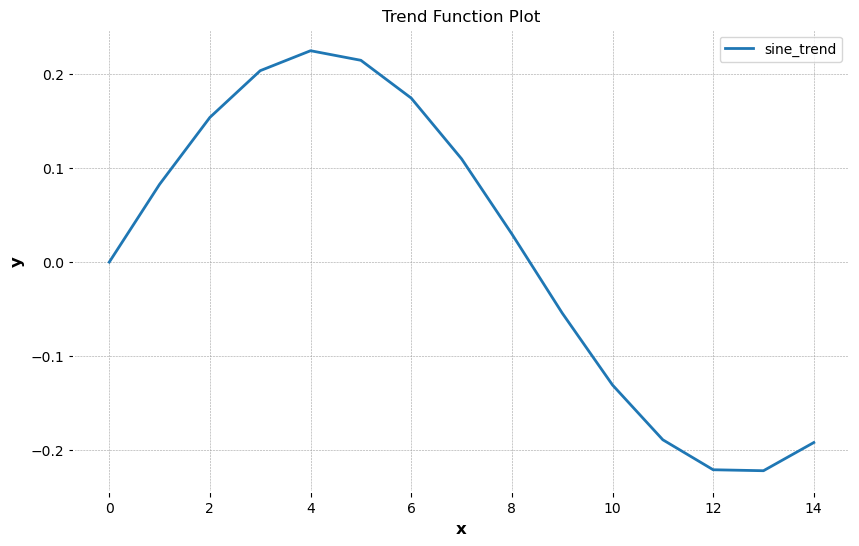

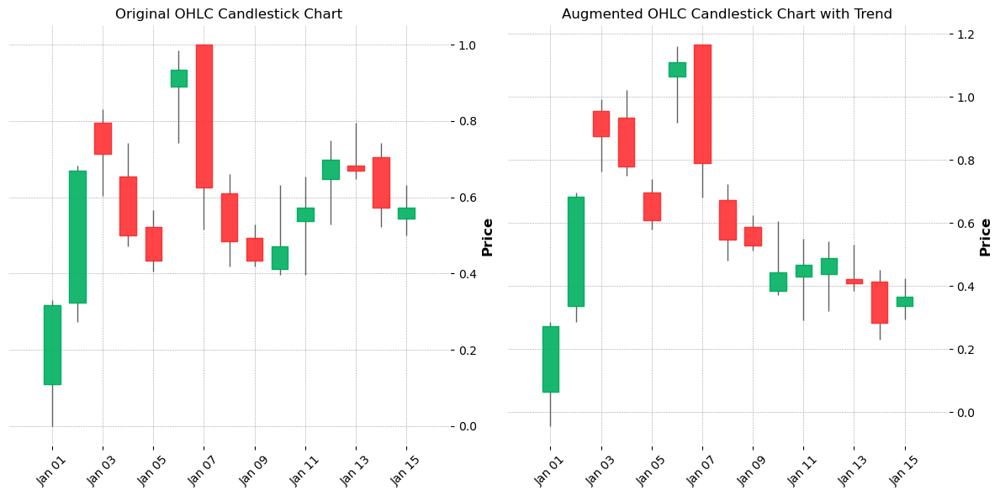


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 1.8090261259813735e-05 b: 0.00157606751511346


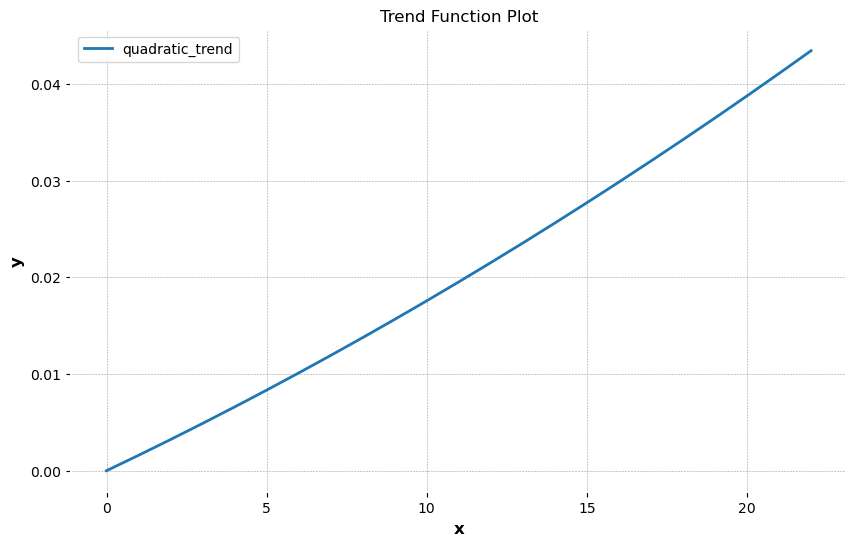

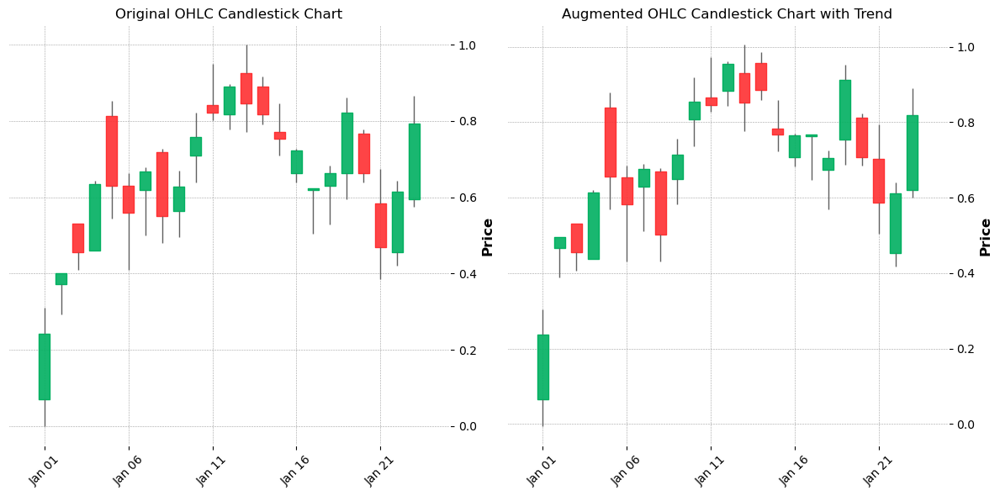


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 8.340383555276763e-05 b: 0.002389178654738319


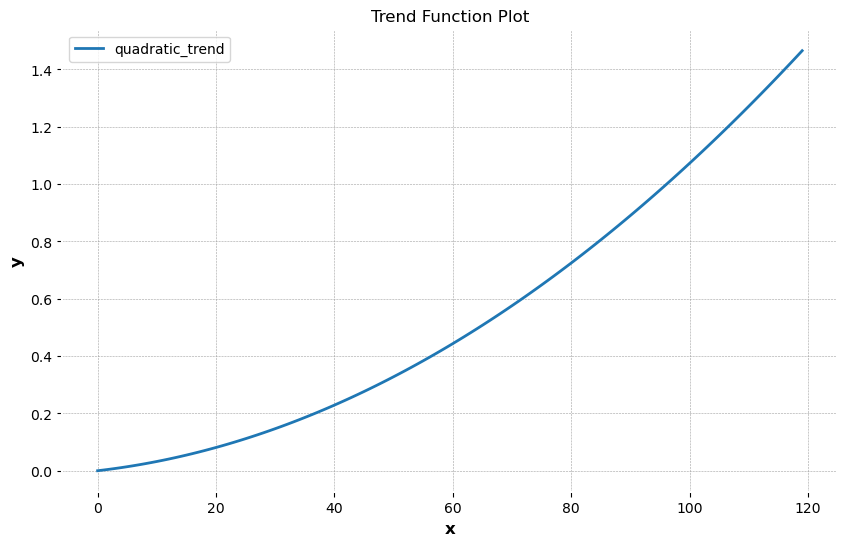

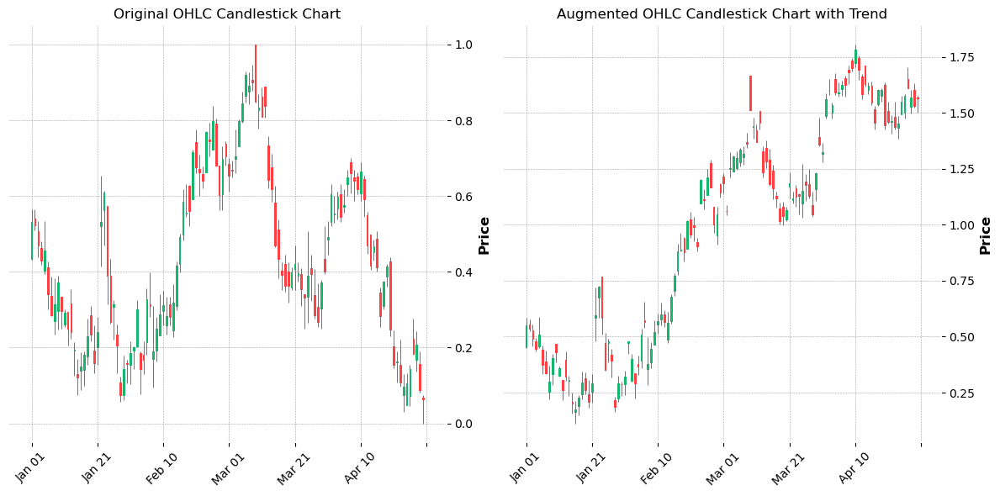


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 5.19173745425732e-05 b: 0.006025544672074528


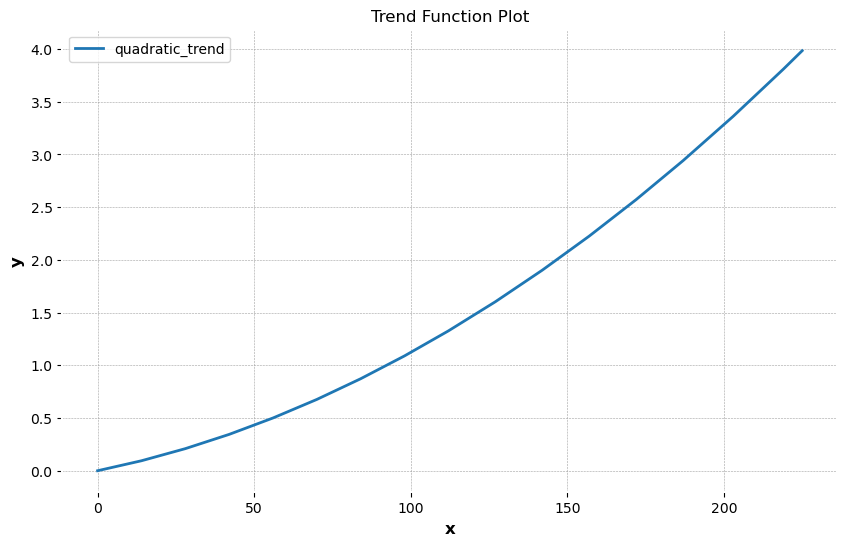

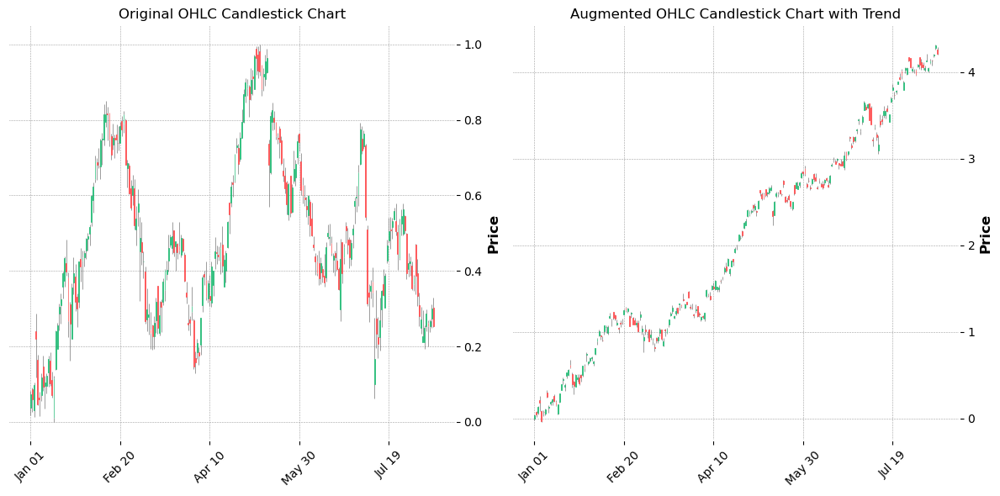


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.20386369676391172 frequency: 0.7709552919239845


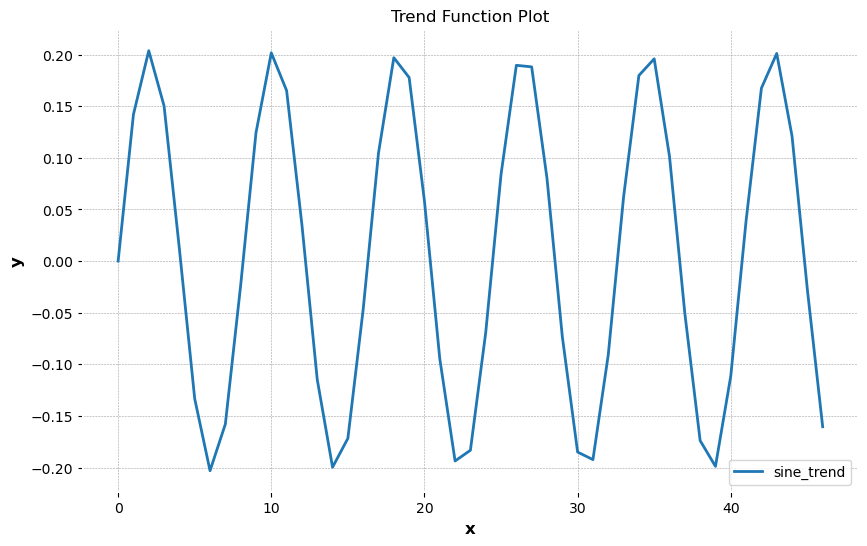

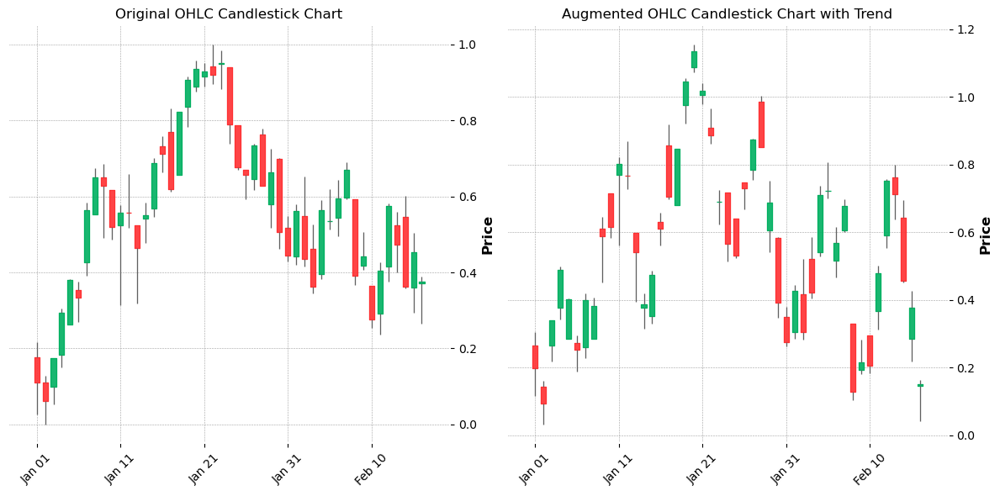


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.0030547082711864185


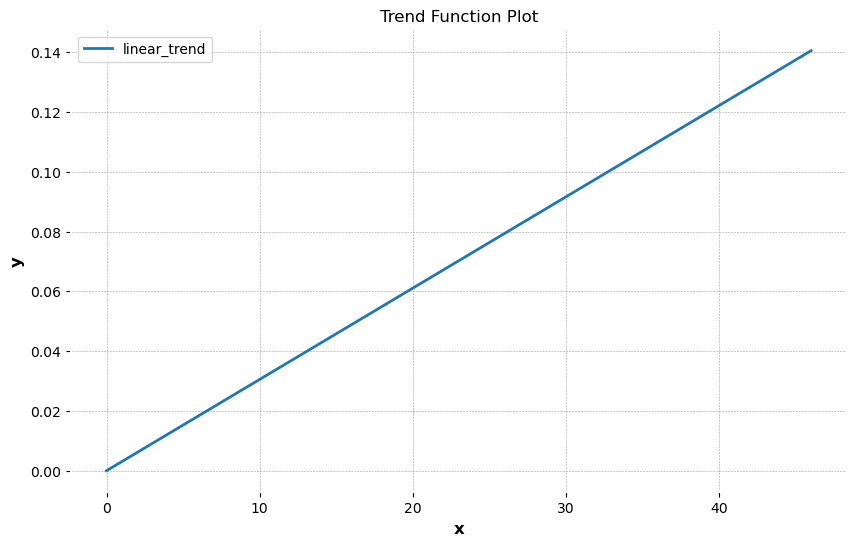

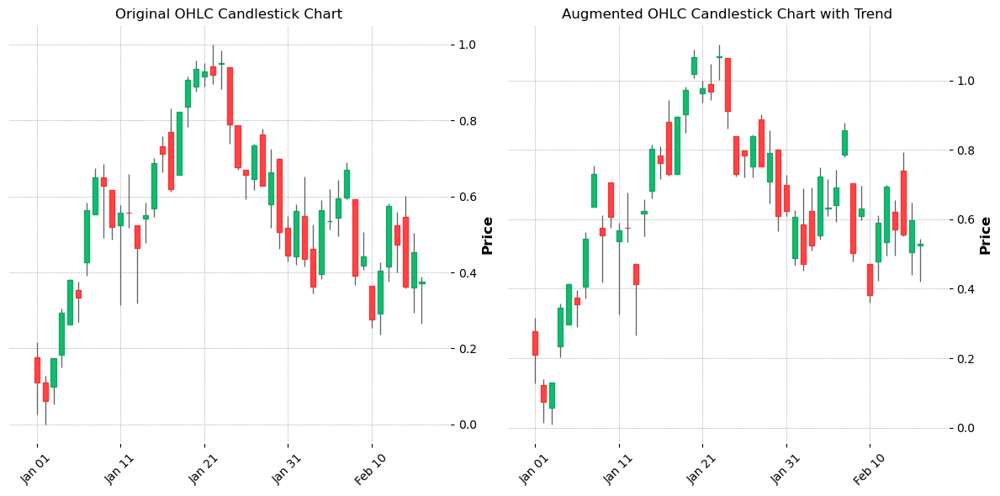


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 8.29142571458775e-05 b: 0.0037397673227201425


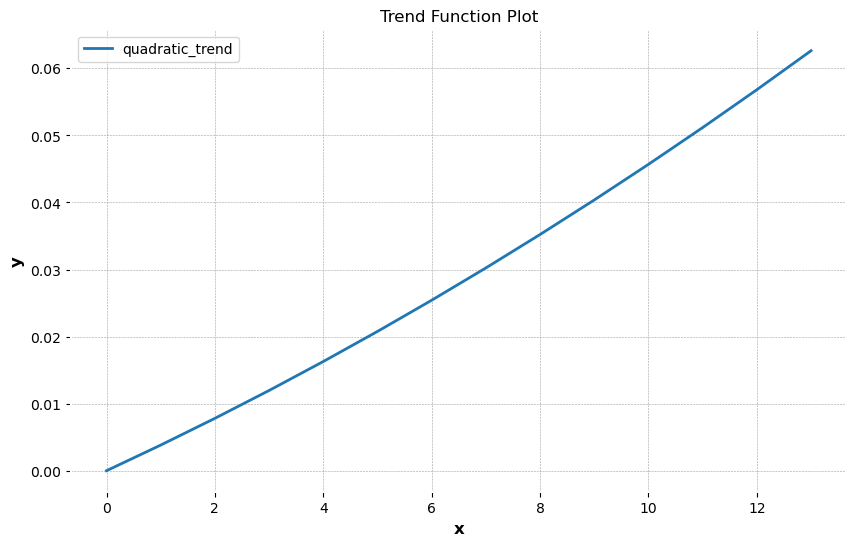

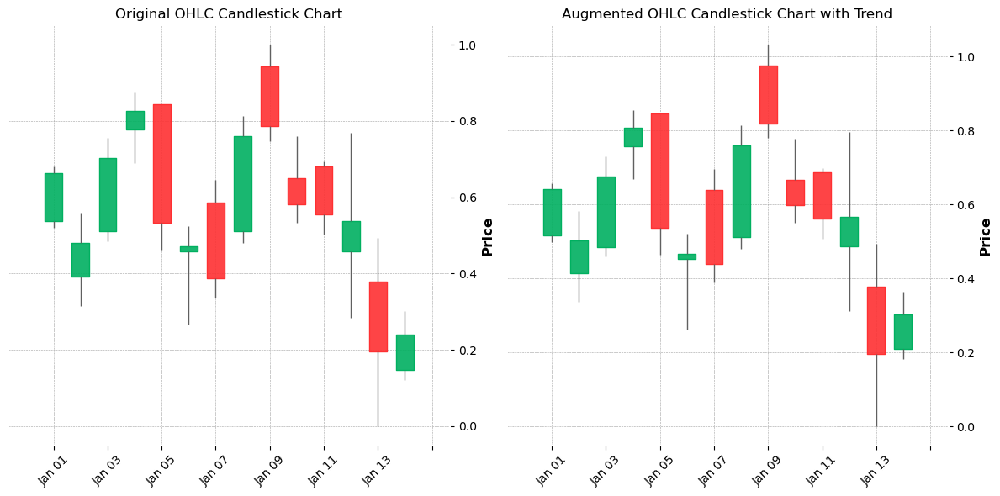


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.00454708280574778


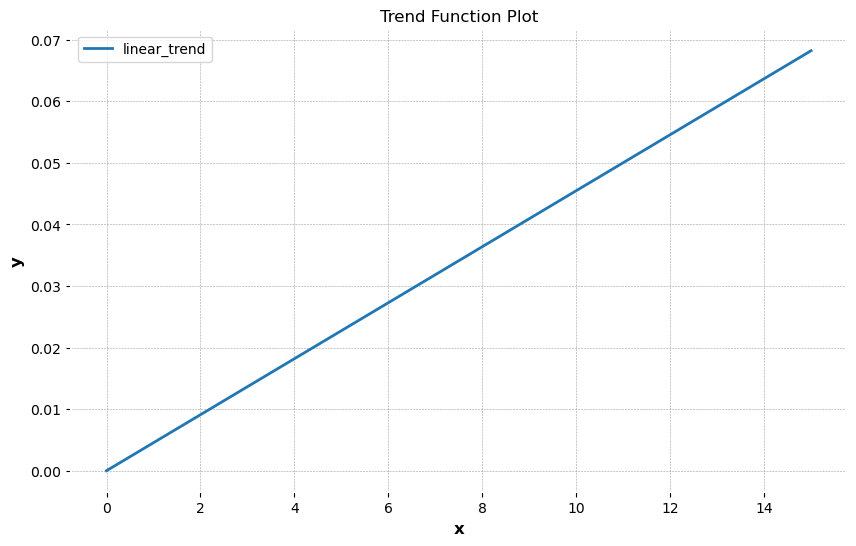

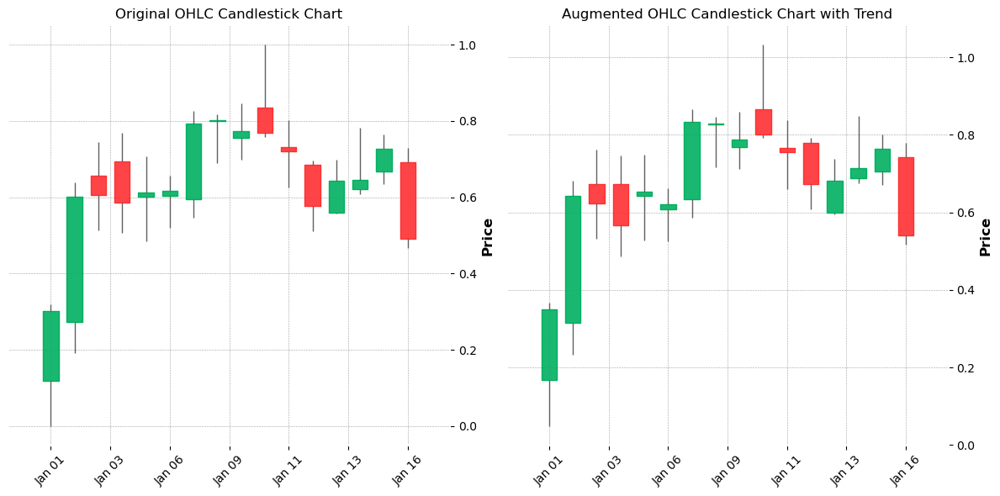


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.17957386177942714 frequency: 0.6757552533552921


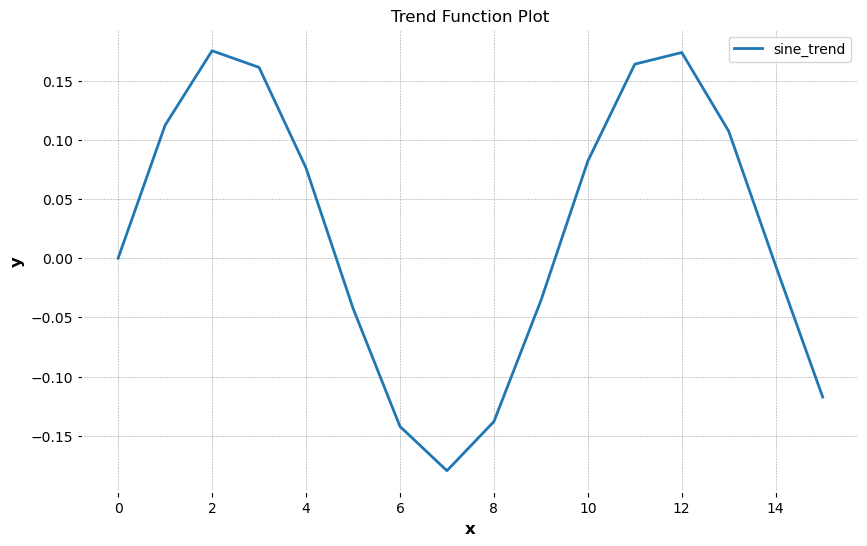

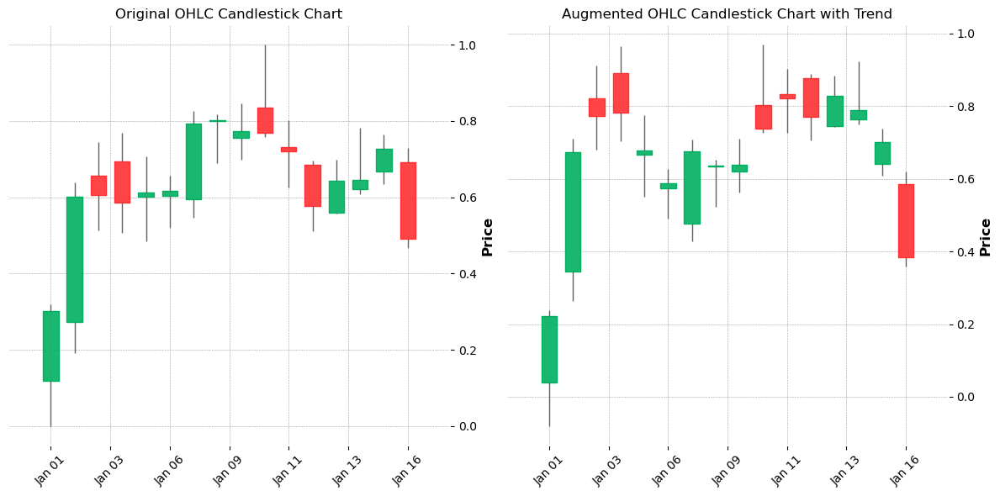


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.005721350680684506


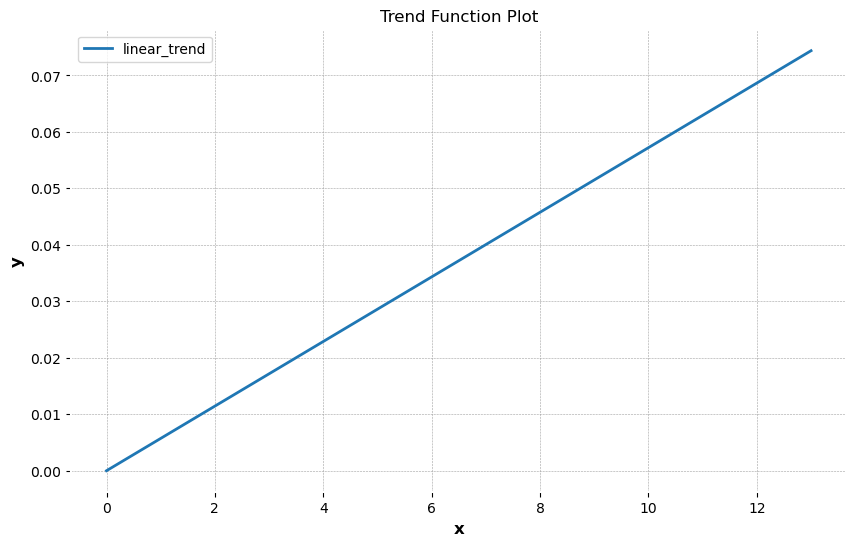

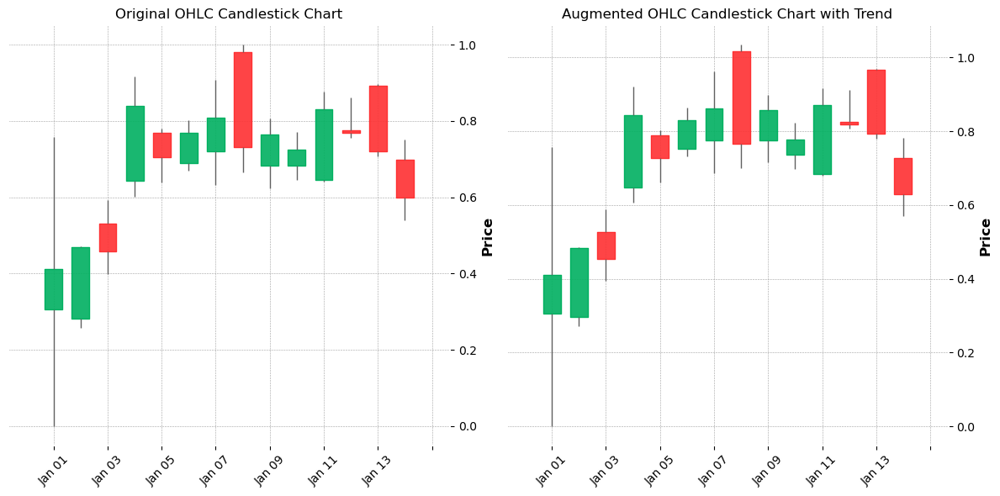


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.23430393939518887 frequency: 0.7536088489200065


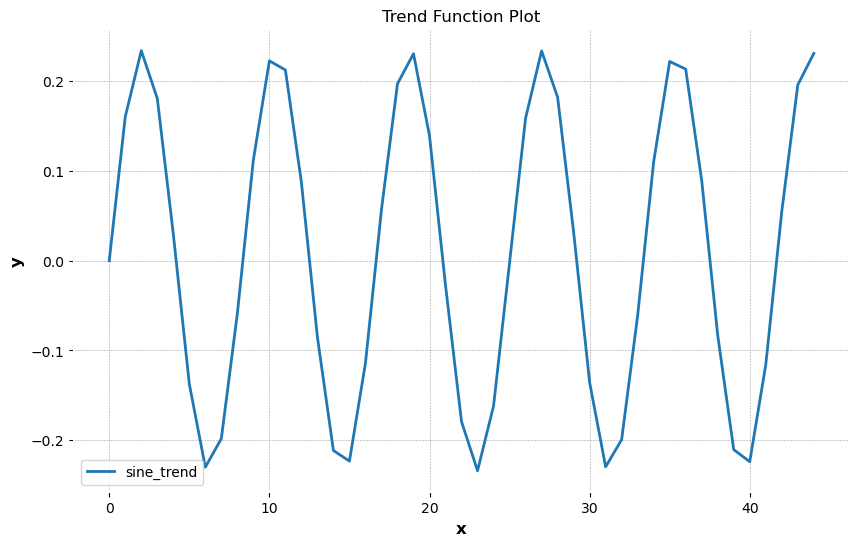

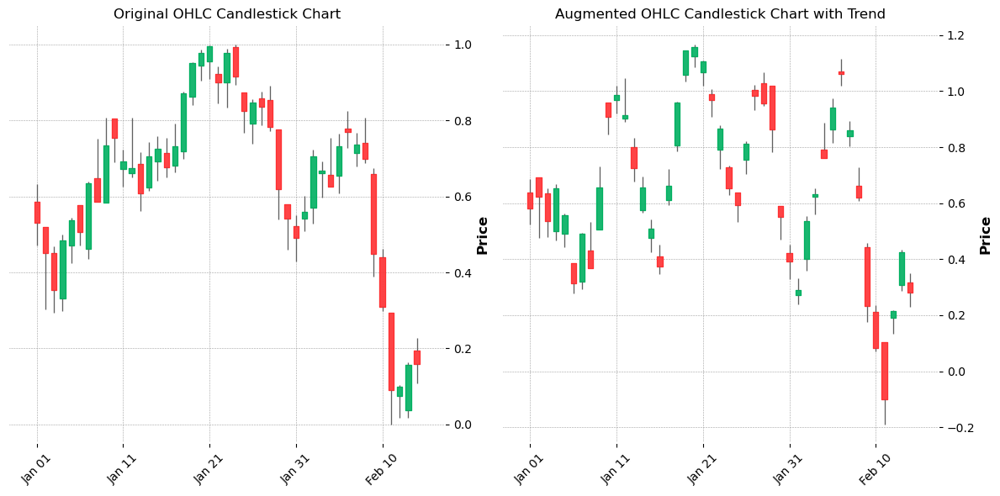


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.1567617876967463 frequency: 0.5993797172630269


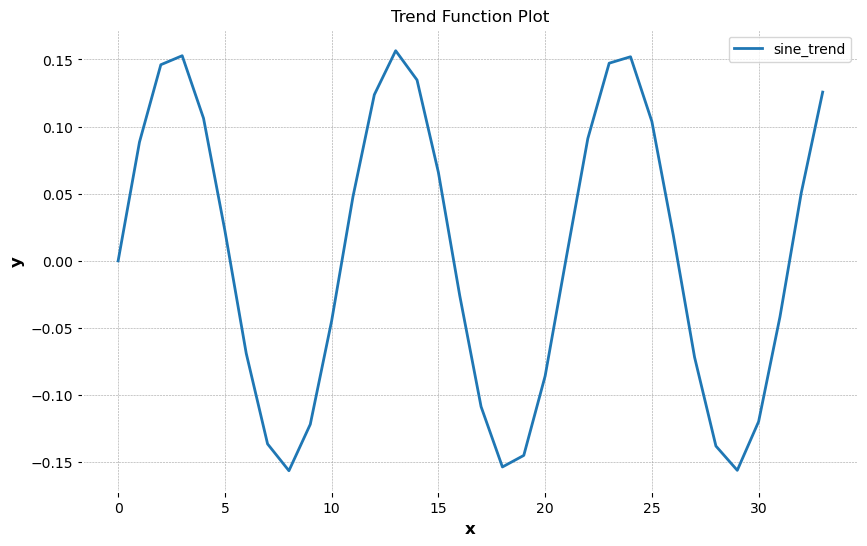

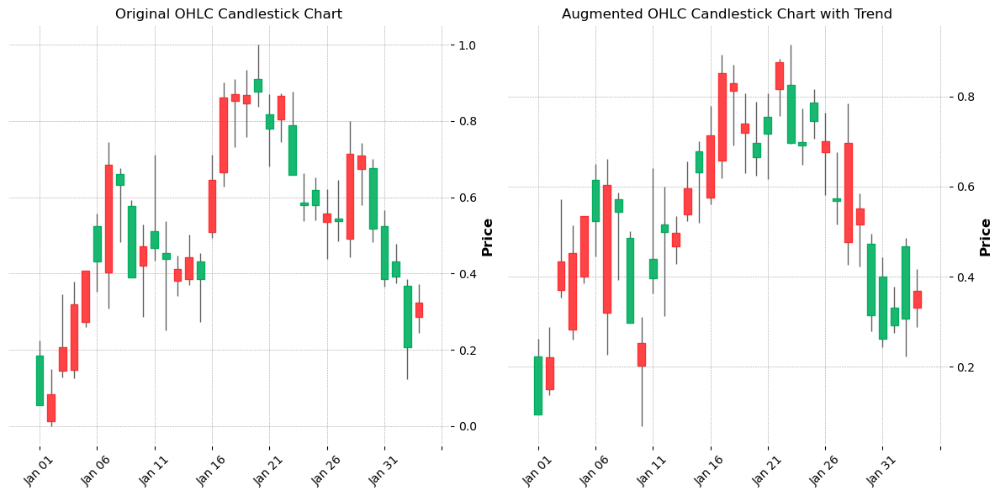


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.0013516755490730775


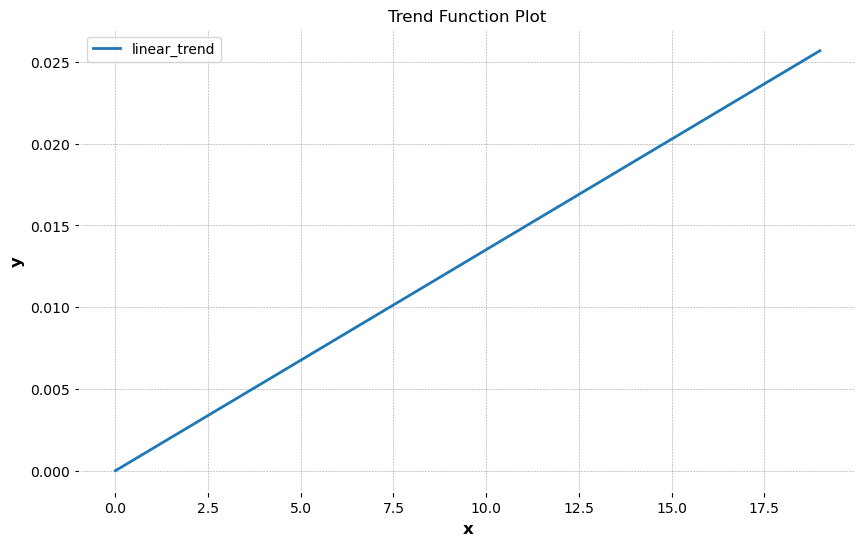

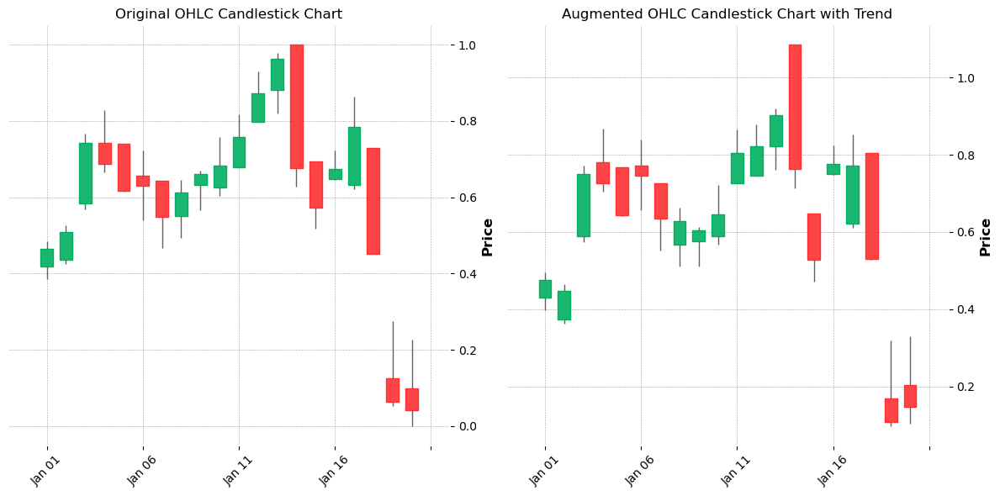


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.04284595213481141 frequency: 0.48285589679373714


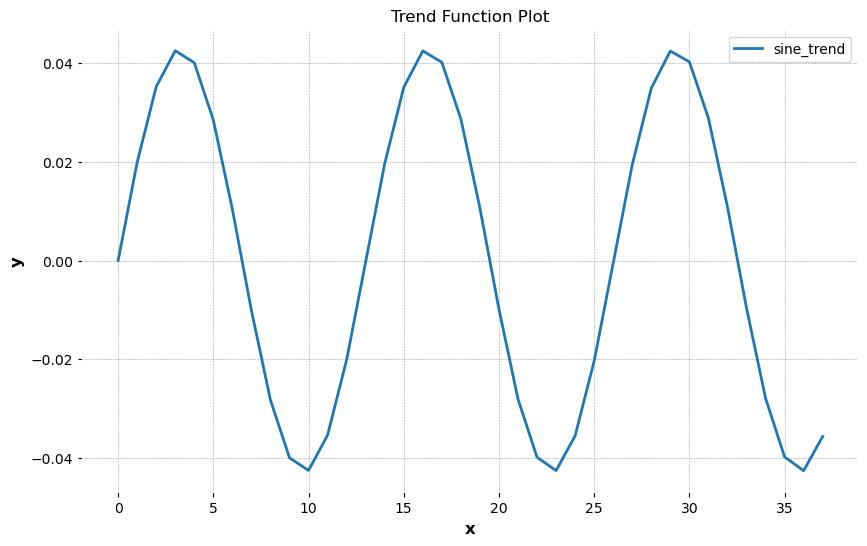

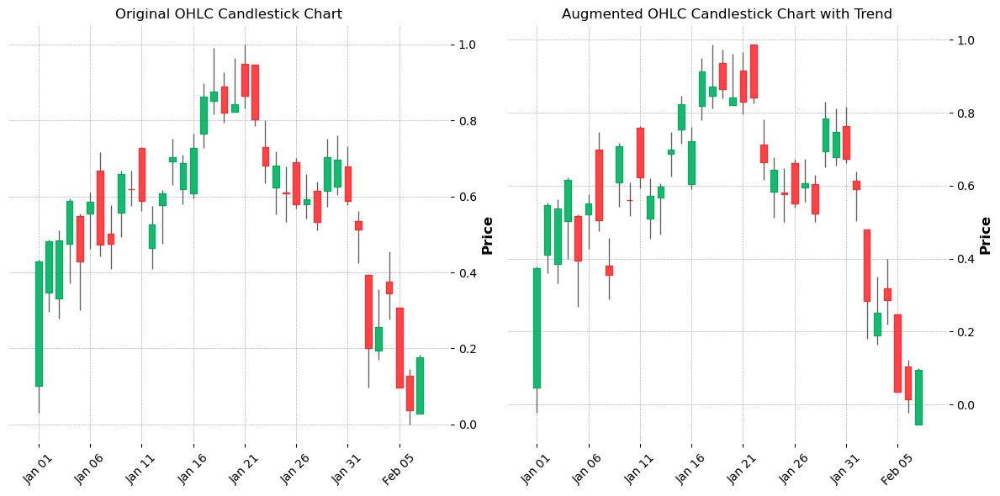


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 3.611941523836459e-06 b: 0.0038405167483031868


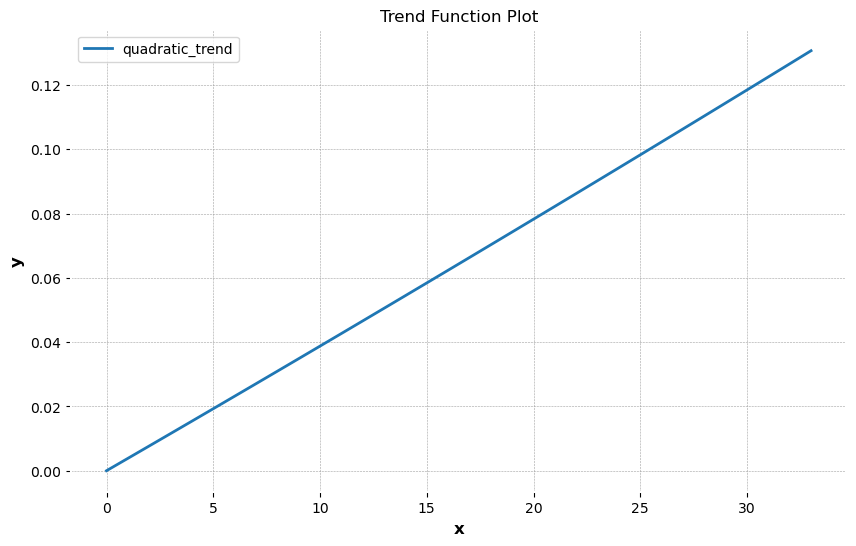

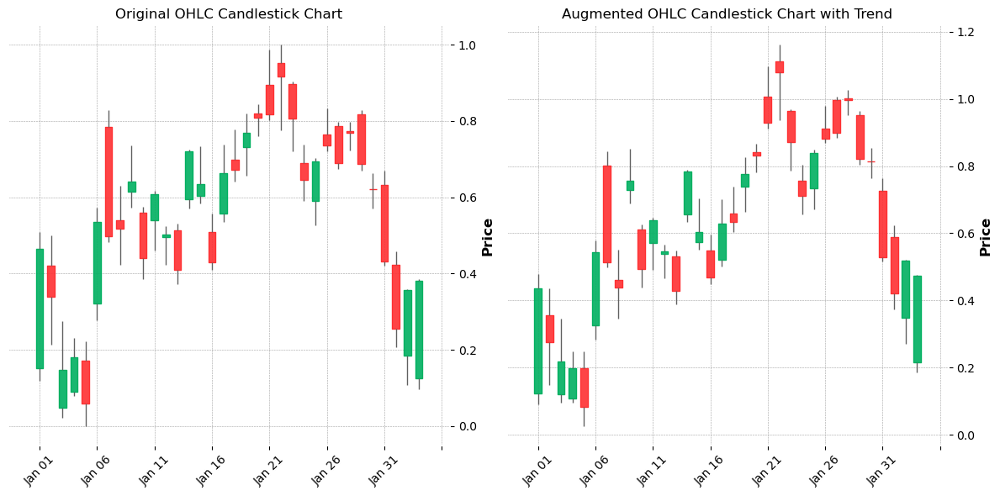


Selected Chart Pattern: 3

Selected Trend Function: linear_trend
slope: 0.002470942127645473


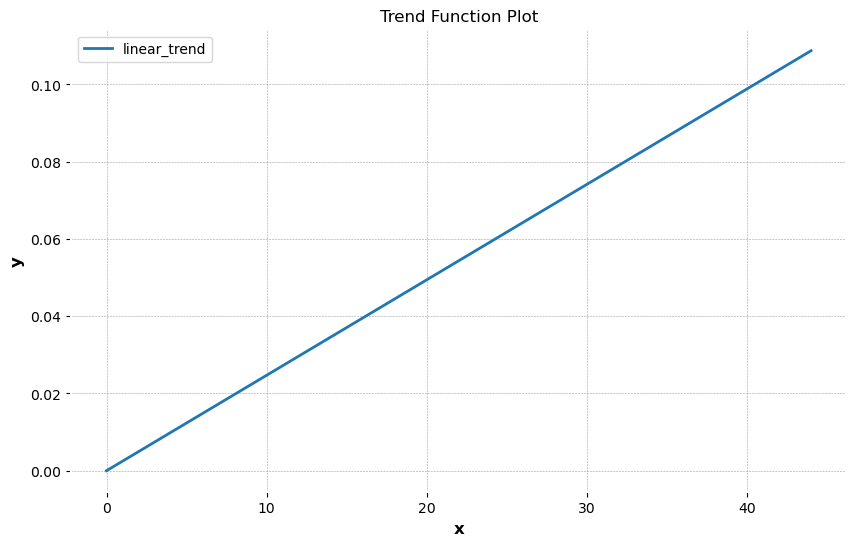

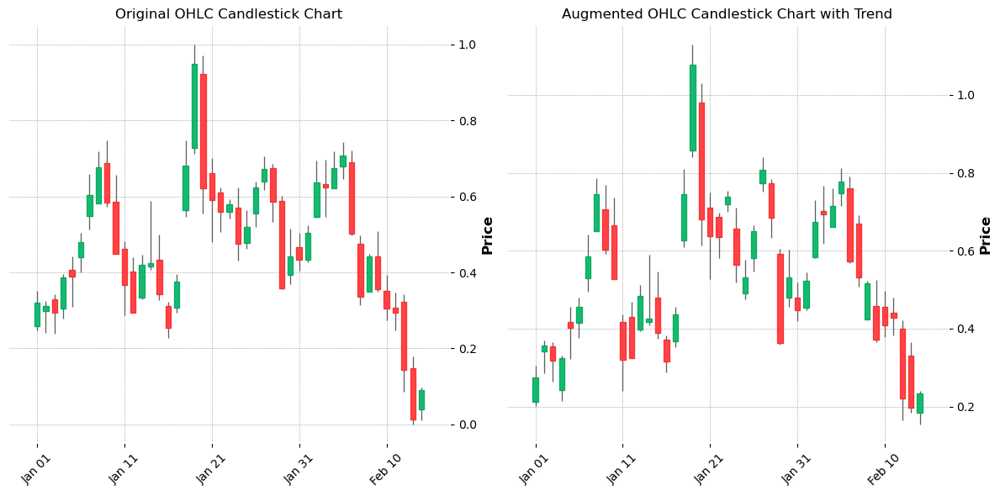


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 0.00011593901068135569 b: 0.00558182282665792


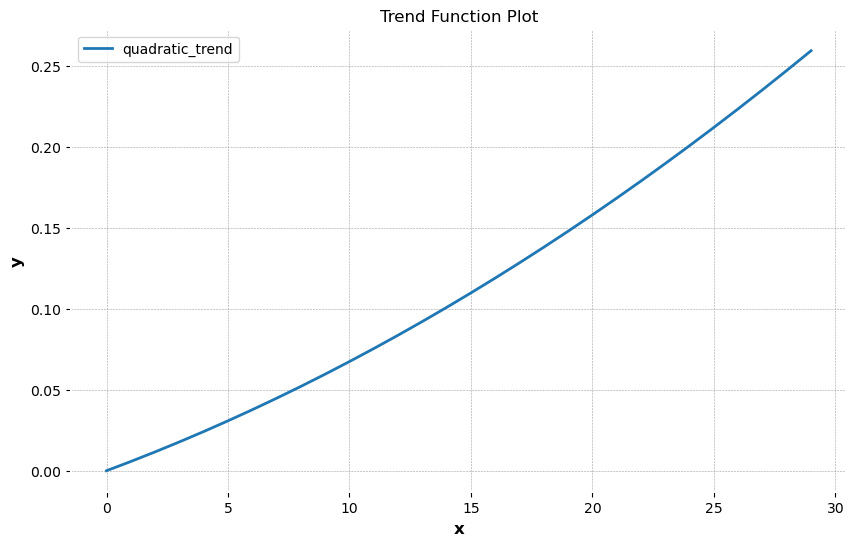

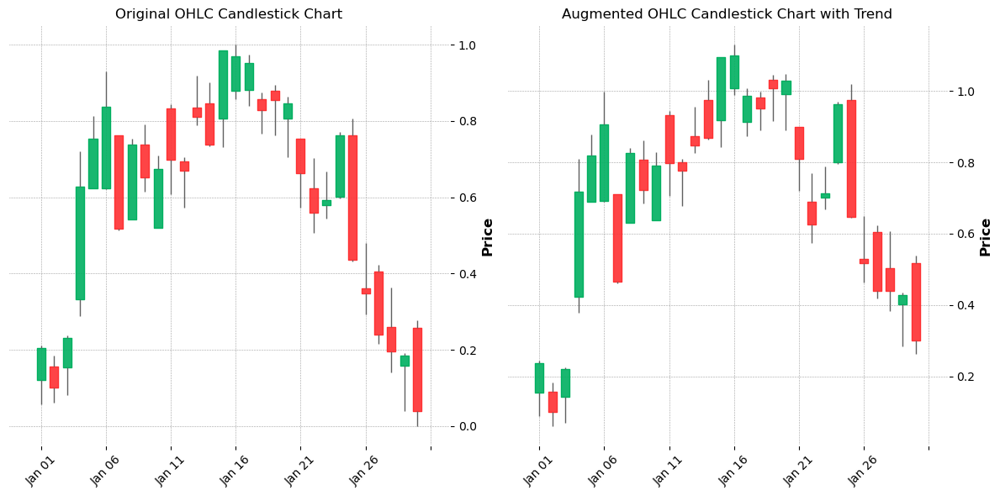


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 0.00011246631536106212 b: 0.0011839104507585644


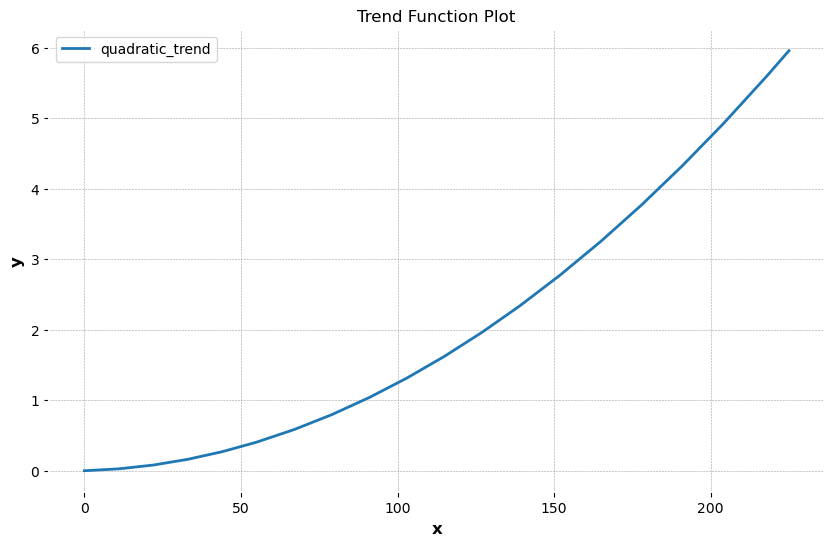

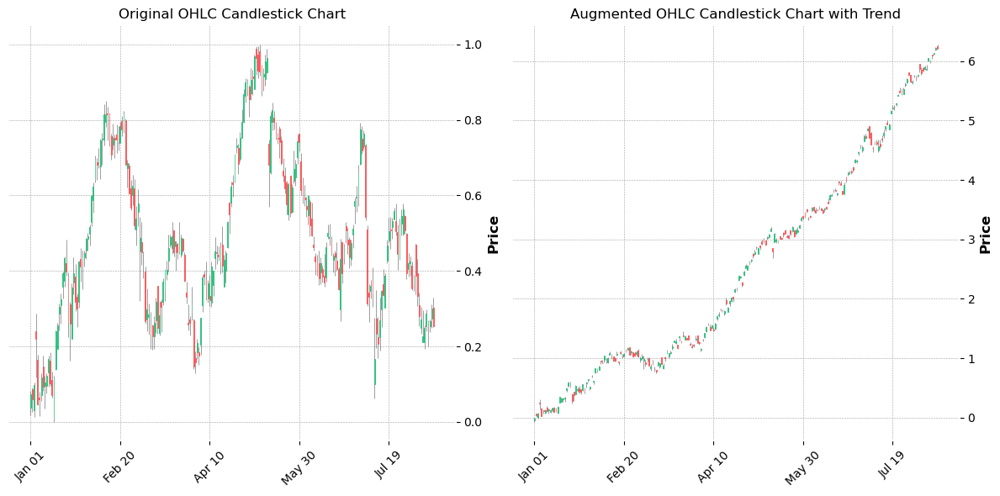


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.019965730139073424 frequency: 0.5496262020298429


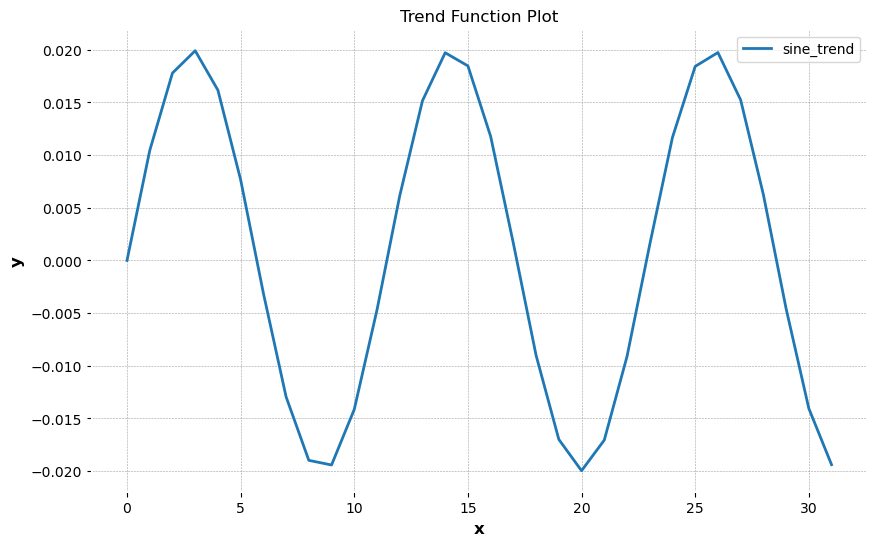

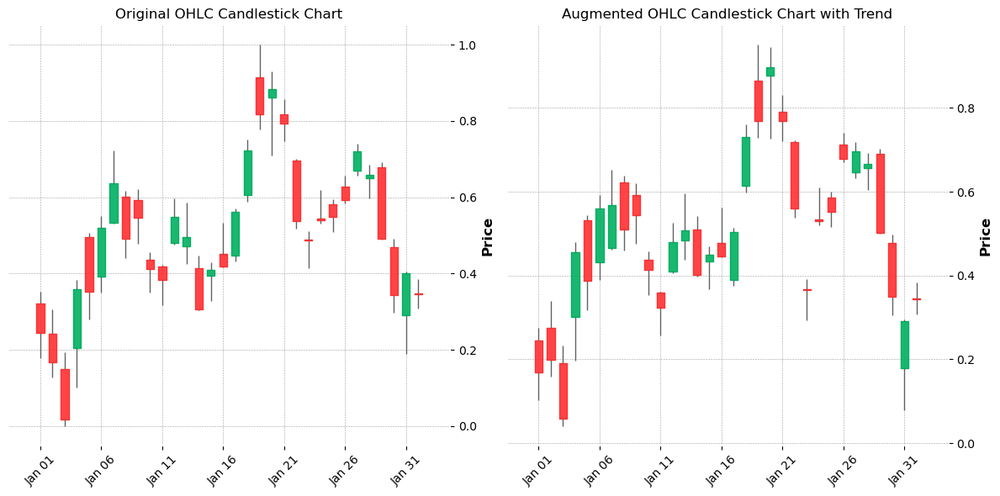


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.11509160023480514 frequency: 0.6495745656795898


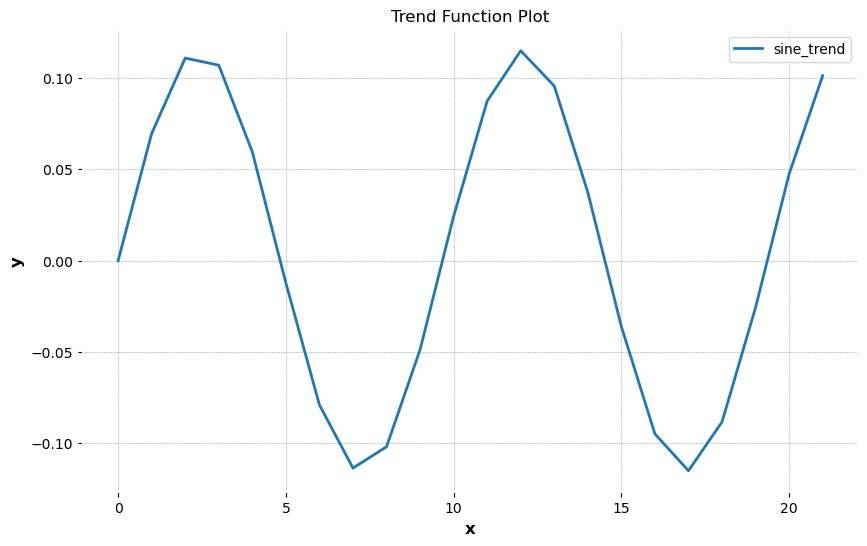

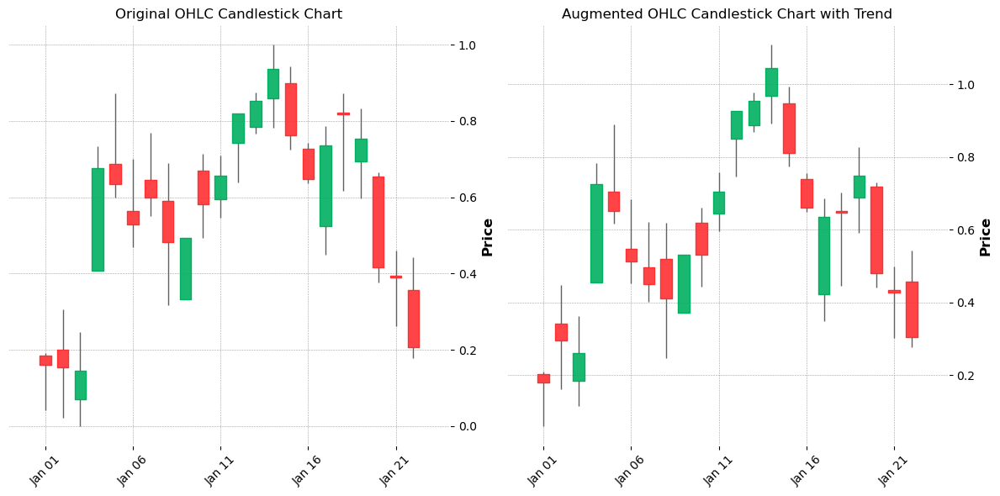


Selected Chart Pattern: 3

Selected Trend Function: quadratic_trend
a: 5.402822250879069e-05 b: 0.0032969478117094524


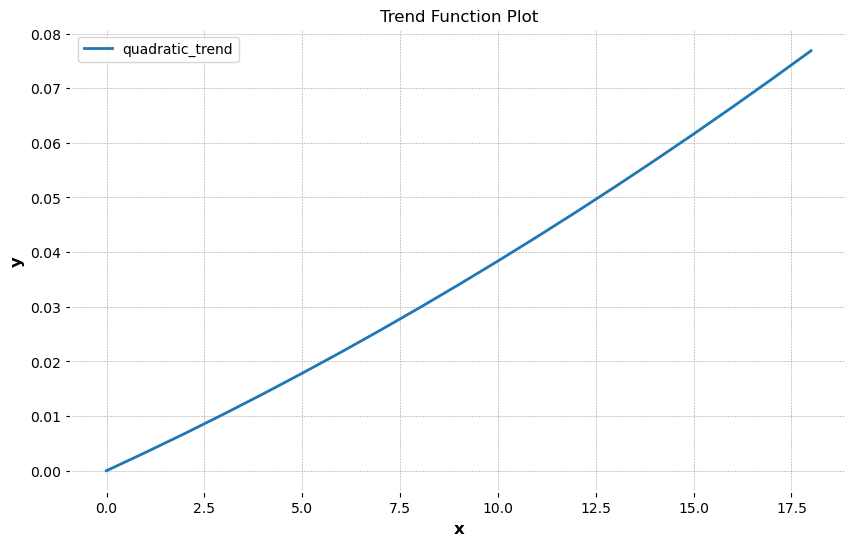

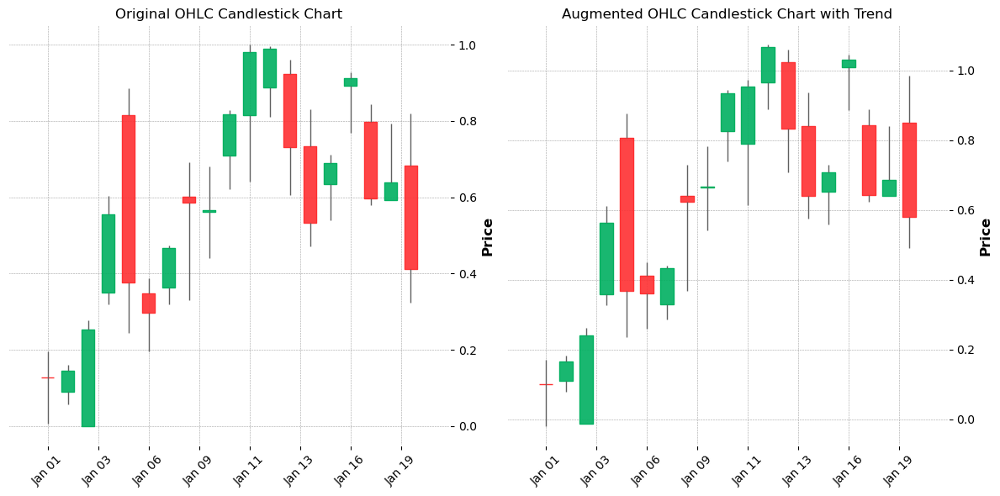


Selected Chart Pattern: 3

Selected Trend Function: sine_trend
amplitude: 0.056103004595606396 frequency: 0.3449721046306449


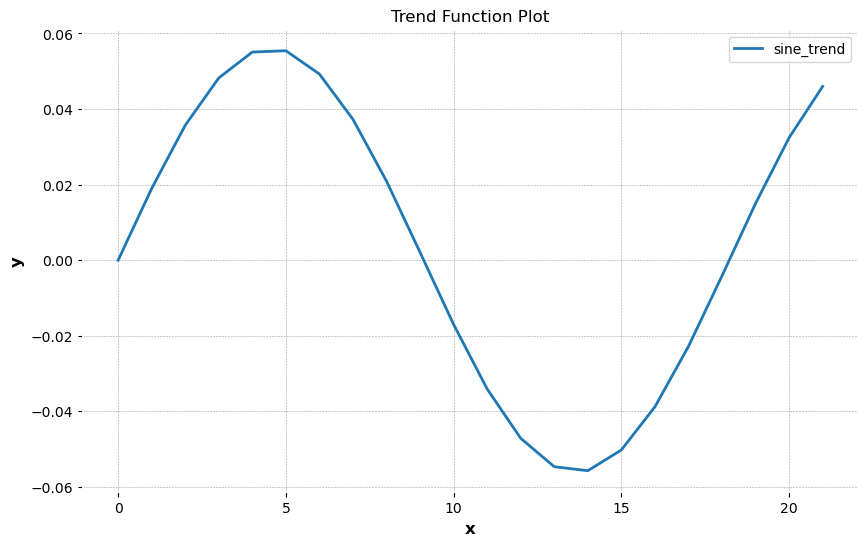

KeyboardInterrupt: 

In [29]:
# augment train dataset
trainDataset_aug = traindata_augment(trainDataset)

# shape of the augmented train dataset
print(f'Training Set Shape: {trainDataset_aug.shape}')

# Rocket test after augment


In [ ]:
# Create a temporary DataFrame with level 0 indexes and the 'Pattern' column
temp_df = trainDataset_aug.reset_index(level=0)  # Resetting level 1 index to create a flat DataFrame
# drop all the columns except the 'Pattern' column and the Level_0 column
temp_df = temp_df[['level_0','Pattern']]

# drop all the duplicate rows in the temp_df dataframe
temp_df = temp_df.drop_duplicates()

# get the number of each unique value in the 'Pattern' column
pattern_counts = temp_df['Pattern'].value_counts()
print(pattern_counts)

Pattern
4    500
1    500
6    500
0    500
5    500
7    500
3    500
2    500
Name: count, dtype: int64


In [ ]:
X_train_aug = trainDataset_aug.drop(columns='Pattern')
y_train_aug = trainDataset_aug['Pattern']

# drop level 1 indexes from y_train_aug
y_train_aug = y_train_aug.droplevel(1)
# now group the y_train_aug by their indexes
y_train_aug = y_train_aug.groupby(y_train_aug.index).first()

# Display the shapes of the training and testing sets
print(f"X_train_aug Shape: {X_train_aug.shape}, y_train_aug Shape: {y_train_aug.shape}")

# check if the data types are correct
check_is_mtype(X_train_aug, mtype="pd-multiindex", return_metadata=True)


X_train_aug Shape: (147950, 5), y_train_aug Shape: (4000,)


(True,
 None,
 {'is_univariate': False,
  'is_empty': False,
  'has_nans': False,
  'n_features': 5,
  'feature_names': ['Open', 'High', 'Low', 'Close', 'Volume'],
  'dtypekind_dfip': [<DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>],
  'feature_kind': [<DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>,
   <DtypeKind.FLOAT: 2>],
  'n_instances': 4000,
  'is_one_series': False,
  'is_equal_length': False,
  'is_equally_spaced': True,
  'n_panels': 1,
  'is_one_panel': True,
  'mtype': 'pd-multiindex',
  'scitype': 'Panel'})

Accuracy: 0.78


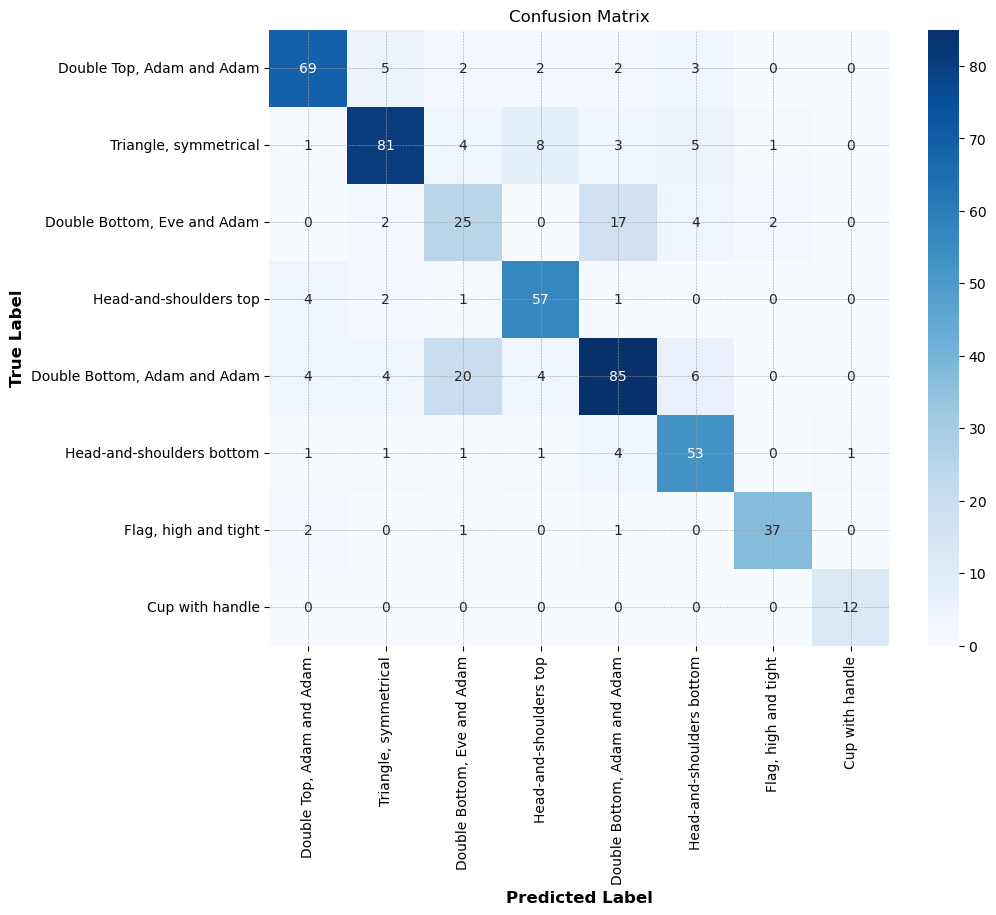

In [ ]:
from sktime.classification.kernel_based import RocketClassifier
from sktime.transformations.panel.padder import PaddingTransformer
from sktime.datasets import load_unit_test
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

my_padded_multi_rocket_aug = PaddingTransformer() * RocketClassifier(rocket_transform='multirocket')
my_padded_multi_rocket_aug.fit(X_train_aug, y_train_aug)
y_pred_multi_aug = my_padded_multi_rocket_aug.predict(X_test) 

# calculate the accuracy of the model
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred_multi_aug)
print(f"Accuracy: {accuracy:.2f}")

# Create the confusion matrix
cm3 = confusion_matrix(y_test, y_pred_multi_aug)

# Create a DataFrame from the confusion matrix
cm_df3 = pd.DataFrame(cm3, index=pattern_encoding.keys(), columns=pattern_encoding.keys())

# Create the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cm_df3, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()
